In [1]:
from platform import python_version
print('Notebook was originally ran with Python version:')
print(python_version())

Notebook was originally ran with Python version:
3.6.6


In [2]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset
from torch.utils.data import DataLoader
from DataPreparation.dataset_preparation import get_SVHN_dataset
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline
%load_ext autoreload
%autoreload 2

# A. Load the Dataset
Set the data directory to the path where the following files exist: train_32x32.mat, test_32x32.mat <br>

In [3]:
data_dir = 'Dataset/SVHN/'
validation_split = 0.2
seed = 6135

In [4]:
X_train, y_train, X_val, y_val, X_test, y_test, X_train_max = get_SVHN_dataset(data_dir, validation_split,
                                                                                   seed, zero_mean=True, normalize=True)
scale = lambda img: X_train_max * ((img / 2) + 0.5)
print('X_train shape: ', X_train.shape)
print('y_train shape: ', y_train.shape)
print('X_val shape: ', X_test.shape)
print('y_val shape: ', y_test.shape)
print('X_test shape: ', X_test.shape)
print('y_test shape: ', y_test.shape)

Generating numpy dataset from existing .mat files in Dataset/SVHN/
X_train shape:  (58606, 3, 32, 32)
y_train shape:  (58606,)
X_val shape:  (26032, 3, 32, 32)
y_val shape:  (26032,)
X_test shape:  (26032, 3, 32, 32)
y_test shape:  (26032,)


### Visualization sanity check

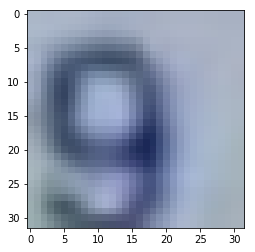

In [5]:
plt.imshow(np.transpose(scale(X_test[250]), (1, 2, 0)).astype('uint8'))
plt.show()

In [6]:
batch_size = 256
X_train_ = TensorDataset(torch.from_numpy(X_train))
loader_train  = DataLoader(X_train_, batch_size=batch_size, shuffle=True)

X_val_ = TensorDataset(torch.from_numpy(X_val))
loader_val = DataLoader(X_val_, batch_size=batch_size, shuffle=False)

X_test_ = TensorDataset(torch.from_numpy(X_test))
loader_test = DataLoader(X_test_, batch_size=batch_size, shuffle=False)

# B. Train the Model

### Select device

In [7]:
# CUDA for PyTorch
use_cuda = torch.cuda.is_available()
device = torch.device("cuda:0" if use_cuda else "cpu")
print('Using device=GPU') if use_cuda else print('Using device=CPU')

Using device=GPU


### VAE

In [8]:
from models.vae import VAE
num_latent = 100
model = VAE(num_latent).to(device)

In [9]:
# Hyperparameters
learning_rate = 3e-4
num_epochs = 100

In [10]:
from utils.train_eval_utils import train_model
print('~~~ Training with GPU ~~~') if use_cuda else print('~~~ Training with CPU ~~~\n')
num_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print('Model has %.2fM trainable parameters.\n' % (num_params/1e6))

optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
train_history = train_model(model, optimizer, loader_train,
                            loader_val, num_epochs,
                            device)

~~~ Training with GPU ~~~
Model has 12.80M trainable parameters.

Epoch 1:
Train: elbo -276.1525, likelihood -260.6026, KL 15.5498
Validation: elbo -168.1670, likelihood -146.5896, KL 21.5774
-----------
Epoch 2:
Train: elbo -151.4375, likelihood -127.2849, KL 24.1526
Validation: elbo -134.7575, likelihood -108.3386, KL 26.4190
-----------
Epoch 3:
Train: elbo -120.9644, likelihood -93.5450, KL 27.4195
Validation: elbo -112.9022, likelihood -85.2199, KL 27.6823
-----------
Epoch 4:
Train: elbo -106.0983, likelihood -78.2769, KL 27.8214
Validation: elbo -99.5191, likelihood -71.4417, KL 28.0773
-----------
Epoch 5:
Train: elbo -99.4730, likelihood -70.9847, KL 28.4882
Validation: elbo -96.0356, likelihood -67.1766, KL 28.8590
-----------
Epoch 6:
Train: elbo -97.2771, likelihood -68.2485, KL 29.0286
Validation: elbo -93.1466, likelihood -63.7636, KL 29.3829
-----------
Epoch 7:
Train: elbo -94.6584, likelihood -65.1330, KL 29.5254
Validation: elbo -94.6000, likelihood -64.4159, KL 30.18

Epoch 62:
Train: elbo -75.9283, likelihood -43.4426, KL 32.4857
Validation: elbo -81.2247, likelihood -48.7859, KL 32.4387
-----------
Epoch 63:
Train: elbo -75.4430, likelihood -42.9768, KL 32.4662
Validation: elbo -79.8491, likelihood -47.2399, KL 32.6092
-----------
Epoch 64:
Train: elbo -75.3078, likelihood -42.8171, KL 32.4907
Validation: elbo -80.4558, likelihood -47.6223, KL 32.8335
-----------
Epoch 65:
Train: elbo -75.6028, likelihood -43.1221, KL 32.4807
Validation: elbo -79.7974, likelihood -47.1657, KL 32.6317
-----------
Epoch 66:
Train: elbo -75.4615, likelihood -43.0020, KL 32.4595
Validation: elbo -80.0851, likelihood -47.6173, KL 32.4678
-----------
Epoch 67:
Train: elbo -75.4454, likelihood -42.9919, KL 32.4535
Validation: elbo -80.2258, likelihood -47.8408, KL 32.3850
-----------
Epoch 68:
Train: elbo -75.1015, likelihood -42.5522, KL 32.5493
Validation: elbo -80.9724, likelihood -47.8440, KL 33.1284
-----------
Epoch 69:
Train: elbo -74.7872, likelihood -42.3393, KL

In [11]:
PATH = 'vae100.pt'
torch.save(model, PATH)

### GAN

In [12]:
from models.gan import Generator, Discriminator
num_latent = 100
generator = Generator(num_latent).to(device)
discriminator = Discriminator().to(device)

In [13]:
# Hyperparameters
learning_rate = 1e-4
b1 = 0.5
b2 = 0.999
num_iterations = 20000
d_iterations = 5

~~~ Training with GPU ~~~
Generator has 12.14M trainable parameters.
Discriminator has 2.64M trainable parameters.

Iteration: 0, Loss generator: -3.112748384475708, Loss discriminator 3.278684139251709
Iteration: 1, Loss generator: -8.865108489990234, Loss discriminator 10.55922794342041
Iteration: 2, Loss generator: -11.9951753616333, Loss discriminator 17.231998443603516
Iteration: 3, Loss generator: -14.147199630737305, Loss discriminator 22.628780364990234
Iteration: 4, Loss generator: -15.861732482910156, Loss discriminator 26.640361785888672
Iteration: 5, Loss generator: -17.391117095947266, Loss discriminator 30.549551010131836
Iteration: 6, Loss generator: -18.780879974365234, Loss discriminator 33.79334259033203
Iteration: 7, Loss generator: -20.17337417602539, Loss discriminator 37.163692474365234
Iteration: 8, Loss generator: -21.51459312438965, Loss discriminator 40.028228759765625
Iteration: 9, Loss generator: -22.8377685546875, Loss discriminator 42.76991271972656
Iterat

Iteration: 92, Loss generator: -128.83731079101562, Loss discriminator 253.63987731933594
Iteration: 93, Loss generator: -129.7627410888672, Loss discriminator 256.17889404296875
Iteration: 94, Loss generator: -132.73968505859375, Loss discriminator 262.2618408203125
Iteration: 95, Loss generator: -132.67079162597656, Loss discriminator 265.25775146484375
Iteration: 96, Loss generator: -134.16983032226562, Loss discriminator 266.42828369140625
Iteration: 97, Loss generator: -132.5130615234375, Loss discriminator 255.4804229736328
Iteration: 98, Loss generator: -130.462158203125, Loss discriminator 260.7015380859375
Iteration: 99, Loss generator: -127.99557495117188, Loss discriminator 264.3682861328125
Iteration: 100, Loss generator: -138.5281982421875, Loss discriminator 270.513671875
Iteration: 101, Loss generator: -140.45721435546875, Loss discriminator 277.5664978027344
Iteration: 102, Loss generator: -145.81097412109375, Loss discriminator 285.25433349609375
Iteration: 103, Loss g

Iteration: 184, Loss generator: -56.0412712097168, Loss discriminator 185.55120849609375
Iteration: 185, Loss generator: -116.17474365234375, Loss discriminator 273.39324951171875
Iteration: 186, Loss generator: -124.10714721679688, Loss discriminator 301.7684020996094
Iteration: 187, Loss generator: -101.57422637939453, Loss discriminator 303.7641906738281
Iteration: 188, Loss generator: -79.4825210571289, Loss discriminator 217.09829711914062
Iteration: 189, Loss generator: -97.36771392822266, Loss discriminator 264.35223388671875
Iteration: 190, Loss generator: -92.63479614257812, Loss discriminator 262.3870849609375
Iteration: 191, Loss generator: -107.45802307128906, Loss discriminator 237.81735229492188
Iteration: 192, Loss generator: -97.56185913085938, Loss discriminator 272.67974853515625
Iteration: 193, Loss generator: -108.8232650756836, Loss discriminator 263.168212890625
Iteration: 194, Loss generator: -82.28162384033203, Loss discriminator 239.94851684570312
Iteration: 19

Iteration: 276, Loss generator: -27.83201026916504, Loss discriminator 167.0705108642578
Iteration: 277, Loss generator: 12.185688972473145, Loss discriminator 191.7254180908203
Iteration: 278, Loss generator: 27.480026245117188, Loss discriminator 179.79959106445312
Iteration: 279, Loss generator: 33.69252014160156, Loss discriminator 170.25021362304688
Iteration: 280, Loss generator: 14.663663864135742, Loss discriminator 156.1859130859375
Iteration: 281, Loss generator: -13.839905738830566, Loss discriminator 179.2841796875
Iteration: 282, Loss generator: 3.9560065269470215, Loss discriminator 184.34567260742188
Iteration: 283, Loss generator: 57.13128662109375, Loss discriminator 134.38128662109375
Iteration: 284, Loss generator: 6.466555595397949, Loss discriminator 168.56912231445312
Iteration: 285, Loss generator: 0.14878153800964355, Loss discriminator 175.59295654296875
Iteration: 286, Loss generator: -2.7210214138031006, Loss discriminator 140.9442596435547
Iteration: 287, Lo

Iteration: 368, Loss generator: -34.51734924316406, Loss discriminator 229.15802001953125
Iteration: 369, Loss generator: -53.48020553588867, Loss discriminator 201.09451293945312
Iteration: 370, Loss generator: -13.385589599609375, Loss discriminator 177.93667602539062
Iteration: 371, Loss generator: -40.3611946105957, Loss discriminator 205.15487670898438
Iteration: 372, Loss generator: -75.28392028808594, Loss discriminator 220.4909210205078
Iteration: 373, Loss generator: 32.88019561767578, Loss discriminator 251.9912109375
Iteration: 374, Loss generator: -58.25208282470703, Loss discriminator 216.1077880859375
Iteration: 375, Loss generator: -44.62068176269531, Loss discriminator 200.6106414794922
Iteration: 376, Loss generator: 27.034210205078125, Loss discriminator 237.62173461914062
Iteration: 377, Loss generator: 48.600921630859375, Loss discriminator 156.28659057617188
Iteration: 378, Loss generator: 26.17631721496582, Loss discriminator 242.23989868164062
Iteration: 379, Los

Iteration: 460, Loss generator: -40.67842102050781, Loss discriminator 341.08331298828125
Iteration: 461, Loss generator: -93.83465576171875, Loss discriminator 305.74066162109375
Iteration: 462, Loss generator: -15.089001655578613, Loss discriminator 286.910400390625
Iteration: 463, Loss generator: -48.166908264160156, Loss discriminator 303.87518310546875
Iteration: 464, Loss generator: -92.39557647705078, Loss discriminator 331.95147705078125
Iteration: 465, Loss generator: -57.90653991699219, Loss discriminator 365.736572265625
Iteration: 466, Loss generator: -77.87698364257812, Loss discriminator 389.1155090332031
Iteration: 467, Loss generator: -14.664606094360352, Loss discriminator 361.2965087890625
Iteration: 468, Loss generator: 49.474365234375, Loss discriminator 301.4416198730469
Iteration: 469, Loss generator: -39.54003143310547, Loss discriminator 253.05917358398438
Iteration: 470, Loss generator: -104.52615356445312, Loss discriminator 364.1145935058594
Iteration: 471, L

Iteration: 552, Loss generator: -198.34170532226562, Loss discriminator 324.1177978515625
Iteration: 553, Loss generator: -73.77770233154297, Loss discriminator 310.9665832519531
Iteration: 554, Loss generator: -238.5462646484375, Loss discriminator 313.477294921875
Iteration: 555, Loss generator: 212.21188354492188, Loss discriminator 461.4240417480469
Iteration: 556, Loss generator: 62.036800384521484, Loss discriminator 235.2955322265625
Iteration: 557, Loss generator: 22.522258758544922, Loss discriminator 271.17547607421875
Iteration: 558, Loss generator: -55.379913330078125, Loss discriminator 228.85610961914062
Iteration: 559, Loss generator: 11.512859344482422, Loss discriminator 322.604736328125
Iteration: 560, Loss generator: 37.174537658691406, Loss discriminator 410.56103515625
Iteration: 561, Loss generator: -147.34010314941406, Loss discriminator 319.25738525390625
Iteration: 562, Loss generator: -165.55360412597656, Loss discriminator 384.86767578125
Iteration: 563, Loss

Iteration: 644, Loss generator: 9.424102783203125, Loss discriminator 473.5365905761719
Iteration: 645, Loss generator: -119.67637634277344, Loss discriminator 480.7608642578125
Iteration: 646, Loss generator: -29.046062469482422, Loss discriminator 541.5433349609375
Iteration: 647, Loss generator: -105.51342010498047, Loss discriminator 414.9129333496094
Iteration: 648, Loss generator: -71.33912658691406, Loss discriminator 418.90936279296875
Iteration: 649, Loss generator: 14.350542068481445, Loss discriminator 365.2192077636719
Iteration: 650, Loss generator: -88.46174621582031, Loss discriminator 449.5282287597656
Iteration: 651, Loss generator: -127.79051971435547, Loss discriminator 476.7977294921875
Iteration: 652, Loss generator: 24.171253204345703, Loss discriminator 298.3603210449219
Iteration: 653, Loss generator: -36.30134582519531, Loss discriminator 415.403564453125
Iteration: 654, Loss generator: -13.362260818481445, Loss discriminator 166.55899047851562
Iteration: 655, 

Iteration: 736, Loss generator: -351.2076416015625, Loss discriminator 437.7327880859375
Iteration: 737, Loss generator: -63.88097381591797, Loss discriminator 297.045166015625
Iteration: 738, Loss generator: -67.38172149658203, Loss discriminator 303.8457336425781
Iteration: 739, Loss generator: -165.3278045654297, Loss discriminator 405.3096923828125
Iteration: 740, Loss generator: -306.42059326171875, Loss discriminator 410.1300964355469
Iteration: 741, Loss generator: -101.95415496826172, Loss discriminator 543.5048828125
Iteration: 742, Loss generator: 117.30821990966797, Loss discriminator 418.2939147949219
Iteration: 743, Loss generator: -35.582611083984375, Loss discriminator 388.6111145019531
Iteration: 744, Loss generator: 40.80296325683594, Loss discriminator 336.20672607421875
Iteration: 745, Loss generator: -45.403236389160156, Loss discriminator 538.6312866210938
Iteration: 746, Loss generator: -72.91829681396484, Loss discriminator 317.87451171875
Iteration: 747, Loss ge

Iteration: 829, Loss generator: -276.2684631347656, Loss discriminator 489.6546630859375
Iteration: 830, Loss generator: -202.22021484375, Loss discriminator 542.0860595703125
Iteration: 831, Loss generator: -77.37974548339844, Loss discriminator 369.0595703125
Iteration: 832, Loss generator: -60.51689147949219, Loss discriminator 518.7628784179688
Iteration: 833, Loss generator: -196.90145874023438, Loss discriminator 488.84033203125
Iteration: 834, Loss generator: 33.717018127441406, Loss discriminator 377.4422912597656
Iteration: 835, Loss generator: 13.614921569824219, Loss discriminator 508.2579345703125
Iteration: 836, Loss generator: 120.31591796875, Loss discriminator 600.1859130859375
Iteration: 837, Loss generator: 138.04779052734375, Loss discriminator 530.002685546875
Iteration: 838, Loss generator: -131.45550537109375, Loss discriminator 517.7492065429688
Iteration: 839, Loss generator: 35.75385284423828, Loss discriminator 526.1841430664062
Iteration: 840, Loss generator:

Iteration: 922, Loss generator: 195.4465789794922, Loss discriminator 22.9566650390625
Iteration: 923, Loss generator: 160.32716369628906, Loss discriminator 77.81088256835938
Iteration: 924, Loss generator: 94.42242431640625, Loss discriminator -1.4984893798828125
Iteration: 925, Loss generator: 26.478824615478516, Loss discriminator 101.079345703125
Iteration: 926, Loss generator: 2.017991542816162, Loss discriminator 100.25675201416016
Iteration: 927, Loss generator: -24.75611114501953, Loss discriminator 144.54905700683594
Iteration: 928, Loss generator: -126.88638305664062, Loss discriminator 183.33322143554688
Iteration: 929, Loss generator: -94.18885803222656, Loss discriminator 232.47154235839844
Iteration: 930, Loss generator: 19.98724937438965, Loss discriminator 256.624267578125
Iteration: 931, Loss generator: -9.137843132019043, Loss discriminator 336.72564697265625
Iteration: 932, Loss generator: 93.56561279296875, Loss discriminator 185.41250610351562
Iteration: 933, Loss

Iteration: 1014, Loss generator: 199.5484161376953, Loss discriminator 439.3277587890625
Iteration: 1015, Loss generator: 87.78596496582031, Loss discriminator 295.1778259277344
Iteration: 1016, Loss generator: 51.17997741699219, Loss discriminator 218.56063842773438
Iteration: 1017, Loss generator: 41.76813507080078, Loss discriminator 311.85552978515625
Iteration: 1018, Loss generator: 131.9424285888672, Loss discriminator 290.1911926269531
Iteration: 1019, Loss generator: -152.072021484375, Loss discriminator 324.6268615722656
Iteration: 1020, Loss generator: 26.478784561157227, Loss discriminator 217.63491821289062
Iteration: 1021, Loss generator: 40.10905075073242, Loss discriminator 244.815673828125
Iteration: 1022, Loss generator: 130.93894958496094, Loss discriminator 345.0013122558594
Iteration: 1023, Loss generator: -190.37637329101562, Loss discriminator 404.75677490234375
Iteration: 1024, Loss generator: 206.77346801757812, Loss discriminator 450.41778564453125
Iteration: 1

Iteration: 1106, Loss generator: 76.07415008544922, Loss discriminator 60.30780029296875
Iteration: 1107, Loss generator: 75.04692840576172, Loss discriminator 67.115478515625
Iteration: 1108, Loss generator: 97.55742645263672, Loss discriminator 74.77992248535156
Iteration: 1109, Loss generator: 68.2470932006836, Loss discriminator 72.15045166015625
Iteration: 1110, Loss generator: 23.039443969726562, Loss discriminator 123.45176696777344
Iteration: 1111, Loss generator: -54.92138671875, Loss discriminator 89.00820922851562
Iteration: 1112, Loss generator: -39.08095932006836, Loss discriminator 117.91546630859375
Iteration: 1113, Loss generator: -29.980091094970703, Loss discriminator 140.39251708984375
Iteration: 1114, Loss generator: -29.524978637695312, Loss discriminator 105.29196166992188
Iteration: 1115, Loss generator: -6.679913520812988, Loss discriminator 164.87127685546875
Iteration: 1116, Loss generator: 46.20435333251953, Loss discriminator 254.90484619140625
Iteration: 11

Iteration: 1198, Loss generator: -2.7781829833984375, Loss discriminator 602.9185791015625
Iteration: 1199, Loss generator: 162.89759826660156, Loss discriminator 327.14794921875
Iteration: 1200, Loss generator: 192.33175659179688, Loss discriminator 305.1185302734375
Iteration: 1201, Loss generator: 199.39874267578125, Loss discriminator 255.37472534179688
Iteration: 1202, Loss generator: 53.822998046875, Loss discriminator 389.8409423828125
Iteration: 1203, Loss generator: 140.30117797851562, Loss discriminator 541.81884765625
Iteration: 1204, Loss generator: 223.54946899414062, Loss discriminator 521.6309814453125
Iteration: 1205, Loss generator: -34.529537200927734, Loss discriminator 261.66229248046875
Iteration: 1206, Loss generator: 31.557771682739258, Loss discriminator 166.15328979492188
Iteration: 1207, Loss generator: -53.51823806762695, Loss discriminator 227.50637817382812
Iteration: 1208, Loss generator: -151.99996948242188, Loss discriminator 398.14215087890625
Iteration

Iteration: 1289, Loss generator: 170.94833374023438, Loss discriminator 244.3494873046875
Iteration: 1290, Loss generator: 411.1033935546875, Loss discriminator 378.3983459472656
Iteration: 1291, Loss generator: 77.25579833984375, Loss discriminator 112.51790618896484
Iteration: 1292, Loss generator: 23.029016494750977, Loss discriminator 228.14224243164062
Iteration: 1293, Loss generator: -35.27125549316406, Loss discriminator 180.63246154785156
Iteration: 1294, Loss generator: -208.22528076171875, Loss discriminator 318.2052307128906
Iteration: 1295, Loss generator: -253.62841796875, Loss discriminator 358.6760559082031
Iteration: 1296, Loss generator: 0.7724441289901733, Loss discriminator 398.96356201171875
Iteration: 1297, Loss generator: -50.93728256225586, Loss discriminator 269.1199645996094
Iteration: 1298, Loss generator: -97.38145446777344, Loss discriminator 345.22021484375
Iteration: 1299, Loss generator: 98.46913146972656, Loss discriminator 437.10394287109375
Iteration: 

Iteration: 1380, Loss generator: -12.023626327514648, Loss discriminator 282.6586608886719
Iteration: 1381, Loss generator: 106.9510269165039, Loss discriminator 212.16156005859375
Iteration: 1382, Loss generator: 179.62344360351562, Loss discriminator 305.11114501953125
Iteration: 1383, Loss generator: -21.150917053222656, Loss discriminator 188.81851196289062
Iteration: 1384, Loss generator: -22.429325103759766, Loss discriminator 267.9977111816406
Iteration: 1385, Loss generator: -16.0078125, Loss discriminator 288.8558654785156
Iteration: 1386, Loss generator: 70.29084014892578, Loss discriminator 378.8936462402344
Iteration: 1387, Loss generator: 424.13671875, Loss discriminator 365.1667785644531
Iteration: 1388, Loss generator: -382.14593505859375, Loss discriminator 453.9259948730469
Iteration: 1389, Loss generator: -241.12933349609375, Loss discriminator 356.9295654296875
Iteration: 1390, Loss generator: -32.767967224121094, Loss discriminator 289.7466735839844
Iteration: 1391,

Iteration: 1472, Loss generator: 176.712158203125, Loss discriminator 184.39596557617188
Iteration: 1473, Loss generator: -93.67170715332031, Loss discriminator 331.4044189453125
Iteration: 1474, Loss generator: 247.2957305908203, Loss discriminator 152.41055297851562
Iteration: 1475, Loss generator: -163.43618774414062, Loss discriminator 299.1475830078125
Iteration: 1476, Loss generator: 111.24227905273438, Loss discriminator 387.8710021972656
Iteration: 1477, Loss generator: -39.45697784423828, Loss discriminator 314.0299072265625
Iteration: 1478, Loss generator: 63.388771057128906, Loss discriminator 330.42291259765625
Iteration: 1479, Loss generator: 246.58717346191406, Loss discriminator 44.769256591796875
Iteration: 1480, Loss generator: 185.5692138671875, Loss discriminator 42.64414978027344
Iteration: 1481, Loss generator: 164.17092895507812, Loss discriminator 16.744415283203125
Iteration: 1482, Loss generator: 136.3292694091797, Loss discriminator 26.243438720703125
Iteratio

Iteration: 1564, Loss generator: 166.55918884277344, Loss discriminator 196.72161865234375
Iteration: 1565, Loss generator: 87.66627502441406, Loss discriminator 172.95826721191406
Iteration: 1566, Loss generator: 23.09497833251953, Loss discriminator 193.52508544921875
Iteration: 1567, Loss generator: -115.23399353027344, Loss discriminator 241.8321075439453
Iteration: 1568, Loss generator: 156.6501922607422, Loss discriminator 74.63107299804688
Iteration: 1569, Loss generator: 142.50784301757812, Loss discriminator 92.33738708496094
Iteration: 1570, Loss generator: 147.8163299560547, Loss discriminator 88.52377319335938
Iteration: 1571, Loss generator: -20.373668670654297, Loss discriminator 120.64767456054688
Iteration: 1572, Loss generator: -114.43584442138672, Loss discriminator 192.60281372070312
Iteration: 1573, Loss generator: -34.836402893066406, Loss discriminator 232.4791259765625
Iteration: 1574, Loss generator: 25.282094955444336, Loss discriminator 186.9675750732422
Itera

Iteration: 1656, Loss generator: -129.16259765625, Loss discriminator 235.83401489257812
Iteration: 1657, Loss generator: 42.37162399291992, Loss discriminator 157.40924072265625
Iteration: 1658, Loss generator: 71.00701141357422, Loss discriminator 110.70442199707031
Iteration: 1659, Loss generator: 95.68495178222656, Loss discriminator 146.0052032470703
Iteration: 1660, Loss generator: -57.84761428833008, Loss discriminator 263.16864013671875
Iteration: 1661, Loss generator: 131.98062133789062, Loss discriminator 291.61627197265625
Iteration: 1662, Loss generator: 127.4673843383789, Loss discriminator 226.24807739257812
Iteration: 1663, Loss generator: 111.41773986816406, Loss discriminator 331.5228271484375
Iteration: 1664, Loss generator: 75.39057159423828, Loss discriminator 288.5361633300781
Iteration: 1665, Loss generator: -136.32131958007812, Loss discriminator 289.8168029785156
Iteration: 1666, Loss generator: 335.0172119140625, Loss discriminator 69.23660278320312
Iteration: 

Iteration: 1748, Loss generator: 127.91775512695312, Loss discriminator 444.0556335449219
Iteration: 1749, Loss generator: 13.070290565490723, Loss discriminator 374.13812255859375
Iteration: 1750, Loss generator: 101.40594482421875, Loss discriminator 392.8475341796875
Iteration: 1751, Loss generator: -302.2977294921875, Loss discriminator 363.7791748046875
Iteration: 1752, Loss generator: -75.92052459716797, Loss discriminator 497.04071044921875
Iteration: 1753, Loss generator: -264.7015075683594, Loss discriminator 391.453857421875
Iteration: 1754, Loss generator: -1.5208330154418945, Loss discriminator 260.0660095214844
Iteration: 1755, Loss generator: 77.01908874511719, Loss discriminator 301.11297607421875
Iteration: 1756, Loss generator: 76.54571533203125, Loss discriminator 564.1752319335938
Iteration: 1757, Loss generator: 81.84132385253906, Loss discriminator 264.546630859375
Iteration: 1758, Loss generator: 335.41241455078125, Loss discriminator 527.2932739257812
Iteration: 

Iteration: 1840, Loss generator: 22.19538116455078, Loss discriminator 536.2276000976562
Iteration: 1841, Loss generator: -48.58726501464844, Loss discriminator 246.40399169921875
Iteration: 1842, Loss generator: 126.7853012084961, Loss discriminator 254.12051391601562
Iteration: 1843, Loss generator: 396.3687744140625, Loss discriminator 236.2286376953125
Iteration: 1844, Loss generator: -125.49458312988281, Loss discriminator 203.70542907714844
Iteration: 1845, Loss generator: -11.498908996582031, Loss discriminator 195.965087890625
Iteration: 1846, Loss generator: -15.283469200134277, Loss discriminator 243.28952026367188
Iteration: 1847, Loss generator: 55.51015853881836, Loss discriminator 299.7478942871094
Iteration: 1848, Loss generator: 47.66490936279297, Loss discriminator 170.9264678955078
Iteration: 1849, Loss generator: 206.02017211914062, Loss discriminator 269.71435546875
Iteration: 1850, Loss generator: 207.35142517089844, Loss discriminator 446.2872009277344
Iteration: 

Iteration: 1932, Loss generator: 101.72405242919922, Loss discriminator 467.1229553222656
Iteration: 1933, Loss generator: 361.8109130859375, Loss discriminator 408.4482421875
Iteration: 1934, Loss generator: 90.65657043457031, Loss discriminator 147.1396484375
Iteration: 1935, Loss generator: -155.76736450195312, Loss discriminator 271.08428955078125
Iteration: 1936, Loss generator: -282.5394287109375, Loss discriminator 366.6060791015625
Iteration: 1937, Loss generator: -124.91909790039062, Loss discriminator 254.43118286132812
Iteration: 1938, Loss generator: 242.1836395263672, Loss discriminator 301.69866943359375
Iteration: 1939, Loss generator: 194.65362548828125, Loss discriminator 176.84986877441406
Iteration: 1940, Loss generator: -33.871009826660156, Loss discriminator 396.7174377441406
Iteration: 1941, Loss generator: 241.458984375, Loss discriminator 387.42083740234375
Iteration: 1942, Loss generator: 133.60765075683594, Loss discriminator 109.53005981445312
Iteration: 1943

Iteration: 2024, Loss generator: 127.88256072998047, Loss discriminator 345.36346435546875
Iteration: 2025, Loss generator: 249.35385131835938, Loss discriminator 465.53192138671875
Iteration: 2026, Loss generator: 114.77894592285156, Loss discriminator 0.0707855224609375
Iteration: 2027, Loss generator: 140.62777709960938, Loss discriminator 19.77154541015625
Iteration: 2028, Loss generator: 132.89813232421875, Loss discriminator 39.93113708496094
Iteration: 2029, Loss generator: 175.9933319091797, Loss discriminator 18.883956909179688
Iteration: 2030, Loss generator: 175.66529846191406, Loss discriminator 14.540176391601562
Iteration: 2031, Loss generator: 190.9881591796875, Loss discriminator 11.347915649414062
Iteration: 2032, Loss generator: 203.9860076904297, Loss discriminator 9.711776733398438
Iteration: 2033, Loss generator: 216.23875427246094, Loss discriminator 20.19476318359375
Iteration: 2034, Loss generator: 207.1873779296875, Loss discriminator 12.769302368164062
Iterati

Iteration: 2116, Loss generator: 176.7377471923828, Loss discriminator 62.16546630859375
Iteration: 2117, Loss generator: 148.51316833496094, Loss discriminator 97.60769653320312
Iteration: 2118, Loss generator: 194.572021484375, Loss discriminator 77.51731872558594
Iteration: 2119, Loss generator: 214.46905517578125, Loss discriminator 68.68280029296875
Iteration: 2120, Loss generator: 209.7979736328125, Loss discriminator 59.12678527832031
Iteration: 2121, Loss generator: 228.0258026123047, Loss discriminator 51.58985900878906
Iteration: 2122, Loss generator: 190.43438720703125, Loss discriminator 44.443878173828125
Iteration: 2123, Loss generator: 205.73757934570312, Loss discriminator 74.20315551757812
Iteration: 2124, Loss generator: 183.3466796875, Loss discriminator 84.63433837890625
Iteration: 2125, Loss generator: 192.4810028076172, Loss discriminator 73.40380859375
Iteration: 2126, Loss generator: 155.8945770263672, Loss discriminator 93.41545104980469
Iteration: 2127, Loss g

Iteration: 2208, Loss generator: -28.201749801635742, Loss discriminator 122.25569152832031
Iteration: 2209, Loss generator: 141.47531127929688, Loss discriminator 83.83267211914062
Iteration: 2210, Loss generator: 198.32044982910156, Loss discriminator 155.68496704101562
Iteration: 2211, Loss generator: 248.139404296875, Loss discriminator 177.375
Iteration: 2212, Loss generator: 161.22760009765625, Loss discriminator 80.09811401367188
Iteration: 2213, Loss generator: 15.930316925048828, Loss discriminator 112.6304931640625
Iteration: 2214, Loss generator: 93.05064392089844, Loss discriminator 181.94000244140625
Iteration: 2215, Loss generator: 207.33029174804688, Loss discriminator 127.84487915039062
Iteration: 2216, Loss generator: 150.23512268066406, Loss discriminator 82.35890197753906
Iteration: 2217, Loss generator: 66.64854431152344, Loss discriminator 131.05926513671875
Iteration: 2218, Loss generator: -79.88894653320312, Loss discriminator 181.4053497314453
Iteration: 2219, L

Iteration: 2300, Loss generator: 49.96538162231445, Loss discriminator 149.86569213867188
Iteration: 2301, Loss generator: 141.76358032226562, Loss discriminator 280.349609375
Iteration: 2302, Loss generator: -37.3030891418457, Loss discriminator 111.42141723632812
Iteration: 2303, Loss generator: 185.42115783691406, Loss discriminator 255.97140502929688
Iteration: 2304, Loss generator: 2.1401357650756836, Loss discriminator 156.91983032226562
Iteration: 2305, Loss generator: 275.35272216796875, Loss discriminator 277.2774963378906
Iteration: 2306, Loss generator: 81.76028442382812, Loss discriminator 238.0157012939453
Iteration: 2307, Loss generator: 132.74021911621094, Loss discriminator 253.7102508544922
Iteration: 2308, Loss generator: 122.55778503417969, Loss discriminator 144.74948120117188
Iteration: 2309, Loss generator: 35.461544036865234, Loss discriminator 225.99835205078125
Iteration: 2310, Loss generator: -291.7894287109375, Loss discriminator 253.5623779296875
Iteration: 

Iteration: 2392, Loss generator: -64.38803100585938, Loss discriminator 52.05872344970703
Iteration: 2393, Loss generator: -62.42506408691406, Loss discriminator 63.37468338012695
Iteration: 2394, Loss generator: -79.7793197631836, Loss discriminator 94.47063446044922
Iteration: 2395, Loss generator: -0.27781057357788086, Loss discriminator 66.32547760009766
Iteration: 2396, Loss generator: -21.678924560546875, Loss discriminator 76.1951675415039
Iteration: 2397, Loss generator: -2.41835618019104, Loss discriminator 72.35897827148438
Iteration: 2398, Loss generator: -38.51131057739258, Loss discriminator 74.50933074951172
Iteration: 2399, Loss generator: 26.54587173461914, Loss discriminator 85.15241241455078
Iteration: 2400, Loss generator: -0.640282154083252, Loss discriminator 78.51702880859375
Iteration: 2401, Loss generator: 20.861309051513672, Loss discriminator 91.13638305664062
Iteration: 2402, Loss generator: 31.591388702392578, Loss discriminator 108.54149627685547
Iteration:

Iteration: 2484, Loss generator: 57.258155822753906, Loss discriminator 120.34056854248047
Iteration: 2485, Loss generator: 5.460789680480957, Loss discriminator 315.9525146484375
Iteration: 2486, Loss generator: -21.957340240478516, Loss discriminator 279.23260498046875
Iteration: 2487, Loss generator: 168.6421356201172, Loss discriminator 176.76043701171875
Iteration: 2488, Loss generator: 284.7292785644531, Loss discriminator 240.9197540283203
Iteration: 2489, Loss generator: 294.57037353515625, Loss discriminator 185.51702880859375
Iteration: 2490, Loss generator: 53.571929931640625, Loss discriminator 154.9818115234375
Iteration: 2491, Loss generator: 252.21499633789062, Loss discriminator 162.42532348632812
Iteration: 2492, Loss generator: -173.0117645263672, Loss discriminator 250.87916564941406
Iteration: 2493, Loss generator: -132.21380615234375, Loss discriminator 441.86065673828125
Iteration: 2494, Loss generator: 158.10208129882812, Loss discriminator 135.0380859375
Iterati

Iteration: 2576, Loss generator: 78.19883728027344, Loss discriminator 410.63250732421875
Iteration: 2577, Loss generator: 86.92276000976562, Loss discriminator 287.9580993652344
Iteration: 2578, Loss generator: 190.6756591796875, Loss discriminator 173.2810821533203
Iteration: 2579, Loss generator: -336.84381103515625, Loss discriminator 264.86651611328125
Iteration: 2580, Loss generator: -70.47260284423828, Loss discriminator 389.978759765625
Iteration: 2581, Loss generator: 224.85269165039062, Loss discriminator 171.22445678710938
Iteration: 2582, Loss generator: 224.5267791748047, Loss discriminator 393.0115051269531
Iteration: 2583, Loss generator: 76.8853988647461, Loss discriminator 237.31463623046875
Iteration: 2584, Loss generator: 179.648681640625, Loss discriminator 294.6012268066406
Iteration: 2585, Loss generator: -245.73757934570312, Loss discriminator 223.1598358154297
Iteration: 2586, Loss generator: 113.53511047363281, Loss discriminator 262.9156799316406
Iteration: 25

Iteration: 2668, Loss generator: 213.5709686279297, Loss discriminator 42.33274841308594
Iteration: 2669, Loss generator: 180.15380859375, Loss discriminator 42.456085205078125
Iteration: 2670, Loss generator: 123.64057159423828, Loss discriminator 83.18716430664062
Iteration: 2671, Loss generator: 104.03524780273438, Loss discriminator 79.76811981201172
Iteration: 2672, Loss generator: 210.60635375976562, Loss discriminator 71.93115234375
Iteration: 2673, Loss generator: 202.9550323486328, Loss discriminator 83.85874938964844
Iteration: 2674, Loss generator: 188.9385986328125, Loss discriminator 6.941680908203125
Iteration: 2675, Loss generator: 241.27236938476562, Loss discriminator 54.3809814453125
Iteration: 2676, Loss generator: 245.07431030273438, Loss discriminator 70.4564208984375
Iteration: 2677, Loss generator: 226.36471557617188, Loss discriminator 69.18511962890625
Iteration: 2678, Loss generator: 211.15773010253906, Loss discriminator 69.58026123046875
Iteration: 2679, Los

Iteration: 2760, Loss generator: 126.30386352539062, Loss discriminator 348.66033935546875
Iteration: 2761, Loss generator: 120.1458511352539, Loss discriminator 128.9390869140625
Iteration: 2762, Loss generator: 93.43435668945312, Loss discriminator 330.68023681640625
Iteration: 2763, Loss generator: 352.96636962890625, Loss discriminator 290.74932861328125
Iteration: 2764, Loss generator: -50.40589904785156, Loss discriminator 199.68826293945312
Iteration: 2765, Loss generator: 244.0077667236328, Loss discriminator 74.26556396484375
Iteration: 2766, Loss generator: 147.12176513671875, Loss discriminator 70.01945495605469
Iteration: 2767, Loss generator: 138.08657836914062, Loss discriminator 60.14349365234375
Iteration: 2768, Loss generator: 164.33291625976562, Loss discriminator 86.08395385742188
Iteration: 2769, Loss generator: 164.68905639648438, Loss discriminator 71.33538818359375
Iteration: 2770, Loss generator: 176.44998168945312, Loss discriminator 107.42877197265625
Iteratio

Iteration: 2852, Loss generator: 237.48699951171875, Loss discriminator 23.9991455078125
Iteration: 2853, Loss generator: 250.24456787109375, Loss discriminator 38.6038818359375
Iteration: 2854, Loss generator: 262.9269104003906, Loss discriminator 31.2060546875
Iteration: 2855, Loss generator: 274.33087158203125, Loss discriminator 31.7322998046875
Iteration: 2856, Loss generator: 275.051025390625, Loss discriminator 51.61468505859375
Iteration: 2857, Loss generator: 269.2203369140625, Loss discriminator 28.343994140625
Iteration: 2858, Loss generator: 269.6558837890625, Loss discriminator 35.896087646484375
Iteration: 2859, Loss generator: 261.21832275390625, Loss discriminator 42.648834228515625
Iteration: 2860, Loss generator: 250.24099731445312, Loss discriminator 37.5146484375
Iteration: 2861, Loss generator: 231.7270965576172, Loss discriminator 35.05828857421875
Iteration: 2862, Loss generator: 230.10238647460938, Loss discriminator 45.31257629394531
Iteration: 2863, Loss gener

Iteration: 2944, Loss generator: 232.48287963867188, Loss discriminator 194.05889892578125
Iteration: 2945, Loss generator: 131.83767700195312, Loss discriminator 89.36798095703125
Iteration: 2946, Loss generator: 97.97228240966797, Loss discriminator 127.67536926269531
Iteration: 2947, Loss generator: -5.960580825805664, Loss discriminator 175.31105041503906
Iteration: 2948, Loss generator: 118.13504028320312, Loss discriminator 132.42996215820312
Iteration: 2949, Loss generator: 129.290283203125, Loss discriminator 136.14602661132812
Iteration: 2950, Loss generator: 198.41546630859375, Loss discriminator 129.2818603515625
Iteration: 2951, Loss generator: 148.51661682128906, Loss discriminator 143.38836669921875
Iteration: 2952, Loss generator: 59.01995849609375, Loss discriminator -69.67276000976562
Iteration: 2953, Loss generator: 126.509765625, Loss discriminator 139.44692993164062
Iteration: 2954, Loss generator: 238.4812774658203, Loss discriminator 65.27931213378906
Iteration: 2

Iteration: 3036, Loss generator: 151.1038360595703, Loss discriminator 211.65676879882812
Iteration: 3037, Loss generator: -193.11148071289062, Loss discriminator 337.06683349609375
Iteration: 3038, Loss generator: 180.62403869628906, Loss discriminator 197.06558227539062
Iteration: 3039, Loss generator: 252.61361694335938, Loss discriminator 308.4942932128906
Iteration: 3040, Loss generator: 155.43301391601562, Loss discriminator 151.75643920898438
Iteration: 3041, Loss generator: -260.19586181640625, Loss discriminator 299.8121032714844
Iteration: 3042, Loss generator: 145.0451202392578, Loss discriminator 170.12860107421875
Iteration: 3043, Loss generator: 133.53155517578125, Loss discriminator 168.80056762695312
Iteration: 3044, Loss generator: 264.122802734375, Loss discriminator 477.9609375
Iteration: 3045, Loss generator: 239.2695770263672, Loss discriminator 204.75762939453125
Iteration: 3046, Loss generator: 71.5057373046875, Loss discriminator 106.78550720214844
Iteration: 30

Iteration: 3128, Loss generator: 121.95297241210938, Loss discriminator 223.64479064941406
Iteration: 3129, Loss generator: -14.271747589111328, Loss discriminator 669.7000732421875
Iteration: 3130, Loss generator: 124.57717895507812, Loss discriminator 359.98626708984375
Iteration: 3131, Loss generator: 192.88388061523438, Loss discriminator 171.25
Iteration: 3132, Loss generator: 234.23617553710938, Loss discriminator 29.1585693359375
Iteration: 3133, Loss generator: 176.325439453125, Loss discriminator 90.84196472167969
Iteration: 3134, Loss generator: 132.71115112304688, Loss discriminator 158.50466918945312
Iteration: 3135, Loss generator: 130.49496459960938, Loss discriminator 44.273956298828125
Iteration: 3136, Loss generator: 121.13607025146484, Loss discriminator 109.05045318603516
Iteration: 3137, Loss generator: 199.5250244140625, Loss discriminator 116.51766967773438
Iteration: 3138, Loss generator: 304.64947509765625, Loss discriminator 278.0665588378906
Iteration: 3139, L

Iteration: 3220, Loss generator: 299.50390625, Loss discriminator 302.16082763671875
Iteration: 3221, Loss generator: 108.46058654785156, Loss discriminator 86.88514709472656
Iteration: 3222, Loss generator: 75.13619995117188, Loss discriminator 134.8419189453125
Iteration: 3223, Loss generator: -155.62408447265625, Loss discriminator 254.89866638183594
Iteration: 3224, Loss generator: 98.80450439453125, Loss discriminator 155.80508422851562
Iteration: 3225, Loss generator: 112.9631118774414, Loss discriminator 229.61279296875
Iteration: 3226, Loss generator: 306.9248046875, Loss discriminator 486.4388427734375
Iteration: 3227, Loss generator: 52.9273796081543, Loss discriminator 72.23434448242188
Iteration: 3228, Loss generator: 54.28498840332031, Loss discriminator 116.17274475097656
Iteration: 3229, Loss generator: 315.441162109375, Loss discriminator 152.1005859375
Iteration: 3230, Loss generator: 225.00596618652344, Loss discriminator 74.51931762695312
Iteration: 3231, Loss genera

Iteration: 3312, Loss generator: 35.5352783203125, Loss discriminator 252.16567993164062
Iteration: 3313, Loss generator: 184.77047729492188, Loss discriminator 237.4252166748047
Iteration: 3314, Loss generator: 219.55203247070312, Loss discriminator 247.9822998046875
Iteration: 3315, Loss generator: 38.78274917602539, Loss discriminator 244.07891845703125
Iteration: 3316, Loss generator: -59.662567138671875, Loss discriminator 303.2861022949219
Iteration: 3317, Loss generator: 27.292957305908203, Loss discriminator 124.4410400390625
Iteration: 3318, Loss generator: 195.11074829101562, Loss discriminator 310.0361633300781
Iteration: 3319, Loss generator: 89.66650390625, Loss discriminator 41.432037353515625
Iteration: 3320, Loss generator: 163.26779174804688, Loss discriminator 35.887908935546875
Iteration: 3321, Loss generator: 203.10861206054688, Loss discriminator 60.18678283691406
Iteration: 3322, Loss generator: 243.52487182617188, Loss discriminator 52.06629943847656
Iteration: 3

Iteration: 3404, Loss generator: 207.2604522705078, Loss discriminator 590.4613037109375
Iteration: 3405, Loss generator: 304.2547607421875, Loss discriminator 235.89779663085938
Iteration: 3406, Loss generator: 136.7952880859375, Loss discriminator 209.41183471679688
Iteration: 3407, Loss generator: 45.79759216308594, Loss discriminator 461.7778015136719
Iteration: 3408, Loss generator: 116.93061828613281, Loss discriminator 246.86550903320312
Iteration: 3409, Loss generator: 230.38037109375, Loss discriminator 208.04324340820312
Iteration: 3410, Loss generator: 230.64129638671875, Loss discriminator 332.98687744140625
Iteration: 3411, Loss generator: -246.4076385498047, Loss discriminator 293.9130554199219
Iteration: 3412, Loss generator: -648.3687744140625, Loss discriminator 325.7126770019531
Iteration: 3413, Loss generator: 228.3903350830078, Loss discriminator 489.9455871582031
Iteration: 3414, Loss generator: -48.41144561767578, Loss discriminator 493.1499328613281
Iteration: 34

Iteration: 3496, Loss generator: 144.3688507080078, Loss discriminator 40.3544921875
Iteration: 3497, Loss generator: 130.30914306640625, Loss discriminator 78.99946594238281
Iteration: 3498, Loss generator: 63.95289611816406, Loss discriminator 111.62925720214844
Iteration: 3499, Loss generator: 144.31947326660156, Loss discriminator 108.72118377685547
Iteration: 3500, Loss generator: 128.73028564453125, Loss discriminator 110.58721923828125
Iteration: 3501, Loss generator: 221.79202270507812, Loss discriminator 155.06427001953125
Iteration: 3502, Loss generator: 188.08261108398438, Loss discriminator 168.27987670898438
Iteration: 3503, Loss generator: 78.12511444091797, Loss discriminator 165.81570434570312
Iteration: 3504, Loss generator: 26.34275245666504, Loss discriminator 185.44190979003906
Iteration: 3505, Loss generator: 220.645751953125, Loss discriminator 176.62890625
Iteration: 3506, Loss generator: 327.35870361328125, Loss discriminator 139.81430053710938
Iteration: 3507, 

Iteration: 3588, Loss generator: 202.2079620361328, Loss discriminator 189.50146484375
Iteration: 3589, Loss generator: 225.56875610351562, Loss discriminator 236.5386962890625
Iteration: 3590, Loss generator: 123.91061401367188, Loss discriminator 118.63932037353516
Iteration: 3591, Loss generator: 139.3345947265625, Loss discriminator 213.6240692138672
Iteration: 3592, Loss generator: 192.73995971679688, Loss discriminator 174.7890625
Iteration: 3593, Loss generator: 195.23077392578125, Loss discriminator 318.00994873046875
Iteration: 3594, Loss generator: 360.8414611816406, Loss discriminator 293.425537109375
Iteration: 3595, Loss generator: 374.7262878417969, Loss discriminator 54.072509765625
Iteration: 3596, Loss generator: 66.49691772460938, Loss discriminator 122.63682556152344
Iteration: 3597, Loss generator: 84.89801025390625, Loss discriminator 161.6339111328125
Iteration: 3598, Loss generator: 106.3033447265625, Loss discriminator 54.262840270996094
Iteration: 3599, Loss ge

Iteration: 3680, Loss generator: 110.22021484375, Loss discriminator 78.06600952148438
Iteration: 3681, Loss generator: 95.58685302734375, Loss discriminator 91.79602813720703
Iteration: 3682, Loss generator: 137.75192260742188, Loss discriminator 92.52880859375
Iteration: 3683, Loss generator: -82.75184631347656, Loss discriminator 104.20516204833984
Iteration: 3684, Loss generator: -81.92359161376953, Loss discriminator 148.6234893798828
Iteration: 3685, Loss generator: -82.71534729003906, Loss discriminator 185.24713134765625
Iteration: 3686, Loss generator: 45.06218719482422, Loss discriminator 65.46841430664062
Iteration: 3687, Loss generator: 225.6392364501953, Loss discriminator 71.8333740234375
Iteration: 3688, Loss generator: 203.65887451171875, Loss discriminator 134.88400268554688
Iteration: 3689, Loss generator: 102.69444274902344, Loss discriminator 81.6949462890625
Iteration: 3690, Loss generator: 309.1845703125, Loss discriminator 58.97882080078125
Iteration: 3691, Loss 

Iteration: 3772, Loss generator: 165.26089477539062, Loss discriminator 53.15031433105469
Iteration: 3773, Loss generator: 214.951904296875, Loss discriminator 31.93988037109375
Iteration: 3774, Loss generator: 263.0490417480469, Loss discriminator 58.11351013183594
Iteration: 3775, Loss generator: 253.02630615234375, Loss discriminator 68.20327758789062
Iteration: 3776, Loss generator: 277.3629150390625, Loss discriminator 83.90913391113281
Iteration: 3777, Loss generator: 263.67498779296875, Loss discriminator 103.91650390625
Iteration: 3778, Loss generator: 261.29486083984375, Loss discriminator 25.7943115234375
Iteration: 3779, Loss generator: 266.5269775390625, Loss discriminator 42.34526062011719
Iteration: 3780, Loss generator: 233.51443481445312, Loss discriminator 49.5213623046875
Iteration: 3781, Loss generator: 221.57803344726562, Loss discriminator 62.751800537109375
Iteration: 3782, Loss generator: 200.74105834960938, Loss discriminator 68.43955993652344
Iteration: 3783, L

Iteration: 3864, Loss generator: 125.84226989746094, Loss discriminator 168.9954833984375
Iteration: 3865, Loss generator: 119.69798278808594, Loss discriminator 175.55885314941406
Iteration: 3866, Loss generator: 223.1140899658203, Loss discriminator 215.4937744140625
Iteration: 3867, Loss generator: 48.319236755371094, Loss discriminator 76.47483825683594
Iteration: 3868, Loss generator: 101.98837280273438, Loss discriminator 32.849021911621094
Iteration: 3869, Loss generator: 135.144775390625, Loss discriminator 74.33830261230469
Iteration: 3870, Loss generator: 94.74967956542969, Loss discriminator 63.34751892089844
Iteration: 3871, Loss generator: 197.30433654785156, Loss discriminator 82.19320678710938
Iteration: 3872, Loss generator: 229.95230102539062, Loss discriminator 119.50274658203125
Iteration: 3873, Loss generator: 158.0167694091797, Loss discriminator 103.95016479492188
Iteration: 3874, Loss generator: 317.6020812988281, Loss discriminator 207.76988220214844
Iteration: 

Iteration: 3956, Loss generator: 121.74746704101562, Loss discriminator 177.83493041992188
Iteration: 3957, Loss generator: 169.3045654296875, Loss discriminator 223.70306396484375
Iteration: 3958, Loss generator: 220.61502075195312, Loss discriminator 95.01708984375
Iteration: 3959, Loss generator: 20.3563232421875, Loss discriminator 87.34475708007812
Iteration: 3960, Loss generator: 175.11935424804688, Loss discriminator 270.8226318359375
Iteration: 3961, Loss generator: 104.15586853027344, Loss discriminator 132.34481811523438
Iteration: 3962, Loss generator: 169.51300048828125, Loss discriminator 219.35720825195312
Iteration: 3963, Loss generator: 82.55038452148438, Loss discriminator 150.7821044921875
Iteration: 3964, Loss generator: 176.79568481445312, Loss discriminator 360.8908996582031
Iteration: 3965, Loss generator: 301.78228759765625, Loss discriminator 218.64747619628906
Iteration: 3966, Loss generator: 163.57147216796875, Loss discriminator 96.48225402832031
Iteration: 3

Iteration: 4048, Loss generator: 264.2899475097656, Loss discriminator 137.03640747070312
Iteration: 4049, Loss generator: -54.226104736328125, Loss discriminator 268.8202819824219
Iteration: 4050, Loss generator: 176.74636840820312, Loss discriminator 78.1910400390625
Iteration: 4051, Loss generator: 230.19703674316406, Loss discriminator 87.48667907714844
Iteration: 4052, Loss generator: 225.04031372070312, Loss discriminator 147.29327392578125
Iteration: 4053, Loss generator: 124.13422393798828, Loss discriminator 147.59144592285156
Iteration: 4054, Loss generator: 146.537353515625, Loss discriminator 213.37054443359375
Iteration: 4055, Loss generator: 58.90821838378906, Loss discriminator 186.90997314453125
Iteration: 4056, Loss generator: -19.877147674560547, Loss discriminator 325.27301025390625
Iteration: 4057, Loss generator: 159.332763671875, Loss discriminator 84.11105346679688
Iteration: 4058, Loss generator: 240.81776428222656, Loss discriminator 100.056884765625
Iteration:

Iteration: 4140, Loss generator: 142.6930694580078, Loss discriminator 184.010009765625
Iteration: 4141, Loss generator: 224.62950134277344, Loss discriminator 116.89788818359375
Iteration: 4142, Loss generator: 160.13475036621094, Loss discriminator 153.1923370361328
Iteration: 4143, Loss generator: 187.65431213378906, Loss discriminator 134.9839324951172
Iteration: 4144, Loss generator: 249.51824951171875, Loss discriminator 190.1680450439453
Iteration: 4145, Loss generator: 261.24493408203125, Loss discriminator 209.00357055664062
Iteration: 4146, Loss generator: 52.72466278076172, Loss discriminator 164.85922241210938
Iteration: 4147, Loss generator: 155.49659729003906, Loss discriminator 121.23452758789062
Iteration: 4148, Loss generator: 207.27880859375, Loss discriminator 84.76260375976562
Iteration: 4149, Loss generator: 300.2353515625, Loss discriminator 214.9417724609375
Iteration: 4150, Loss generator: 179.223876953125, Loss discriminator 186.7828369140625
Iteration: 4151, L

Iteration: 4232, Loss generator: 283.1149597167969, Loss discriminator 176.71981811523438
Iteration: 4233, Loss generator: 168.56658935546875, Loss discriminator 154.24407958984375
Iteration: 4234, Loss generator: 224.79293823242188, Loss discriminator 229.04556274414062
Iteration: 4235, Loss generator: 136.49679565429688, Loss discriminator 215.39300537109375
Iteration: 4236, Loss generator: 88.31684875488281, Loss discriminator 200.0795135498047
Iteration: 4237, Loss generator: 276.46331787109375, Loss discriminator 183.3948974609375
Iteration: 4238, Loss generator: 147.87493896484375, Loss discriminator 231.5209503173828
Iteration: 4239, Loss generator: 440.39111328125, Loss discriminator 166.59976196289062
Iteration: 4240, Loss generator: 239.5971221923828, Loss discriminator 183.91812133789062
Iteration: 4241, Loss generator: -33.18742370605469, Loss discriminator 84.73884582519531
Iteration: 4242, Loss generator: 15.561704635620117, Loss discriminator 88.67973327636719
Iteration:

Iteration: 4324, Loss generator: 72.40052795410156, Loss discriminator 90.46260070800781
Iteration: 4325, Loss generator: -201.69976806640625, Loss discriminator 481.64996337890625
Iteration: 4326, Loss generator: 207.220947265625, Loss discriminator 158.35000610351562
Iteration: 4327, Loss generator: 289.61285400390625, Loss discriminator 191.36976623535156
Iteration: 4328, Loss generator: 142.46087646484375, Loss discriminator 173.1276397705078
Iteration: 4329, Loss generator: 125.29800415039062, Loss discriminator 87.6375732421875
Iteration: 4330, Loss generator: 246.732666015625, Loss discriminator 165.33889770507812
Iteration: 4331, Loss generator: 201.86529541015625, Loss discriminator 147.7330780029297
Iteration: 4332, Loss generator: 144.2498779296875, Loss discriminator 177.110595703125
Iteration: 4333, Loss generator: -167.59127807617188, Loss discriminator 349.2854919433594
Iteration: 4334, Loss generator: 34.09489822387695, Loss discriminator 283.39337158203125
Iteration: 4

Iteration: 4416, Loss generator: 182.36770629882812, Loss discriminator 7.515716552734375
Iteration: 4417, Loss generator: 208.15826416015625, Loss discriminator 19.089889526367188
Iteration: 4418, Loss generator: 212.40432739257812, Loss discriminator 31.09747314453125
Iteration: 4419, Loss generator: 246.52195739746094, Loss discriminator 45.38645935058594
Iteration: 4420, Loss generator: 278.7483215332031, Loss discriminator 38.967987060546875
Iteration: 4421, Loss generator: 282.9256896972656, Loss discriminator 38.5662841796875
Iteration: 4422, Loss generator: 285.95684814453125, Loss discriminator 21.58489990234375
Iteration: 4423, Loss generator: 290.1471252441406, Loss discriminator 38.377105712890625
Iteration: 4424, Loss generator: 288.9393615722656, Loss discriminator -23.88238525390625
Iteration: 4425, Loss generator: 258.1344299316406, Loss discriminator 17.59246826171875
Iteration: 4426, Loss generator: 247.65493774414062, Loss discriminator 28.510101318359375
Iteration: 

Iteration: 4508, Loss generator: 187.86376953125, Loss discriminator 67.24955749511719
Iteration: 4509, Loss generator: 172.66664123535156, Loss discriminator 65.18284606933594
Iteration: 4510, Loss generator: 163.55938720703125, Loss discriminator 66.3763427734375
Iteration: 4511, Loss generator: 179.79885864257812, Loss discriminator 77.44900512695312
Iteration: 4512, Loss generator: 204.9165802001953, Loss discriminator 59.45745849609375
Iteration: 4513, Loss generator: 181.75010681152344, Loss discriminator 81.43418884277344
Iteration: 4514, Loss generator: 180.16757202148438, Loss discriminator 37.88002014160156
Iteration: 4515, Loss generator: 121.12000274658203, Loss discriminator 61.49322509765625
Iteration: 4516, Loss generator: 131.3170928955078, Loss discriminator 72.91648864746094
Iteration: 4517, Loss generator: 183.180908203125, Loss discriminator 84.2109375
Iteration: 4518, Loss generator: 198.70645141601562, Loss discriminator 71.46809387207031
Iteration: 4519, Loss gen

Iteration: 4600, Loss generator: 144.69180297851562, Loss discriminator 267.7748718261719
Iteration: 4601, Loss generator: 181.9076385498047, Loss discriminator 124.03366088867188
Iteration: 4602, Loss generator: 179.921875, Loss discriminator 151.5651397705078
Iteration: 4603, Loss generator: -213.73703002929688, Loss discriminator 282.427734375
Iteration: 4604, Loss generator: 98.26130676269531, Loss discriminator 265.4811096191406
Iteration: 4605, Loss generator: 155.24606323242188, Loss discriminator 156.883544921875
Iteration: 4606, Loss generator: 113.94519805908203, Loss discriminator 120.38946533203125
Iteration: 4607, Loss generator: 233.53855895996094, Loss discriminator 114.40156555175781
Iteration: 4608, Loss generator: 153.38333129882812, Loss discriminator 150.40093994140625
Iteration: 4609, Loss generator: 130.00318908691406, Loss discriminator 107.60184478759766
Iteration: 4610, Loss generator: 87.02371978759766, Loss discriminator 67.09619140625
Iteration: 4611, Loss g

Iteration: 4692, Loss generator: 283.791748046875, Loss discriminator 158.27545166015625
Iteration: 4693, Loss generator: 183.6074676513672, Loss discriminator 148.8447265625
Iteration: 4694, Loss generator: 74.20072174072266, Loss discriminator 173.5828399658203
Iteration: 4695, Loss generator: 274.3670654296875, Loss discriminator 249.3512420654297
Iteration: 4696, Loss generator: 80.69880676269531, Loss discriminator 243.53317260742188
Iteration: 4697, Loss generator: -242.58291625976562, Loss discriminator 416.7962951660156
Iteration: 4698, Loss generator: 253.9634552001953, Loss discriminator 176.49740600585938
Iteration: 4699, Loss generator: 294.57171630859375, Loss discriminator 339.63958740234375
Iteration: 4700, Loss generator: 254.346923828125, Loss discriminator 171.79177856445312
Iteration: 4701, Loss generator: 145.3662109375, Loss discriminator 355.0196228027344
Iteration: 4702, Loss generator: 291.4699401855469, Loss discriminator 26.08087158203125
Iteration: 4703, Loss

Iteration: 4784, Loss generator: 158.3738250732422, Loss discriminator 103.80416870117188
Iteration: 4785, Loss generator: 263.6295166015625, Loss discriminator 120.80517578125
Iteration: 4786, Loss generator: 290.81097412109375, Loss discriminator 144.54193115234375
Iteration: 4787, Loss generator: 110.04551696777344, Loss discriminator 237.06520080566406
Iteration: 4788, Loss generator: 108.28522491455078, Loss discriminator 125.93246459960938
Iteration: 4789, Loss generator: 112.13334655761719, Loss discriminator 111.45756530761719
Iteration: 4790, Loss generator: 172.58560180664062, Loss discriminator 144.3629608154297
Iteration: 4791, Loss generator: 123.60734558105469, Loss discriminator 153.12930297851562
Iteration: 4792, Loss generator: 175.08447265625, Loss discriminator 306.484619140625
Iteration: 4793, Loss generator: 171.02059936523438, Loss discriminator 186.2098846435547
Iteration: 4794, Loss generator: 302.79052734375, Loss discriminator 395.3667907714844
Iteration: 4795

Iteration: 4876, Loss generator: 214.83987426757812, Loss discriminator 138.59922790527344
Iteration: 4877, Loss generator: 184.653076171875, Loss discriminator 184.67633056640625
Iteration: 4878, Loss generator: 196.9430389404297, Loss discriminator 170.4195556640625
Iteration: 4879, Loss generator: 346.2113037109375, Loss discriminator 163.6519775390625
Iteration: 4880, Loss generator: 364.8312072753906, Loss discriminator -58.527984619140625
Iteration: 4881, Loss generator: 18.561729431152344, Loss discriminator 149.30343627929688
Iteration: 4882, Loss generator: 162.5688018798828, Loss discriminator 164.5137939453125
Iteration: 4883, Loss generator: 235.509521484375, Loss discriminator 219.62432861328125
Iteration: 4884, Loss generator: 125.66062927246094, Loss discriminator 166.39849853515625
Iteration: 4885, Loss generator: 136.330810546875, Loss discriminator 113.70040893554688
Iteration: 4886, Loss generator: 124.36195373535156, Loss discriminator 269.0277099609375
Iteration: 4

Iteration: 4968, Loss generator: 148.29666137695312, Loss discriminator 58.650146484375
Iteration: 4969, Loss generator: 37.46558380126953, Loss discriminator 121.82620239257812
Iteration: 4970, Loss generator: -56.1060791015625, Loss discriminator 139.09242248535156
Iteration: 4971, Loss generator: 132.89004516601562, Loss discriminator 96.37537384033203
Iteration: 4972, Loss generator: 103.43897247314453, Loss discriminator 129.1695098876953
Iteration: 4973, Loss generator: 303.51898193359375, Loss discriminator 119.0341796875
Iteration: 4974, Loss generator: 245.263427734375, Loss discriminator 123.99929809570312
Iteration: 4975, Loss generator: -21.292095184326172, Loss discriminator 476.7776794433594
Iteration: 4976, Loss generator: -57.57068634033203, Loss discriminator 87.10340881347656
Iteration: 4977, Loss generator: 310.1112976074219, Loss discriminator 41.109466552734375
Iteration: 4978, Loss generator: 346.84967041015625, Loss discriminator 116.87744140625
Iteration: 4979, 

Iteration: 5060, Loss generator: 119.95021057128906, Loss discriminator 98.72651672363281
Iteration: 5061, Loss generator: 136.30128479003906, Loss discriminator 60.6651611328125
Iteration: 5062, Loss generator: 270.986572265625, Loss discriminator 124.2218017578125
Iteration: 5063, Loss generator: 310.61492919921875, Loss discriminator 85.51171875
Iteration: 5064, Loss generator: 242.042724609375, Loss discriminator 128.42333984375
Iteration: 5065, Loss generator: 145.44041442871094, Loss discriminator 117.62652587890625
Iteration: 5066, Loss generator: 111.53730773925781, Loss discriminator 72.77116394042969
Iteration: 5067, Loss generator: 284.5616455078125, Loss discriminator 114.94851684570312
Iteration: 5068, Loss generator: 249.9191436767578, Loss discriminator 281.016357421875
Iteration: 5069, Loss generator: 152.1313934326172, Loss discriminator 107.25892639160156
Iteration: 5070, Loss generator: 65.48040771484375, Loss discriminator 227.7027130126953
Iteration: 5071, Loss gen

Iteration: 5152, Loss generator: 245.374755859375, Loss discriminator 359.77130126953125
Iteration: 5153, Loss generator: 304.1764221191406, Loss discriminator 126.333251953125
Iteration: 5154, Loss generator: 237.10206604003906, Loss discriminator 72.3621826171875
Iteration: 5155, Loss generator: 233.6089630126953, Loss discriminator 163.40928649902344
Iteration: 5156, Loss generator: 205.34622192382812, Loss discriminator 67.36012268066406
Iteration: 5157, Loss generator: 104.02869415283203, Loss discriminator 92.21052551269531
Iteration: 5158, Loss generator: 71.44892120361328, Loss discriminator 73.23656463623047
Iteration: 5159, Loss generator: 16.6614990234375, Loss discriminator 145.50201416015625
Iteration: 5160, Loss generator: -39.020835876464844, Loss discriminator 160.6064910888672
Iteration: 5161, Loss generator: 116.4223403930664, Loss discriminator 96.36078643798828
Iteration: 5162, Loss generator: 165.93258666992188, Loss discriminator 42.15769958496094
Iteration: 5163,

Iteration: 5244, Loss generator: 294.54510498046875, Loss discriminator 68.40338134765625
Iteration: 5245, Loss generator: 84.57637023925781, Loss discriminator 53.54235076904297
Iteration: 5246, Loss generator: 22.515609741210938, Loss discriminator 58.743064880371094
Iteration: 5247, Loss generator: 105.37147521972656, Loss discriminator 117.42866516113281
Iteration: 5248, Loss generator: 155.08404541015625, Loss discriminator 88.57246398925781
Iteration: 5249, Loss generator: 161.1611328125, Loss discriminator 108.51260375976562
Iteration: 5250, Loss generator: 224.41879272460938, Loss discriminator 104.40579223632812
Iteration: 5251, Loss generator: 199.45925903320312, Loss discriminator 150.24156188964844
Iteration: 5252, Loss generator: 199.73646545410156, Loss discriminator 188.68423461914062
Iteration: 5253, Loss generator: 132.0179443359375, Loss discriminator 221.16262817382812
Iteration: 5254, Loss generator: 89.14148712158203, Loss discriminator 123.29778289794922
Iteration

Iteration: 5336, Loss generator: 259.7490539550781, Loss discriminator 121.14198303222656
Iteration: 5337, Loss generator: 289.82366943359375, Loss discriminator 138.8553466796875
Iteration: 5338, Loss generator: 318.86138916015625, Loss discriminator 341.91522216796875
Iteration: 5339, Loss generator: 332.11175537109375, Loss discriminator 409.77130126953125
Iteration: 5340, Loss generator: 144.95269775390625, Loss discriminator 165.75914001464844
Iteration: 5341, Loss generator: 103.78617095947266, Loss discriminator 91.81414794921875
Iteration: 5342, Loss generator: 140.5, Loss discriminator 119.7679443359375
Iteration: 5343, Loss generator: -0.7097258567810059, Loss discriminator 200.5874481201172
Iteration: 5344, Loss generator: 231.67822265625, Loss discriminator 260.07635498046875
Iteration: 5345, Loss generator: 178.34075927734375, Loss discriminator 101.8095703125
Iteration: 5346, Loss generator: 163.24774169921875, Loss discriminator 109.94584655761719
Iteration: 5347, Loss g

Iteration: 5428, Loss generator: 98.2318115234375, Loss discriminator 32.634063720703125
Iteration: 5429, Loss generator: 181.34381103515625, Loss discriminator 87.16915893554688
Iteration: 5430, Loss generator: 243.98101806640625, Loss discriminator 111.95109558105469
Iteration: 5431, Loss generator: 322.63824462890625, Loss discriminator 76.7991943359375
Iteration: 5432, Loss generator: 195.31192016601562, Loss discriminator 24.125213623046875
Iteration: 5433, Loss generator: 127.52191925048828, Loss discriminator 182.0353546142578
Iteration: 5434, Loss generator: 229.94520568847656, Loss discriminator 100.69784545898438
Iteration: 5435, Loss generator: 145.6483154296875, Loss discriminator 120.32859802246094
Iteration: 5436, Loss generator: 42.16423797607422, Loss discriminator 74.09090423583984
Iteration: 5437, Loss generator: 155.75411987304688, Loss discriminator 89.00401306152344
Iteration: 5438, Loss generator: 198.75062561035156, Loss discriminator 135.63482666015625
Iteration

Iteration: 5519, Loss generator: 153.82421875, Loss discriminator 179.80624389648438
Iteration: 5520, Loss generator: 65.04344177246094, Loss discriminator 78.3369140625
Iteration: 5521, Loss generator: -215.86854553222656, Loss discriminator 294.1746520996094
Iteration: 5522, Loss generator: 293.82244873046875, Loss discriminator 185.16549682617188
Iteration: 5523, Loss generator: 270.5504150390625, Loss discriminator 405.35858154296875
Iteration: 5524, Loss generator: 329.05633544921875, Loss discriminator 209.97512817382812
Iteration: 5525, Loss generator: 157.9091796875, Loss discriminator 39.936553955078125
Iteration: 5526, Loss generator: 232.22792053222656, Loss discriminator 48.198760986328125
Iteration: 5527, Loss generator: 249.3121337890625, Loss discriminator 84.606689453125
Iteration: 5528, Loss generator: -38.46598815917969, Loss discriminator 147.1994171142578
Iteration: 5529, Loss generator: -57.38035583496094, Loss discriminator 183.98370361328125
Iteration: 5530, Loss

Iteration: 5611, Loss generator: -25.24861717224121, Loss discriminator 146.81192016601562
Iteration: 5612, Loss generator: -192.41831970214844, Loss discriminator 195.6654815673828
Iteration: 5613, Loss generator: -112.39987182617188, Loss discriminator 272.1778259277344
Iteration: 5614, Loss generator: 64.49435424804688, Loss discriminator 119.61431884765625
Iteration: 5615, Loss generator: 266.9480895996094, Loss discriminator 129.6572265625
Iteration: 5616, Loss generator: 303.70538330078125, Loss discriminator 137.84274291992188
Iteration: 5617, Loss generator: 167.86508178710938, Loss discriminator 379.8157958984375
Iteration: 5618, Loss generator: 262.14996337890625, Loss discriminator 264.3743896484375
Iteration: 5619, Loss generator: 168.26138305664062, Loss discriminator 206.34030151367188
Iteration: 5620, Loss generator: 194.0574493408203, Loss discriminator 176.58706665039062
Iteration: 5621, Loss generator: 33.71921157836914, Loss discriminator 113.98472595214844
Iteration

Iteration: 5703, Loss generator: 132.1779327392578, Loss discriminator 163.52825927734375
Iteration: 5704, Loss generator: -7.146427154541016, Loss discriminator 204.7952880859375
Iteration: 5705, Loss generator: 141.74786376953125, Loss discriminator 68.58807373046875
Iteration: 5706, Loss generator: 270.3990478515625, Loss discriminator 227.81243896484375
Iteration: 5707, Loss generator: 222.83648681640625, Loss discriminator 62.715728759765625
Iteration: 5708, Loss generator: 120.77369689941406, Loss discriminator 91.91233825683594
Iteration: 5709, Loss generator: 178.60923767089844, Loss discriminator 143.57806396484375
Iteration: 5710, Loss generator: 271.4443359375, Loss discriminator 160.06039428710938
Iteration: 5711, Loss generator: 209.81130981445312, Loss discriminator 86.11491394042969
Iteration: 5712, Loss generator: 300.700927734375, Loss discriminator 243.81442260742188
Iteration: 5713, Loss generator: 276.57891845703125, Loss discriminator 104.97265625
Iteration: 5714, 

Iteration: 5795, Loss generator: 275.0300598144531, Loss discriminator 369.63275146484375
Iteration: 5796, Loss generator: 344.3622131347656, Loss discriminator 248.24746704101562
Iteration: 5797, Loss generator: 166.49072265625, Loss discriminator 88.59808349609375
Iteration: 5798, Loss generator: -131.0024871826172, Loss discriminator 391.4069519042969
Iteration: 5799, Loss generator: 360.3111572265625, Loss discriminator 88.24502563476562
Iteration: 5800, Loss generator: 199.6907196044922, Loss discriminator 57.68231201171875
Iteration: 5801, Loss generator: 296.8484191894531, Loss discriminator 154.59976196289062
Iteration: 5802, Loss generator: 107.11219787597656, Loss discriminator 255.25048828125
Iteration: 5803, Loss generator: 266.4587097167969, Loss discriminator 144.04241943359375
Iteration: 5804, Loss generator: 377.3304443359375, Loss discriminator 335.7589416503906
Iteration: 5805, Loss generator: 98.21890258789062, Loss discriminator 36.72023010253906
Iteration: 5806, Lo

Iteration: 5887, Loss generator: 90.84486389160156, Loss discriminator 110.55243682861328
Iteration: 5888, Loss generator: 103.81611633300781, Loss discriminator 295.89678955078125
Iteration: 5889, Loss generator: 19.945180892944336, Loss discriminator 175.48721313476562
Iteration: 5890, Loss generator: 339.05877685546875, Loss discriminator 159.02362060546875
Iteration: 5891, Loss generator: 313.54119873046875, Loss discriminator 119.07888793945312
Iteration: 5892, Loss generator: 226.89218139648438, Loss discriminator 151.99057006835938
Iteration: 5893, Loss generator: 207.44308471679688, Loss discriminator 128.90818786621094
Iteration: 5894, Loss generator: 171.38192749023438, Loss discriminator 45.491455078125
Iteration: 5895, Loss generator: 152.65902709960938, Loss discriminator 122.98648071289062
Iteration: 5896, Loss generator: 169.9720001220703, Loss discriminator 114.04423522949219
Iteration: 5897, Loss generator: 170.8637237548828, Loss discriminator 212.4701385498047
Iterat

Iteration: 5979, Loss generator: 168.88906860351562, Loss discriminator 132.05413818359375
Iteration: 5980, Loss generator: 110.79345703125, Loss discriminator 255.72044372558594
Iteration: 5981, Loss generator: 145.63478088378906, Loss discriminator 310.5010986328125
Iteration: 5982, Loss generator: -156.08375549316406, Loss discriminator 408.0851745605469
Iteration: 5983, Loss generator: 241.11436462402344, Loss discriminator 184.81399536132812
Iteration: 5984, Loss generator: 253.0352783203125, Loss discriminator 248.81381225585938
Iteration: 5985, Loss generator: 284.0642395019531, Loss discriminator 327.3553466796875
Iteration: 5986, Loss generator: 248.00949096679688, Loss discriminator 249.85565185546875
Iteration: 5987, Loss generator: 255.9424591064453, Loss discriminator 168.26943969726562
Iteration: 5988, Loss generator: 77.87472534179688, Loss discriminator 74.52861022949219
Iteration: 5989, Loss generator: 10.914644241333008, Loss discriminator 78.81410217285156
Iteration:

Iteration: 6071, Loss generator: 173.907470703125, Loss discriminator 132.18673706054688
Iteration: 6072, Loss generator: 204.9300537109375, Loss discriminator 16.696487426757812
Iteration: 6073, Loss generator: 118.56459045410156, Loss discriminator 84.39584350585938
Iteration: 6074, Loss generator: 96.201171875, Loss discriminator 159.88011169433594
Iteration: 6075, Loss generator: 149.7073211669922, Loss discriminator 95.67813110351562
Iteration: 6076, Loss generator: 298.1925964355469, Loss discriminator 77.57406616210938
Iteration: 6077, Loss generator: 236.25424194335938, Loss discriminator 185.33226013183594
Iteration: 6078, Loss generator: 243.3077850341797, Loss discriminator 64.4365234375
Iteration: 6079, Loss generator: 49.02748489379883, Loss discriminator 133.30833435058594
Iteration: 6080, Loss generator: 161.89556884765625, Loss discriminator 43.86940002441406
Iteration: 6081, Loss generator: 101.96769714355469, Loss discriminator 129.8077850341797
Iteration: 6082, Loss 

Iteration: 6163, Loss generator: -8.362407684326172, Loss discriminator 70.6905517578125
Iteration: 6164, Loss generator: -161.64654541015625, Loss discriminator 188.2127685546875
Iteration: 6165, Loss generator: 60.23141860961914, Loss discriminator 107.1843032836914
Iteration: 6166, Loss generator: 83.37239074707031, Loss discriminator 70.31278991699219
Iteration: 6167, Loss generator: 193.41539001464844, Loss discriminator 212.35086059570312
Iteration: 6168, Loss generator: 193.16773986816406, Loss discriminator 303.89044189453125
Iteration: 6169, Loss generator: 110.37396240234375, Loss discriminator 83.42861938476562
Iteration: 6170, Loss generator: 290.16656494140625, Loss discriminator 258.1563415527344
Iteration: 6171, Loss generator: 153.32684326171875, Loss discriminator 64.31544494628906
Iteration: 6172, Loss generator: -103.41342163085938, Loss discriminator 34.321922302246094
Iteration: 6173, Loss generator: -263.85498046875, Loss discriminator 343.4848937988281
Iteration:

Iteration: 6255, Loss generator: 339.11285400390625, Loss discriminator 636.2071533203125
Iteration: 6256, Loss generator: 246.0986328125, Loss discriminator -2.869140625
Iteration: 6257, Loss generator: 115.9910888671875, Loss discriminator 47.767181396484375
Iteration: 6258, Loss generator: -16.762760162353516, Loss discriminator 105.79198455810547
Iteration: 6259, Loss generator: -116.42652893066406, Loss discriminator 224.3779754638672
Iteration: 6260, Loss generator: -183.10269165039062, Loss discriminator 181.1761932373047
Iteration: 6261, Loss generator: 152.08242797851562, Loss discriminator -6.6351470947265625
Iteration: 6262, Loss generator: 212.1305389404297, Loss discriminator 305.4458312988281
Iteration: 6263, Loss generator: 392.1942138671875, Loss discriminator 590.6890258789062
Iteration: 6264, Loss generator: 277.6826477050781, Loss discriminator -1.962646484375
Iteration: 6265, Loss generator: -66.53648376464844, Loss discriminator 120.74592590332031
Iteration: 6266, 

Iteration: 6347, Loss generator: 8.303534507751465, Loss discriminator 98.51461791992188
Iteration: 6348, Loss generator: 39.43879699707031, Loss discriminator 58.028785705566406
Iteration: 6349, Loss generator: 132.42221069335938, Loss discriminator 114.28999328613281
Iteration: 6350, Loss generator: 80.63267517089844, Loss discriminator 106.47459411621094
Iteration: 6351, Loss generator: 106.91865539550781, Loss discriminator 114.49583435058594
Iteration: 6352, Loss generator: 150.35403442382812, Loss discriminator 106.72064208984375
Iteration: 6353, Loss generator: 153.00442504882812, Loss discriminator 155.49057006835938
Iteration: 6354, Loss generator: 142.98898315429688, Loss discriminator 187.89488220214844
Iteration: 6355, Loss generator: 30.027109146118164, Loss discriminator 97.31934356689453
Iteration: 6356, Loss generator: 122.56935119628906, Loss discriminator 89.59357452392578
Iteration: 6357, Loss generator: 158.0815887451172, Loss discriminator 83.18267822265625
Iterati

Iteration: 6439, Loss generator: 66.60733032226562, Loss discriminator 125.29264068603516
Iteration: 6440, Loss generator: -195.36073303222656, Loss discriminator 120.5133056640625
Iteration: 6441, Loss generator: 324.33367919921875, Loss discriminator 77.66546630859375
Iteration: 6442, Loss generator: 272.4565124511719, Loss discriminator 208.26528930664062
Iteration: 6443, Loss generator: 203.75750732421875, Loss discriminator 169.67172241210938
Iteration: 6444, Loss generator: 331.143798828125, Loss discriminator 210.80010986328125
Iteration: 6445, Loss generator: 255.48789978027344, Loss discriminator 114.23460388183594
Iteration: 6446, Loss generator: 34.95928955078125, Loss discriminator 224.0956268310547
Iteration: 6447, Loss generator: 88.65077209472656, Loss discriminator 238.22488403320312
Iteration: 6448, Loss generator: 111.07678985595703, Loss discriminator 118.14419555664062
Iteration: 6449, Loss generator: 186.8701934814453, Loss discriminator 155.73060607910156
Iteratio

Iteration: 6531, Loss generator: 123.88743591308594, Loss discriminator 71.79125213623047
Iteration: 6532, Loss generator: 18.123756408691406, Loss discriminator 200.92079162597656
Iteration: 6533, Loss generator: 247.97207641601562, Loss discriminator 154.27804565429688
Iteration: 6534, Loss generator: 239.0420684814453, Loss discriminator 175.4302215576172
Iteration: 6535, Loss generator: 81.29010009765625, Loss discriminator 105.4576416015625
Iteration: 6536, Loss generator: 120.38904571533203, Loss discriminator 105.52810668945312
Iteration: 6537, Loss generator: 106.55363464355469, Loss discriminator 108.02293395996094
Iteration: 6538, Loss generator: 148.7652587890625, Loss discriminator 160.4054718017578
Iteration: 6539, Loss generator: 85.34442138671875, Loss discriminator 113.76803588867188
Iteration: 6540, Loss generator: 177.04901123046875, Loss discriminator 120.15768432617188
Iteration: 6541, Loss generator: 155.92269897460938, Loss discriminator 127.45567321777344
Iterati

Iteration: 6623, Loss generator: -191.01901245117188, Loss discriminator 212.35142517089844
Iteration: 6624, Loss generator: 223.75149536132812, Loss discriminator 113.79653930664062
Iteration: 6625, Loss generator: 335.1552734375, Loss discriminator 206.91075134277344
Iteration: 6626, Loss generator: 263.5362854003906, Loss discriminator 113.88092041015625
Iteration: 6627, Loss generator: 266.351806640625, Loss discriminator 143.85354614257812
Iteration: 6628, Loss generator: 268.08953857421875, Loss discriminator 315.1142578125
Iteration: 6629, Loss generator: 26.922882080078125, Loss discriminator 88.44340515136719
Iteration: 6630, Loss generator: -43.89167022705078, Loss discriminator 266.0284118652344
Iteration: 6631, Loss generator: 196.73309326171875, Loss discriminator 69.90141296386719
Iteration: 6632, Loss generator: 82.76728057861328, Loss discriminator 156.01141357421875
Iteration: 6633, Loss generator: 259.2110290527344, Loss discriminator 95.06878662109375
Iteration: 6634

Iteration: 6715, Loss generator: 269.5529479980469, Loss discriminator 44.403228759765625
Iteration: 6716, Loss generator: 342.267578125, Loss discriminator 219.93621826171875
Iteration: 6717, Loss generator: 410.3221130371094, Loss discriminator 260.5587158203125
Iteration: 6718, Loss generator: 597.1754150390625, Loss discriminator 203.65798950195312
Iteration: 6719, Loss generator: 218.69320678710938, Loss discriminator 63.493194580078125
Iteration: 6720, Loss generator: 393.0140075683594, Loss discriminator 191.50613403320312
Iteration: 6721, Loss generator: 40.70565414428711, Loss discriminator 99.5
Iteration: 6722, Loss generator: -260.2053527832031, Loss discriminator 211.4278106689453
Iteration: 6723, Loss generator: -133.14442443847656, Loss discriminator 195.8048858642578
Iteration: 6724, Loss generator: 194.50283813476562, Loss discriminator 52.14801025390625
Iteration: 6725, Loss generator: 249.9342803955078, Loss discriminator 191.23223876953125
Iteration: 6726, Loss gener

Iteration: 6807, Loss generator: 88.583984375, Loss discriminator 122.32779693603516
Iteration: 6808, Loss generator: 48.84038543701172, Loss discriminator 173.79312133789062
Iteration: 6809, Loss generator: 142.18328857421875, Loss discriminator 116.39707946777344
Iteration: 6810, Loss generator: 277.6711730957031, Loss discriminator 190.0200958251953
Iteration: 6811, Loss generator: 222.92811584472656, Loss discriminator 4.53228759765625
Iteration: 6812, Loss generator: 162.03070068359375, Loss discriminator 168.28372192382812
Iteration: 6813, Loss generator: 14.613665580749512, Loss discriminator 73.6373291015625
Iteration: 6814, Loss generator: -51.68610382080078, Loss discriminator 92.15216064453125
Iteration: 6815, Loss generator: 150.05291748046875, Loss discriminator 130.76931762695312
Iteration: 6816, Loss generator: 90.80084991455078, Loss discriminator 68.73970031738281
Iteration: 6817, Loss generator: 225.41883850097656, Loss discriminator 83.69384765625
Iteration: 6818, Lo

Iteration: 6899, Loss generator: 206.36044311523438, Loss discriminator 146.99978637695312
Iteration: 6900, Loss generator: 37.430747985839844, Loss discriminator 83.15965270996094
Iteration: 6901, Loss generator: -396.4798278808594, Loss discriminator 204.83058166503906
Iteration: 6902, Loss generator: 231.67398071289062, Loss discriminator 70.771728515625
Iteration: 6903, Loss generator: 203.22369384765625, Loss discriminator 104.59907531738281
Iteration: 6904, Loss generator: 245.02398681640625, Loss discriminator 53.301910400390625
Iteration: 6905, Loss generator: 191.36587524414062, Loss discriminator 265.3507385253906
Iteration: 6906, Loss generator: 184.0904083251953, Loss discriminator 87.55342102050781
Iteration: 6907, Loss generator: 201.03807067871094, Loss discriminator 97.9571533203125
Iteration: 6908, Loss generator: 121.41950988769531, Loss discriminator 134.58465576171875
Iteration: 6909, Loss generator: 108.78460693359375, Loss discriminator 88.40719604492188
Iteration

Iteration: 6991, Loss generator: 116.01524353027344, Loss discriminator 182.10995483398438
Iteration: 6992, Loss generator: 184.82797241210938, Loss discriminator 142.92108154296875
Iteration: 6993, Loss generator: 172.80072021484375, Loss discriminator 147.93441772460938
Iteration: 6994, Loss generator: 148.08181762695312, Loss discriminator 83.9805908203125
Iteration: 6995, Loss generator: 308.9863586425781, Loss discriminator 357.4773864746094
Iteration: 6996, Loss generator: 596.2297973632812, Loss discriminator 303.17340087890625
Iteration: 6997, Loss generator: 81.98719024658203, Loss discriminator 141.2586669921875
Iteration: 6998, Loss generator: -553.46923828125, Loss discriminator 332.7210388183594
Iteration: 6999, Loss generator: -373.87359619140625, Loss discriminator 486.696533203125
Iteration: 7000, Loss generator: 331.8253173828125, Loss discriminator 71.36965942382812
Iteration: 7001, Loss generator: 343.8554382324219, Loss discriminator 295.5072937011719
Iteration: 700

Iteration: 7083, Loss generator: 152.78396606445312, Loss discriminator 157.85067749023438
Iteration: 7084, Loss generator: 110.74016571044922, Loss discriminator 124.28494262695312
Iteration: 7085, Loss generator: 223.80770874023438, Loss discriminator 73.45889282226562
Iteration: 7086, Loss generator: 139.17242431640625, Loss discriminator 108.92021179199219
Iteration: 7087, Loss generator: 95.93330383300781, Loss discriminator 94.42115783691406
Iteration: 7088, Loss generator: 93.0390396118164, Loss discriminator 101.623046875
Iteration: 7089, Loss generator: 91.96945190429688, Loss discriminator 103.32916259765625
Iteration: 7090, Loss generator: 151.6024932861328, Loss discriminator 147.29176330566406
Iteration: 7091, Loss generator: 114.70571899414062, Loss discriminator 135.1116943359375
Iteration: 7092, Loss generator: 144.38201904296875, Loss discriminator 122.33090209960938
Iteration: 7093, Loss generator: 139.64886474609375, Loss discriminator 156.6104736328125
Iteration: 70

Iteration: 7175, Loss generator: 89.87422180175781, Loss discriminator 74.5368423461914
Iteration: 7176, Loss generator: 260.50439453125, Loss discriminator 178.65115356445312
Iteration: 7177, Loss generator: 28.88028907775879, Loss discriminator 222.06698608398438
Iteration: 7178, Loss generator: 27.656509399414062, Loss discriminator 104.8891372680664
Iteration: 7179, Loss generator: 45.06958770751953, Loss discriminator 44.422828674316406
Iteration: 7180, Loss generator: 202.1023406982422, Loss discriminator 123.24989318847656
Iteration: 7181, Loss generator: 188.62176513671875, Loss discriminator 140.674560546875
Iteration: 7182, Loss generator: 141.21603393554688, Loss discriminator 74.66143798828125
Iteration: 7183, Loss generator: 245.41754150390625, Loss discriminator 282.4945373535156
Iteration: 7184, Loss generator: 282.43743896484375, Loss discriminator 202.2766876220703
Iteration: 7185, Loss generator: 152.3624267578125, Loss discriminator 169.34249877929688
Iteration: 7186

Iteration: 7267, Loss generator: 564.2496337890625, Loss discriminator 358.4544677734375
Iteration: 7268, Loss generator: 237.37969970703125, Loss discriminator 277.98553466796875
Iteration: 7269, Loss generator: 137.42747497558594, Loss discriminator 77.204833984375
Iteration: 7270, Loss generator: 38.10621643066406, Loss discriminator 134.1918182373047
Iteration: 7271, Loss generator: -7.396365642547607, Loss discriminator 166.1590576171875
Iteration: 7272, Loss generator: 21.87201690673828, Loss discriminator 106.35089874267578
Iteration: 7273, Loss generator: 180.65872192382812, Loss discriminator 73.48040771484375
Iteration: 7274, Loss generator: 227.131591796875, Loss discriminator 132.48724365234375
Iteration: 7275, Loss generator: 215.1282958984375, Loss discriminator 141.694580078125
Iteration: 7276, Loss generator: 272.2724914550781, Loss discriminator 77.25253295898438
Iteration: 7277, Loss generator: 156.48968505859375, Loss discriminator 78.53929138183594
Iteration: 7278, 

Iteration: 7359, Loss generator: 187.66317749023438, Loss discriminator 155.8863067626953
Iteration: 7360, Loss generator: 130.7041015625, Loss discriminator 40.800537109375
Iteration: 7361, Loss generator: 83.5399169921875, Loss discriminator 101.66150665283203
Iteration: 7362, Loss generator: 156.80462646484375, Loss discriminator 115.69386291503906
Iteration: 7363, Loss generator: 182.7901611328125, Loss discriminator 119.92037963867188
Iteration: 7364, Loss generator: 77.74769592285156, Loss discriminator 167.64791870117188
Iteration: 7365, Loss generator: 127.54768371582031, Loss discriminator 121.92959594726562
Iteration: 7366, Loss generator: 184.99310302734375, Loss discriminator 205.62904357910156
Iteration: 7367, Loss generator: -251.9275360107422, Loss discriminator 177.84934997558594
Iteration: 7368, Loss generator: 8.143839836120605, Loss discriminator 150.4031982421875
Iteration: 7369, Loss generator: 253.02182006835938, Loss discriminator 106.72543334960938
Iteration: 73

Iteration: 7451, Loss generator: 165.58966064453125, Loss discriminator 122.1436767578125
Iteration: 7452, Loss generator: 114.42815399169922, Loss discriminator 103.75437927246094
Iteration: 7453, Loss generator: 34.00768280029297, Loss discriminator 86.84907531738281
Iteration: 7454, Loss generator: 222.3942108154297, Loss discriminator 140.8749542236328
Iteration: 7455, Loss generator: 240.31936645507812, Loss discriminator 329.8334045410156
Iteration: 7456, Loss generator: 158.39764404296875, Loss discriminator 9.64971923828125
Iteration: 7457, Loss generator: 45.402442932128906, Loss discriminator 77.35182189941406
Iteration: 7458, Loss generator: -50.681697845458984, Loss discriminator 173.64529418945312
Iteration: 7459, Loss generator: 219.6717529296875, Loss discriminator 85.76872253417969
Iteration: 7460, Loss generator: 173.61080932617188, Loss discriminator 74.21975708007812
Iteration: 7461, Loss generator: 237.4232635498047, Loss discriminator 73.80886840820312
Iteration: 7

Iteration: 7543, Loss generator: 23.146652221679688, Loss discriminator 92.52539825439453
Iteration: 7544, Loss generator: 314.00811767578125, Loss discriminator 177.88095092773438
Iteration: 7545, Loss generator: 283.2607421875, Loss discriminator 593.7364501953125
Iteration: 7546, Loss generator: 217.63121032714844, Loss discriminator 507.48583984375
Iteration: 7547, Loss generator: 53.40911865234375, Loss discriminator 25.87940216064453
Iteration: 7548, Loss generator: 0.07527601718902588, Loss discriminator 31.4931640625
Iteration: 7549, Loss generator: -19.76953887939453, Loss discriminator 58.49674987792969
Iteration: 7550, Loss generator: -56.08112716674805, Loss discriminator 101.08280944824219
Iteration: 7551, Loss generator: -21.10726547241211, Loss discriminator 10.814499855041504
Iteration: 7552, Loss generator: 89.92323303222656, Loss discriminator 25.26177215576172
Iteration: 7553, Loss generator: 139.19635009765625, Loss discriminator 22.555709838867188
Iteration: 7554, 

Iteration: 7635, Loss generator: 196.49005126953125, Loss discriminator 312.15887451171875
Iteration: 7636, Loss generator: 143.9903564453125, Loss discriminator 414.6667785644531
Iteration: 7637, Loss generator: 358.09326171875, Loss discriminator 174.4508056640625
Iteration: 7638, Loss generator: 161.68136596679688, Loss discriminator 72.01385498046875
Iteration: 7639, Loss generator: 107.48968505859375, Loss discriminator 99.671630859375
Iteration: 7640, Loss generator: -63.951202392578125, Loss discriminator 120.39769744873047
Iteration: 7641, Loss generator: -102.15043640136719, Loss discriminator 199.65647888183594
Iteration: 7642, Loss generator: 86.74462890625, Loss discriminator 93.22759246826172
Iteration: 7643, Loss generator: 226.02987670898438, Loss discriminator 133.8784942626953
Iteration: 7644, Loss generator: 366.142578125, Loss discriminator 360.8948974609375
Iteration: 7645, Loss generator: 419.188720703125, Loss discriminator 434.6499328613281
Iteration: 7646, Loss 

Iteration: 7727, Loss generator: 130.371337890625, Loss discriminator 89.2264404296875
Iteration: 7728, Loss generator: 145.99903869628906, Loss discriminator 50.49725341796875
Iteration: 7729, Loss generator: 58.17452621459961, Loss discriminator 122.406005859375
Iteration: 7730, Loss generator: 104.97500610351562, Loss discriminator 123.60176086425781
Iteration: 7731, Loss generator: 95.81947326660156, Loss discriminator 162.48374938964844
Iteration: 7732, Loss generator: 138.90585327148438, Loss discriminator 166.9538116455078
Iteration: 7733, Loss generator: 103.02310180664062, Loss discriminator 130.81292724609375
Iteration: 7734, Loss generator: 151.16806030273438, Loss discriminator 167.74349975585938
Iteration: 7735, Loss generator: 182.29598999023438, Loss discriminator 202.63314819335938
Iteration: 7736, Loss generator: 137.10293579101562, Loss discriminator 127.29266357421875
Iteration: 7737, Loss generator: 159.026123046875, Loss discriminator 40.536285400390625
Iteration: 

Iteration: 7819, Loss generator: 184.22491455078125, Loss discriminator 61.54795837402344
Iteration: 7820, Loss generator: 278.19073486328125, Loss discriminator 224.82540893554688
Iteration: 7821, Loss generator: 194.5638427734375, Loss discriminator 404.0621337890625
Iteration: 7822, Loss generator: 348.416015625, Loss discriminator 355.6360168457031
Iteration: 7823, Loss generator: 84.65585327148438, Loss discriminator 118.30337524414062
Iteration: 7824, Loss generator: 30.444011688232422, Loss discriminator 120.85870361328125
Iteration: 7825, Loss generator: -120.57920837402344, Loss discriminator 206.7145233154297
Iteration: 7826, Loss generator: -94.58731079101562, Loss discriminator 120.51602935791016
Iteration: 7827, Loss generator: 85.20259094238281, Loss discriminator 82.63592529296875
Iteration: 7828, Loss generator: 126.44095611572266, Loss discriminator 74.38394165039062
Iteration: 7829, Loss generator: 222.78076171875, Loss discriminator 200.13238525390625
Iteration: 7830

Iteration: 7911, Loss generator: 107.03329467773438, Loss discriminator 161.80294799804688
Iteration: 7912, Loss generator: 76.52118682861328, Loss discriminator 125.36215209960938
Iteration: 7913, Loss generator: -4.474601745605469, Loss discriminator 126.55320739746094
Iteration: 7914, Loss generator: 318.1301574707031, Loss discriminator 199.13916015625
Iteration: 7915, Loss generator: 245.78919982910156, Loss discriminator 203.3205108642578
Iteration: 7916, Loss generator: 188.5892333984375, Loss discriminator 131.05743408203125
Iteration: 7917, Loss generator: 236.74374389648438, Loss discriminator 39.65641784667969
Iteration: 7918, Loss generator: 96.8292236328125, Loss discriminator 152.86599731445312
Iteration: 7919, Loss generator: -83.46159362792969, Loss discriminator 118.14201354980469
Iteration: 7920, Loss generator: -1.978170394897461, Loss discriminator 287.5028381347656
Iteration: 7921, Loss generator: 228.80508422851562, Loss discriminator 124.562255859375
Iteration: 7

Iteration: 8003, Loss generator: 296.174560546875, Loss discriminator 191.707275390625
Iteration: 8004, Loss generator: 418.0376281738281, Loss discriminator 334.8544006347656
Iteration: 8005, Loss generator: 269.6888732910156, Loss discriminator 36.563812255859375
Iteration: 8006, Loss generator: 153.03131103515625, Loss discriminator 30.334426879882812
Iteration: 8007, Loss generator: -58.628318786621094, Loss discriminator 151.76190185546875
Iteration: 8008, Loss generator: 39.32648468017578, Loss discriminator 77.14289855957031
Iteration: 8009, Loss generator: -73.54176330566406, Loss discriminator 137.18101501464844
Iteration: 8010, Loss generator: 241.7585906982422, Loss discriminator 265.1165466308594
Iteration: 8011, Loss generator: 131.39627075195312, Loss discriminator 430.78106689453125
Iteration: 8012, Loss generator: 121.37935638427734, Loss discriminator 124.53652954101562
Iteration: 8013, Loss generator: 192.46701049804688, Loss discriminator 133.7923126220703
Iteration:

Iteration: 8095, Loss generator: -122.67262268066406, Loss discriminator 228.5728759765625
Iteration: 8096, Loss generator: -145.6129150390625, Loss discriminator 204.52151489257812
Iteration: 8097, Loss generator: 7.242440223693848, Loss discriminator 36.372066497802734
Iteration: 8098, Loss generator: -109.49493408203125, Loss discriminator 24.628515243530273
Iteration: 8099, Loss generator: -22.18547248840332, Loss discriminator 44.87024688720703
Iteration: 8100, Loss generator: 213.8458709716797, Loss discriminator 164.67080688476562
Iteration: 8101, Loss generator: 288.1158447265625, Loss discriminator 452.5390625
Iteration: 8102, Loss generator: 308.0048522949219, Loss discriminator 805.38671875
Iteration: 8103, Loss generator: 511.63848876953125, Loss discriminator 292.2955017089844
Iteration: 8104, Loss generator: 159.00360107421875, Loss discriminator -50.436981201171875
Iteration: 8105, Loss generator: 0.05365180969238281, Loss discriminator 99.25019836425781
Iteration: 8106,

Iteration: 8187, Loss generator: -191.67562866210938, Loss discriminator 161.91563415527344
Iteration: 8188, Loss generator: -102.26919555664062, Loss discriminator 178.56582641601562
Iteration: 8189, Loss generator: -14.33857536315918, Loss discriminator 72.64471435546875
Iteration: 8190, Loss generator: 311.4949645996094, Loss discriminator 190.36029052734375
Iteration: 8191, Loss generator: 272.73919677734375, Loss discriminator 155.69686889648438
Iteration: 8192, Loss generator: 181.5682373046875, Loss discriminator 155.82162475585938
Iteration: 8193, Loss generator: 242.1021270751953, Loss discriminator 114.15597534179688
Iteration: 8194, Loss generator: 148.0537567138672, Loss discriminator 124.83639526367188
Iteration: 8195, Loss generator: 95.04605865478516, Loss discriminator 94.17298889160156
Iteration: 8196, Loss generator: -18.587106704711914, Loss discriminator 137.0745849609375
Iteration: 8197, Loss generator: 117.99810791015625, Loss discriminator 89.5968017578125
Iterat

Iteration: 8279, Loss generator: 208.35260009765625, Loss discriminator 194.7569122314453
Iteration: 8280, Loss generator: 164.1571502685547, Loss discriminator 248.72955322265625
Iteration: 8281, Loss generator: 159.19168090820312, Loss discriminator 247.42681884765625
Iteration: 8282, Loss generator: 101.98106384277344, Loss discriminator 128.38104248046875
Iteration: 8283, Loss generator: -173.01116943359375, Loss discriminator 119.82042694091797
Iteration: 8284, Loss generator: 80.35079956054688, Loss discriminator 98.12815856933594
Iteration: 8285, Loss generator: -125.02664947509766, Loss discriminator 118.72418212890625
Iteration: 8286, Loss generator: 204.2354736328125, Loss discriminator 134.55532836914062
Iteration: 8287, Loss generator: 411.10882568359375, Loss discriminator 168.3822021484375
Iteration: 8288, Loss generator: 334.10125732421875, Loss discriminator 317.7547607421875
Iteration: 8289, Loss generator: 381.8443603515625, Loss discriminator 168.41259765625
Iteratio

Iteration: 8371, Loss generator: 309.6368408203125, Loss discriminator 116.60685729980469
Iteration: 8372, Loss generator: -56.99673843383789, Loss discriminator 151.18502807617188
Iteration: 8373, Loss generator: 133.84017944335938, Loss discriminator 34.8057861328125
Iteration: 8374, Loss generator: 117.77082824707031, Loss discriminator 65.435791015625
Iteration: 8375, Loss generator: 126.99088287353516, Loss discriminator 110.2800521850586
Iteration: 8376, Loss generator: 63.25230026245117, Loss discriminator 93.56127166748047
Iteration: 8377, Loss generator: 296.2116394042969, Loss discriminator 170.8173828125
Iteration: 8378, Loss generator: 704.361083984375, Loss discriminator 133.04559326171875
Iteration: 8379, Loss generator: 79.20608520507812, Loss discriminator 114.29328155517578
Iteration: 8380, Loss generator: 91.77984619140625, Loss discriminator 129.68801879882812
Iteration: 8381, Loss generator: -87.04530334472656, Loss discriminator 227.37353515625
Iteration: 8382, Los

Iteration: 8463, Loss generator: 83.48607635498047, Loss discriminator 100.47703552246094
Iteration: 8464, Loss generator: 199.58676147460938, Loss discriminator 116.69683837890625
Iteration: 8465, Loss generator: 303.3992614746094, Loss discriminator 121.43017578125
Iteration: 8466, Loss generator: 258.3885803222656, Loss discriminator 132.76596069335938
Iteration: 8467, Loss generator: 332.952880859375, Loss discriminator 70.68756103515625
Iteration: 8468, Loss generator: 219.699951171875, Loss discriminator -106.17930603027344
Iteration: 8469, Loss generator: -31.021923065185547, Loss discriminator 64.48446655273438
Iteration: 8470, Loss generator: -230.9438934326172, Loss discriminator 137.67230224609375
Iteration: 8471, Loss generator: -29.912044525146484, Loss discriminator 138.99124145507812
Iteration: 8472, Loss generator: 182.81187438964844, Loss discriminator 214.36996459960938
Iteration: 8473, Loss generator: 117.89698028564453, Loss discriminator 134.400390625
Iteration: 84

Iteration: 8555, Loss generator: -31.288808822631836, Loss discriminator 107.60713195800781
Iteration: 8556, Loss generator: 106.30662536621094, Loss discriminator 137.0907745361328
Iteration: 8557, Loss generator: -115.61538696289062, Loss discriminator 113.18956756591797
Iteration: 8558, Loss generator: 146.97055053710938, Loss discriminator 25.7005615234375
Iteration: 8559, Loss generator: 248.4276123046875, Loss discriminator 158.2728271484375
Iteration: 8560, Loss generator: 175.34469604492188, Loss discriminator 137.66592407226562
Iteration: 8561, Loss generator: 205.35299682617188, Loss discriminator 185.06768798828125
Iteration: 8562, Loss generator: 232.8230438232422, Loss discriminator 322.9206848144531
Iteration: 8563, Loss generator: 216.09129333496094, Loss discriminator -246.438720703125
Iteration: 8564, Loss generator: 113.5931625366211, Loss discriminator 90.6249771118164
Iteration: 8565, Loss generator: 9.506367683410645, Loss discriminator 218.06185913085938
Iteration

Iteration: 8647, Loss generator: 199.8986053466797, Loss discriminator 378.90936279296875
Iteration: 8648, Loss generator: 182.02798461914062, Loss discriminator 227.64788818359375
Iteration: 8649, Loss generator: 44.24017333984375, Loss discriminator 84.58848571777344
Iteration: 8650, Loss generator: -240.48226928710938, Loss discriminator 164.8682098388672
Iteration: 8651, Loss generator: 114.04493713378906, Loss discriminator 52.010162353515625
Iteration: 8652, Loss generator: 106.87458038330078, Loss discriminator 56.23187255859375
Iteration: 8653, Loss generator: 42.14872360229492, Loss discriminator 95.25584411621094
Iteration: 8654, Loss generator: 32.18183135986328, Loss discriminator 104.6380844116211
Iteration: 8655, Loss generator: 37.53316116333008, Loss discriminator 80.1274642944336
Iteration: 8656, Loss generator: 86.13065338134766, Loss discriminator 105.97221374511719
Iteration: 8657, Loss generator: 154.31365966796875, Loss discriminator 103.61724853515625
Iteration: 

Iteration: 8739, Loss generator: 199.01869201660156, Loss discriminator 86.17239379882812
Iteration: 8740, Loss generator: 273.6056213378906, Loss discriminator 93.34738159179688
Iteration: 8741, Loss generator: 278.3697204589844, Loss discriminator 67.4140625
Iteration: 8742, Loss generator: 303.53302001953125, Loss discriminator 52.8201904296875
Iteration: 8743, Loss generator: 163.4695281982422, Loss discriminator -33.487335205078125
Iteration: 8744, Loss generator: 3.633495807647705, Loss discriminator 65.76176452636719
Iteration: 8745, Loss generator: -63.727813720703125, Loss discriminator 149.42642211914062
Iteration: 8746, Loss generator: 122.16738891601562, Loss discriminator 131.3016815185547
Iteration: 8747, Loss generator: 108.16732788085938, Loss discriminator 88.57829284667969
Iteration: 8748, Loss generator: 365.3330993652344, Loss discriminator 196.89675903320312
Iteration: 8749, Loss generator: 348.4181823730469, Loss discriminator 175.6822052001953
Iteration: 8750, Lo

Iteration: 8831, Loss generator: 287.9354248046875, Loss discriminator 119.93499755859375
Iteration: 8832, Loss generator: 372.6009826660156, Loss discriminator 234.22616577148438
Iteration: 8833, Loss generator: 451.67486572265625, Loss discriminator 446.782470703125
Iteration: 8834, Loss generator: 220.63327026367188, Loss discriminator 473.871826171875
Iteration: 8835, Loss generator: 637.8006591796875, Loss discriminator 633.60498046875
Iteration: 8836, Loss generator: 372.74200439453125, Loss discriminator 92.01058959960938
Iteration: 8837, Loss generator: 149.4037322998047, Loss discriminator 43.42323303222656
Iteration: 8838, Loss generator: -167.95387268066406, Loss discriminator 41.341094970703125
Iteration: 8839, Loss generator: -73.86265563964844, Loss discriminator 193.27557373046875
Iteration: 8840, Loss generator: -70.13697814941406, Loss discriminator 316.2939453125
Iteration: 8841, Loss generator: -39.35917663574219, Loss discriminator 263.4510498046875
Iteration: 8842,

Iteration: 8923, Loss generator: -2.0112643241882324, Loss discriminator 148.94406127929688
Iteration: 8924, Loss generator: 35.355411529541016, Loss discriminator 310.2190856933594
Iteration: 8925, Loss generator: 207.76475524902344, Loss discriminator 93.244873046875
Iteration: 8926, Loss generator: 262.8720703125, Loss discriminator 84.6109619140625
Iteration: 8927, Loss generator: 143.03033447265625, Loss discriminator 60.218963623046875
Iteration: 8928, Loss generator: 68.35195922851562, Loss discriminator 53.01239013671875
Iteration: 8929, Loss generator: 1.6197707653045654, Loss discriminator 65.80612182617188
Iteration: 8930, Loss generator: 79.80538940429688, Loss discriminator 102.8943099975586
Iteration: 8931, Loss generator: 226.18923950195312, Loss discriminator 56.9273681640625
Iteration: 8932, Loss generator: 97.63308715820312, Loss discriminator 145.59396362304688
Iteration: 8933, Loss generator: 99.58062744140625, Loss discriminator 103.18574523925781
Iteration: 8934, 

Iteration: 9015, Loss generator: 184.25857543945312, Loss discriminator 367.8350524902344
Iteration: 9016, Loss generator: 101.62574768066406, Loss discriminator 88.91592407226562
Iteration: 9017, Loss generator: -88.31584167480469, Loss discriminator 181.65797424316406
Iteration: 9018, Loss generator: -51.779541015625, Loss discriminator 175.44815063476562
Iteration: 9019, Loss generator: -241.84896850585938, Loss discriminator 92.23455810546875
Iteration: 9020, Loss generator: 56.394142150878906, Loss discriminator 159.21766662597656
Iteration: 9021, Loss generator: 162.77708435058594, Loss discriminator 91.42510223388672
Iteration: 9022, Loss generator: 122.42645263671875, Loss discriminator 22.883071899414062
Iteration: 9023, Loss generator: 124.95220184326172, Loss discriminator 220.3985137939453
Iteration: 9024, Loss generator: 150.33401489257812, Loss discriminator 145.86233520507812
Iteration: 9025, Loss generator: 186.58721923828125, Loss discriminator 161.67062377929688
Itera

Iteration: 9106, Loss generator: 304.4187316894531, Loss discriminator 234.49862670898438
Iteration: 9107, Loss generator: 306.3934326171875, Loss discriminator 230.51312255859375
Iteration: 9108, Loss generator: 167.99139404296875, Loss discriminator 129.79556274414062
Iteration: 9109, Loss generator: 100.97612762451172, Loss discriminator -57.630157470703125
Iteration: 9110, Loss generator: -37.21839904785156, Loss discriminator 107.03549194335938
Iteration: 9111, Loss generator: 64.8515625, Loss discriminator 80.35037994384766
Iteration: 9112, Loss generator: 42.43132019042969, Loss discriminator 120.58674621582031
Iteration: 9113, Loss generator: 103.29421997070312, Loss discriminator 86.14498901367188
Iteration: 9114, Loss generator: 225.98509216308594, Loss discriminator 106.55552673339844
Iteration: 9115, Loss generator: 257.8502197265625, Loss discriminator 94.51170349121094
Iteration: 9116, Loss generator: 97.07131958007812, Loss discriminator 64.48722076416016
Iteration: 9117

Iteration: 9198, Loss generator: 108.60653686523438, Loss discriminator 157.84072875976562
Iteration: 9199, Loss generator: 104.11955261230469, Loss discriminator 59.699928283691406
Iteration: 9200, Loss generator: -10.259925842285156, Loss discriminator 104.58695220947266
Iteration: 9201, Loss generator: 53.63188171386719, Loss discriminator 108.65818786621094
Iteration: 9202, Loss generator: 180.7340087890625, Loss discriminator 212.3358154296875
Iteration: 9203, Loss generator: 103.81664276123047, Loss discriminator 102.3561019897461
Iteration: 9204, Loss generator: -114.77792358398438, Loss discriminator 106.02845001220703
Iteration: 9205, Loss generator: -66.13121032714844, Loss discriminator 168.29000854492188
Iteration: 9206, Loss generator: -194.01251220703125, Loss discriminator 149.89111328125
Iteration: 9207, Loss generator: 314.8983459472656, Loss discriminator 225.11691284179688
Iteration: 9208, Loss generator: 434.5048828125, Loss discriminator 171.3837890625
Iteration: 9

Iteration: 9290, Loss generator: 157.34738159179688, Loss discriminator 37.80995178222656
Iteration: 9291, Loss generator: 11.286690711975098, Loss discriminator 107.5104751586914
Iteration: 9292, Loss generator: 100.78382110595703, Loss discriminator 151.41995239257812
Iteration: 9293, Loss generator: 1.0158976316452026, Loss discriminator 136.72792053222656
Iteration: 9294, Loss generator: 63.70143508911133, Loss discriminator 110.74008178710938
Iteration: 9295, Loss generator: 83.73409271240234, Loss discriminator 174.749755859375
Iteration: 9296, Loss generator: 30.601459503173828, Loss discriminator 58.779937744140625
Iteration: 9297, Loss generator: 155.8241424560547, Loss discriminator 131.97898864746094
Iteration: 9298, Loss generator: 96.96376037597656, Loss discriminator 131.83981323242188
Iteration: 9299, Loss generator: -116.64949035644531, Loss discriminator 179.096435546875
Iteration: 9300, Loss generator: 40.691650390625, Loss discriminator 106.1015396118164
Iteration: 9

Iteration: 9382, Loss generator: 28.89957618713379, Loss discriminator 50.35409927368164
Iteration: 9383, Loss generator: -277.2281494140625, Loss discriminator 165.6752471923828
Iteration: 9384, Loss generator: -40.635257720947266, Loss discriminator 30.897968292236328
Iteration: 9385, Loss generator: 99.79035949707031, Loss discriminator 80.0257339477539
Iteration: 9386, Loss generator: 158.73031616210938, Loss discriminator 50.747314453125
Iteration: 9387, Loss generator: 175.70718383789062, Loss discriminator 213.95611572265625
Iteration: 9388, Loss generator: 249.0860595703125, Loss discriminator 158.49063110351562
Iteration: 9389, Loss generator: 141.89385986328125, Loss discriminator 21.052032470703125
Iteration: 9390, Loss generator: 44.675472259521484, Loss discriminator 110.59666442871094
Iteration: 9391, Loss generator: 82.19293212890625, Loss discriminator 151.33155822753906
Iteration: 9392, Loss generator: 12.654213905334473, Loss discriminator 111.26031494140625
Iteration

Iteration: 9474, Loss generator: 67.0237808227539, Loss discriminator 156.60589599609375
Iteration: 9475, Loss generator: 108.35263061523438, Loss discriminator 168.3799285888672
Iteration: 9476, Loss generator: 75.76161193847656, Loss discriminator 99.22762298583984
Iteration: 9477, Loss generator: 106.3370361328125, Loss discriminator 17.21747589111328
Iteration: 9478, Loss generator: 225.88638305664062, Loss discriminator 172.00218200683594
Iteration: 9479, Loss generator: -0.2637767791748047, Loss discriminator 117.67556762695312
Iteration: 9480, Loss generator: -10.679535865783691, Loss discriminator 120.96723175048828
Iteration: 9481, Loss generator: -100.56603240966797, Loss discriminator 146.02511596679688
Iteration: 9482, Loss generator: 69.75382995605469, Loss discriminator 40.52622985839844
Iteration: 9483, Loss generator: 115.21610260009766, Loss discriminator 95.05101013183594
Iteration: 9484, Loss generator: 106.73204040527344, Loss discriminator 100.76622772216797
Iterat

Iteration: 9566, Loss generator: -199.06243896484375, Loss discriminator 4.04437255859375
Iteration: 9567, Loss generator: -88.40411376953125, Loss discriminator 34.115081787109375
Iteration: 9568, Loss generator: 76.39274597167969, Loss discriminator 163.96652221679688
Iteration: 9569, Loss generator: 195.60557556152344, Loss discriminator 94.050048828125
Iteration: 9570, Loss generator: 283.1110534667969, Loss discriminator 100.56040954589844
Iteration: 9571, Loss generator: 44.220558166503906, Loss discriminator 136.22132873535156
Iteration: 9572, Loss generator: 143.33425903320312, Loss discriminator 104.9115982055664
Iteration: 9573, Loss generator: 156.11886596679688, Loss discriminator -86.32743835449219
Iteration: 9574, Loss generator: 88.54376220703125, Loss discriminator 66.70050048828125
Iteration: 9575, Loss generator: -55.700714111328125, Loss discriminator 92.18578338623047
Iteration: 9576, Loss generator: -188.3962860107422, Loss discriminator 117.23384094238281
Iteratio

Iteration: 9657, Loss generator: 293.8775634765625, Loss discriminator 237.50149536132812
Iteration: 9658, Loss generator: 135.04086303710938, Loss discriminator 450.68353271484375
Iteration: 9659, Loss generator: 419.0213928222656, Loss discriminator 348.1786193847656
Iteration: 9660, Loss generator: -79.171630859375, Loss discriminator 62.408042907714844
Iteration: 9661, Loss generator: -150.1991424560547, Loss discriminator 182.07058715820312
Iteration: 9662, Loss generator: -323.9793395996094, Loss discriminator 182.06692504882812
Iteration: 9663, Loss generator: -43.493534088134766, Loss discriminator 131.50335693359375
Iteration: 9664, Loss generator: -164.525390625, Loss discriminator -0.218231201171875
Iteration: 9665, Loss generator: 44.66069793701172, Loss discriminator 18.2632999420166
Iteration: 9666, Loss generator: 143.2985382080078, Loss discriminator 19.735275268554688
Iteration: 9667, Loss generator: 289.31756591796875, Loss discriminator 109.59959411621094
Iteration: 

Iteration: 9749, Loss generator: 57.595619201660156, Loss discriminator 101.25370788574219
Iteration: 9750, Loss generator: 309.83624267578125, Loss discriminator 223.99087524414062
Iteration: 9751, Loss generator: 106.86691284179688, Loss discriminator 240.40786743164062
Iteration: 9752, Loss generator: 126.83525848388672, Loss discriminator 35.839454650878906
Iteration: 9753, Loss generator: 57.20188903808594, Loss discriminator 63.000938415527344
Iteration: 9754, Loss generator: -8.994455337524414, Loss discriminator 120.95894622802734
Iteration: 9755, Loss generator: -68.18550109863281, Loss discriminator 108.09416961669922
Iteration: 9756, Loss generator: -95.51126098632812, Loss discriminator 256.1818542480469
Iteration: 9757, Loss generator: -14.739826202392578, Loss discriminator 23.698745727539062
Iteration: 9758, Loss generator: 106.70293426513672, Loss discriminator 67.84808349609375
Iteration: 9759, Loss generator: 191.51580810546875, Loss discriminator 193.80044555664062
I

Iteration: 9840, Loss generator: -33.2200927734375, Loss discriminator 103.090087890625
Iteration: 9841, Loss generator: -63.45367431640625, Loss discriminator 63.451148986816406
Iteration: 9842, Loss generator: -67.0306396484375, Loss discriminator 64.8082046508789
Iteration: 9843, Loss generator: 122.56721496582031, Loss discriminator 150.0288543701172
Iteration: 9844, Loss generator: 93.10209655761719, Loss discriminator 397.586181640625
Iteration: 9845, Loss generator: 195.34945678710938, Loss discriminator 528.8781127929688
Iteration: 9846, Loss generator: 224.2168426513672, Loss discriminator 925.7494506835938
Iteration: 9847, Loss generator: 134.72242736816406, Loss discriminator 57.03179931640625
Iteration: 9848, Loss generator: 414.27325439453125, Loss discriminator 6.1041717529296875
Iteration: 9849, Loss generator: -283.67987060546875, Loss discriminator 330.0006408691406
Iteration: 9850, Loss generator: -675.80712890625, Loss discriminator 380.36346435546875
Iteration: 9851

Iteration: 9932, Loss generator: 86.26617431640625, Loss discriminator 78.12193298339844
Iteration: 9933, Loss generator: 66.67134094238281, Loss discriminator 87.60600280761719
Iteration: 9934, Loss generator: -5.276346206665039, Loss discriminator 104.01678466796875
Iteration: 9935, Loss generator: -223.7310028076172, Loss discriminator 195.86334228515625
Iteration: 9936, Loss generator: 183.16140747070312, Loss discriminator 208.09320068359375
Iteration: 9937, Loss generator: 343.294921875, Loss discriminator 461.8946533203125
Iteration: 9938, Loss generator: 274.57708740234375, Loss discriminator 191.53128051757812
Iteration: 9939, Loss generator: -13.605510711669922, Loss discriminator 92.56001281738281
Iteration: 9940, Loss generator: 61.77357482910156, Loss discriminator 79.74543762207031
Iteration: 9941, Loss generator: -99.38519287109375, Loss discriminator 215.63699340820312
Iteration: 9942, Loss generator: -91.50788879394531, Loss discriminator 95.88725280761719
Iteration: 9

Iteration: 10024, Loss generator: 171.8077392578125, Loss discriminator 71.38323974609375
Iteration: 10025, Loss generator: 165.8658905029297, Loss discriminator 51.71388244628906
Iteration: 10026, Loss generator: 193.05857849121094, Loss discriminator 241.27029418945312
Iteration: 10027, Loss generator: 4.070369720458984, Loss discriminator 119.26627349853516
Iteration: 10028, Loss generator: 79.7728271484375, Loss discriminator 65.03032684326172
Iteration: 10029, Loss generator: 50.580406188964844, Loss discriminator 65.54814147949219
Iteration: 10030, Loss generator: 65.05144500732422, Loss discriminator 19.49835205078125
Iteration: 10031, Loss generator: 95.56803894042969, Loss discriminator 117.78520965576172
Iteration: 10032, Loss generator: 148.54901123046875, Loss discriminator 231.01119995117188
Iteration: 10033, Loss generator: 195.07504272460938, Loss discriminator 234.27684020996094
Iteration: 10034, Loss generator: 168.82171630859375, Loss discriminator 303.43841552734375


Iteration: 10115, Loss generator: -187.31561279296875, Loss discriminator 52.956050872802734
Iteration: 10116, Loss generator: 21.874835968017578, Loss discriminator 66.7708740234375
Iteration: 10117, Loss generator: 48.91654968261719, Loss discriminator 157.18360900878906
Iteration: 10118, Loss generator: 96.59650421142578, Loss discriminator 57.300148010253906
Iteration: 10119, Loss generator: -14.485763549804688, Loss discriminator 69.56803131103516
Iteration: 10120, Loss generator: -8.60952377319336, Loss discriminator 66.46998596191406
Iteration: 10121, Loss generator: 46.989044189453125, Loss discriminator 131.042236328125
Iteration: 10122, Loss generator: -37.829620361328125, Loss discriminator 101.08540344238281
Iteration: 10123, Loss generator: -10.242949485778809, Loss discriminator 130.34475708007812
Iteration: 10124, Loss generator: 19.758216857910156, Loss discriminator 96.7468032836914
Iteration: 10125, Loss generator: -13.633086204528809, Loss discriminator 489.630371093

Iteration: 10206, Loss generator: 164.07595825195312, Loss discriminator 59.488006591796875
Iteration: 10207, Loss generator: 52.00225067138672, Loss discriminator 190.30941772460938
Iteration: 10208, Loss generator: 78.36363220214844, Loss discriminator 178.03402709960938
Iteration: 10209, Loss generator: 163.37881469726562, Loss discriminator 106.87208557128906
Iteration: 10210, Loss generator: -61.713130950927734, Loss discriminator 122.37735748291016
Iteration: 10211, Loss generator: -577.283935546875, Loss discriminator 292.4407958984375
Iteration: 10212, Loss generator: -14.660318374633789, Loss discriminator 60.84133529663086
Iteration: 10213, Loss generator: 112.21603393554688, Loss discriminator 51.93695068359375
Iteration: 10214, Loss generator: 245.79832458496094, Loss discriminator 159.7569580078125
Iteration: 10215, Loss generator: 254.7899932861328, Loss discriminator 292.4164123535156
Iteration: 10216, Loss generator: 316.962158203125, Loss discriminator 397.193664550781

Iteration: 10297, Loss generator: 1.0813846588134766, Loss discriminator 84.10871887207031
Iteration: 10298, Loss generator: 11.712608337402344, Loss discriminator 114.11114501953125
Iteration: 10299, Loss generator: -270.66259765625, Loss discriminator 90.51197814941406
Iteration: 10300, Loss generator: -32.17011642456055, Loss discriminator 31.001096725463867
Iteration: 10301, Loss generator: -83.14563751220703, Loss discriminator 90.05612182617188
Iteration: 10302, Loss generator: -240.37173461914062, Loss discriminator 73.84062194824219
Iteration: 10303, Loss generator: 41.54944610595703, Loss discriminator 44.10634231567383
Iteration: 10304, Loss generator: 234.30758666992188, Loss discriminator 171.88803100585938
Iteration: 10305, Loss generator: 46.2537841796875, Loss discriminator 252.63690185546875
Iteration: 10306, Loss generator: 164.31475830078125, Loss discriminator 30.708343505859375
Iteration: 10307, Loss generator: 148.90380859375, Loss discriminator 174.1939697265625
I

Iteration: 10387, Loss generator: 118.35240936279297, Loss discriminator 223.53555297851562
Iteration: 10388, Loss generator: 128.3290557861328, Loss discriminator 443.5818786621094
Iteration: 10389, Loss generator: 36.3361930847168, Loss discriminator 161.19439697265625
Iteration: 10390, Loss generator: -52.25708770751953, Loss discriminator -8.014484405517578
Iteration: 10391, Loss generator: -127.06892395019531, Loss discriminator 77.71322631835938
Iteration: 10392, Loss generator: -90.56419372558594, Loss discriminator 74.5022201538086
Iteration: 10393, Loss generator: -195.29852294921875, Loss discriminator 79.97470092773438
Iteration: 10394, Loss generator: -89.17282104492188, Loss discriminator 79.24395751953125
Iteration: 10395, Loss generator: -86.50619506835938, Loss discriminator 50.30450439453125
Iteration: 10396, Loss generator: -51.57352066040039, Loss discriminator 141.050537109375
Iteration: 10397, Loss generator: -111.60858154296875, Loss discriminator 93.5688858032226

Iteration: 10477, Loss generator: 120.4683837890625, Loss discriminator 72.28953552246094
Iteration: 10478, Loss generator: 72.50646209716797, Loss discriminator 142.9720458984375
Iteration: 10479, Loss generator: 72.33781433105469, Loss discriminator 98.81165313720703
Iteration: 10480, Loss generator: -49.56803512573242, Loss discriminator 97.90512084960938
Iteration: 10481, Loss generator: -38.166412353515625, Loss discriminator 122.17790222167969
Iteration: 10482, Loss generator: -1.114856243133545, Loss discriminator 198.09205627441406
Iteration: 10483, Loss generator: 207.77581787109375, Loss discriminator 119.19607543945312
Iteration: 10484, Loss generator: 86.06446838378906, Loss discriminator 99.94886779785156
Iteration: 10485, Loss generator: 34.276084899902344, Loss discriminator 103.94719696044922
Iteration: 10486, Loss generator: -12.591278076171875, Loss discriminator 139.8581085205078
Iteration: 10487, Loss generator: 19.652591705322266, Loss discriminator 87.524276733398

Iteration: 10568, Loss generator: 265.98455810546875, Loss discriminator 193.2308807373047
Iteration: 10569, Loss generator: 121.24662780761719, Loss discriminator 117.85011291503906
Iteration: 10570, Loss generator: 6.515995025634766, Loss discriminator 132.9422607421875
Iteration: 10571, Loss generator: -20.679336547851562, Loss discriminator 97.98816680908203
Iteration: 10572, Loss generator: 81.27972412109375, Loss discriminator 54.78191375732422
Iteration: 10573, Loss generator: 136.7276611328125, Loss discriminator 128.24111938476562
Iteration: 10574, Loss generator: -248.06082153320312, Loss discriminator 198.53311157226562
Iteration: 10575, Loss generator: 52.87104034423828, Loss discriminator 50.68753433227539
Iteration: 10576, Loss generator: 81.03094482421875, Loss discriminator 91.30882263183594
Iteration: 10577, Loss generator: 122.47125244140625, Loss discriminator 156.36032104492188
Iteration: 10578, Loss generator: 92.71709442138672, Loss discriminator 41.5185546875
Ite

Iteration: 10658, Loss generator: -15.226690292358398, Loss discriminator 61.299461364746094
Iteration: 10659, Loss generator: -53.693763732910156, Loss discriminator 59.672210693359375
Iteration: 10660, Loss generator: -14.03482437133789, Loss discriminator 44.60930252075195
Iteration: 10661, Loss generator: 97.08818817138672, Loss discriminator 120.7894058227539
Iteration: 10662, Loss generator: 105.9942855834961, Loss discriminator 143.4342041015625
Iteration: 10663, Loss generator: 94.59162902832031, Loss discriminator 54.539306640625
Iteration: 10664, Loss generator: 57.89006805419922, Loss discriminator 121.04145812988281
Iteration: 10665, Loss generator: -26.179073333740234, Loss discriminator 30.165481567382812
Iteration: 10666, Loss generator: -32.140350341796875, Loss discriminator 30.18523406982422
Iteration: 10667, Loss generator: -21.813697814941406, Loss discriminator 64.17239379882812
Iteration: 10668, Loss generator: -15.619888305664062, Loss discriminator 90.8694839477

Iteration: 10748, Loss generator: -85.02083587646484, Loss discriminator 59.743553161621094
Iteration: 10749, Loss generator: -140.91644287109375, Loss discriminator 162.494140625
Iteration: 10750, Loss generator: -161.0281524658203, Loss discriminator 156.82789611816406
Iteration: 10751, Loss generator: 113.96607208251953, Loss discriminator 172.68551635742188
Iteration: 10752, Loss generator: -10.150775909423828, Loss discriminator 63.65015411376953
Iteration: 10753, Loss generator: -9.319256782531738, Loss discriminator 204.65109252929688
Iteration: 10754, Loss generator: 104.60121154785156, Loss discriminator 350.2255554199219
Iteration: 10755, Loss generator: 2.8438005447387695, Loss discriminator 209.93307495117188
Iteration: 10756, Loss generator: 277.7318115234375, Loss discriminator 529.69580078125
Iteration: 10757, Loss generator: -44.206260681152344, Loss discriminator 36.966880798339844
Iteration: 10758, Loss generator: -158.946044921875, Loss discriminator 122.031326293945

Iteration: 10838, Loss generator: 175.75717163085938, Loss discriminator 109.05912780761719
Iteration: 10839, Loss generator: 134.60963439941406, Loss discriminator 66.61924743652344
Iteration: 10840, Loss generator: -20.62305450439453, Loss discriminator 116.6057357788086
Iteration: 10841, Loss generator: -71.27741241455078, Loss discriminator 82.89268493652344
Iteration: 10842, Loss generator: 63.78828430175781, Loss discriminator 189.1104278564453
Iteration: 10843, Loss generator: -72.54529571533203, Loss discriminator 68.0160903930664
Iteration: 10844, Loss generator: 190.42344665527344, Loss discriminator 167.8191680908203
Iteration: 10845, Loss generator: 134.40771484375, Loss discriminator 287.3346252441406
Iteration: 10846, Loss generator: 159.60659790039062, Loss discriminator 50.30674743652344
Iteration: 10847, Loss generator: -299.03131103515625, Loss discriminator 270.85858154296875
Iteration: 10848, Loss generator: -261.4438171386719, Loss discriminator 118.51519775390625


Iteration: 10929, Loss generator: -144.515869140625, Loss discriminator 146.43435668945312
Iteration: 10930, Loss generator: -129.8489990234375, Loss discriminator 172.49224853515625
Iteration: 10931, Loss generator: 20.22301483154297, Loss discriminator 49.857322692871094
Iteration: 10932, Loss generator: 31.048603057861328, Loss discriminator 148.40415954589844
Iteration: 10933, Loss generator: 8.705925941467285, Loss discriminator 169.3826904296875
Iteration: 10934, Loss generator: 35.123558044433594, Loss discriminator 195.18353271484375
Iteration: 10935, Loss generator: 34.6542854309082, Loss discriminator 53.952484130859375
Iteration: 10936, Loss generator: 47.68580627441406, Loss discriminator 79.63034057617188
Iteration: 10937, Loss generator: -107.74736785888672, Loss discriminator 103.294677734375
Iteration: 10938, Loss generator: -130.71636962890625, Loss discriminator 127.61126708984375
Iteration: 10939, Loss generator: -179.9805908203125, Loss discriminator 85.908920288085

Iteration: 11020, Loss generator: 72.93609619140625, Loss discriminator 81.12932586669922
Iteration: 11021, Loss generator: -116.85324096679688, Loss discriminator 69.93441772460938
Iteration: 11022, Loss generator: 31.688297271728516, Loss discriminator 82.30960845947266
Iteration: 11023, Loss generator: -42.78605651855469, Loss discriminator 106.82698059082031
Iteration: 11024, Loss generator: -66.07032775878906, Loss discriminator 117.14088439941406
Iteration: 11025, Loss generator: 43.159637451171875, Loss discriminator 112.568115234375
Iteration: 11026, Loss generator: 118.93479919433594, Loss discriminator 67.00792694091797
Iteration: 11027, Loss generator: 120.85383605957031, Loss discriminator 12.283042907714844
Iteration: 11028, Loss generator: -25.591218948364258, Loss discriminator 115.96495056152344
Iteration: 11029, Loss generator: -145.2722930908203, Loss discriminator 74.97315979003906
Iteration: 11030, Loss generator: -41.13597106933594, Loss discriminator 87.2476272583

Iteration: 11111, Loss generator: -99.8593978881836, Loss discriminator 62.20674133300781
Iteration: 11112, Loss generator: -34.48796081542969, Loss discriminator 55.44587707519531
Iteration: 11113, Loss generator: -89.9705810546875, Loss discriminator 77.03738403320312
Iteration: 11114, Loss generator: 67.17739868164062, Loss discriminator 114.11807250976562
Iteration: 11115, Loss generator: 74.14151000976562, Loss discriminator 235.93077087402344
Iteration: 11116, Loss generator: 19.29315185546875, Loss discriminator 179.83251953125
Iteration: 11117, Loss generator: 158.14273071289062, Loss discriminator 131.6888427734375
Iteration: 11118, Loss generator: -53.62530517578125, Loss discriminator 117.28450775146484
Iteration: 11119, Loss generator: -155.38848876953125, Loss discriminator 55.220855712890625
Iteration: 11120, Loss generator: -121.70904541015625, Loss discriminator 305.4886779785156
Iteration: 11121, Loss generator: -33.80108642578125, Loss discriminator 123.70841979980469

Iteration: 11202, Loss generator: 261.3174743652344, Loss discriminator 182.510986328125
Iteration: 11203, Loss generator: 216.47445678710938, Loss discriminator 122.69708251953125
Iteration: 11204, Loss generator: 100.20777893066406, Loss discriminator 115.15049743652344
Iteration: 11205, Loss generator: 10.20338249206543, Loss discriminator 108.68350219726562
Iteration: 11206, Loss generator: -105.01321411132812, Loss discriminator -16.158958435058594
Iteration: 11207, Loss generator: 68.95579528808594, Loss discriminator 87.65894317626953
Iteration: 11208, Loss generator: 181.90203857421875, Loss discriminator 254.8870391845703
Iteration: 11209, Loss generator: 45.7298469543457, Loss discriminator 175.43594360351562
Iteration: 11210, Loss generator: -84.34526062011719, Loss discriminator 83.55622100830078
Iteration: 11211, Loss generator: -56.31280517578125, Loss discriminator 172.75465393066406
Iteration: 11212, Loss generator: -84.63785552978516, Loss discriminator -17.26709747314

Iteration: 11293, Loss generator: 28.51875877380371, Loss discriminator 63.59016418457031
Iteration: 11294, Loss generator: -89.09286499023438, Loss discriminator 64.587646484375
Iteration: 11295, Loss generator: -56.05249786376953, Loss discriminator 111.1532211303711
Iteration: 11296, Loss generator: 56.704654693603516, Loss discriminator 81.0433120727539
Iteration: 11297, Loss generator: 144.87521362304688, Loss discriminator 132.2638397216797
Iteration: 11298, Loss generator: 111.02508544921875, Loss discriminator 127.79585266113281
Iteration: 11299, Loss generator: 23.57756233215332, Loss discriminator 153.37484741210938
Iteration: 11300, Loss generator: 3.8470349311828613, Loss discriminator 204.19630432128906
Iteration: 11301, Loss generator: 38.79184341430664, Loss discriminator 85.91670989990234
Iteration: 11302, Loss generator: 72.91549682617188, Loss discriminator 78.9159164428711
Iteration: 11303, Loss generator: 43.552406311035156, Loss discriminator 87.41300964355469
Iter

Iteration: 11384, Loss generator: 13.88618278503418, Loss discriminator 44.5921630859375
Iteration: 11385, Loss generator: 4.2701215744018555, Loss discriminator 52.50441360473633
Iteration: 11386, Loss generator: 79.59950256347656, Loss discriminator 115.66300201416016
Iteration: 11387, Loss generator: 136.94680786132812, Loss discriminator 85.67921447753906
Iteration: 11388, Loss generator: 219.19810485839844, Loss discriminator 15.471389770507812
Iteration: 11389, Loss generator: 59.056854248046875, Loss discriminator 29.408905029296875
Iteration: 11390, Loss generator: -50.1170654296875, Loss discriminator 25.574268341064453
Iteration: 11391, Loss generator: -26.806663513183594, Loss discriminator 170.51329040527344
Iteration: 11392, Loss generator: 20.010032653808594, Loss discriminator 71.044921875
Iteration: 11393, Loss generator: 27.66325569152832, Loss discriminator 53.79730987548828
Iteration: 11394, Loss generator: -5.741255283355713, Loss discriminator 88.91092681884766
Ite

Iteration: 11474, Loss generator: -142.8846893310547, Loss discriminator 96.79011535644531
Iteration: 11475, Loss generator: -109.55006408691406, Loss discriminator -56.32615661621094
Iteration: 11476, Loss generator: 12.821853637695312, Loss discriminator 54.42851638793945
Iteration: 11477, Loss generator: 33.86353302001953, Loss discriminator 191.623291015625
Iteration: 11478, Loss generator: -4.902275085449219, Loss discriminator 150.01806640625
Iteration: 11479, Loss generator: 54.37781524658203, Loss discriminator 316.7340393066406
Iteration: 11480, Loss generator: -52.91889953613281, Loss discriminator 20.464008331298828
Iteration: 11481, Loss generator: -101.30928039550781, Loss discriminator 85.64950561523438
Iteration: 11482, Loss generator: -152.37322998046875, Loss discriminator 104.72531127929688
Iteration: 11483, Loss generator: -181.7747344970703, Loss discriminator 89.26887512207031
Iteration: 11484, Loss generator: -103.22154235839844, Loss discriminator 70.111297607421

Iteration: 11564, Loss generator: 48.89192199707031, Loss discriminator 75.73127746582031
Iteration: 11565, Loss generator: 211.68560791015625, Loss discriminator 371.4837341308594
Iteration: 11566, Loss generator: 626.0516357421875, Loss discriminator 644.81396484375
Iteration: 11567, Loss generator: 33.444400787353516, Loss discriminator 60.998291015625
Iteration: 11568, Loss generator: -48.90696334838867, Loss discriminator 87.56080627441406
Iteration: 11569, Loss generator: -228.64694213867188, Loss discriminator 203.07164001464844
Iteration: 11570, Loss generator: -119.77861022949219, Loss discriminator 135.7601318359375
Iteration: 11571, Loss generator: 10.501502990722656, Loss discriminator 66.03988647460938
Iteration: 11572, Loss generator: 46.98186111450195, Loss discriminator 65.91197204589844
Iteration: 11573, Loss generator: 272.71893310546875, Loss discriminator 169.22470092773438
Iteration: 11574, Loss generator: 242.53173828125, Loss discriminator 273.66839599609375
Iter

Iteration: 11655, Loss generator: 20.155689239501953, Loss discriminator 53.14442825317383
Iteration: 11656, Loss generator: -11.015012741088867, Loss discriminator 68.4190902709961
Iteration: 11657, Loss generator: 109.22683715820312, Loss discriminator 232.17257690429688
Iteration: 11658, Loss generator: 10.0787992477417, Loss discriminator -114.58375549316406
Iteration: 11659, Loss generator: 250.88516235351562, Loss discriminator 357.99334716796875
Iteration: 11660, Loss generator: -48.73726272583008, Loss discriminator 63.465904235839844
Iteration: 11661, Loss generator: -144.18142700195312, Loss discriminator 194.32333374023438
Iteration: 11662, Loss generator: -563.1320190429688, Loss discriminator 149.59857177734375
Iteration: 11663, Loss generator: -36.38644027709961, Loss discriminator 80.34546661376953
Iteration: 11664, Loss generator: -6.677655220031738, Loss discriminator 54.49502182006836
Iteration: 11665, Loss generator: -44.49359130859375, Loss discriminator 12.48341941

Iteration: 11745, Loss generator: -447.3736572265625, Loss discriminator 116.47449493408203
Iteration: 11746, Loss generator: -154.73252868652344, Loss discriminator 24.18932342529297
Iteration: 11747, Loss generator: 22.580604553222656, Loss discriminator 69.20672607421875
Iteration: 11748, Loss generator: 149.82379150390625, Loss discriminator 111.24810791015625
Iteration: 11749, Loss generator: 45.58033752441406, Loss discriminator 17.143295288085938
Iteration: 11750, Loss generator: -55.909942626953125, Loss discriminator 41.71907043457031
Iteration: 11751, Loss generator: -91.95111846923828, Loss discriminator 85.69188690185547
Iteration: 11752, Loss generator: 97.77450561523438, Loss discriminator 114.64136505126953
Iteration: 11753, Loss generator: 20.909992218017578, Loss discriminator 112.09416198730469
Iteration: 11754, Loss generator: -0.7368167042732239, Loss discriminator 120.75950622558594
Iteration: 11755, Loss generator: -24.256301879882812, Loss discriminator 103.86811

Iteration: 11836, Loss generator: 63.13243103027344, Loss discriminator -41.73968505859375
Iteration: 11837, Loss generator: 131.8366241455078, Loss discriminator 198.04177856445312
Iteration: 11838, Loss generator: -43.87602233886719, Loss discriminator 11.272270202636719
Iteration: 11839, Loss generator: -46.87560272216797, Loss discriminator 161.89901733398438
Iteration: 11840, Loss generator: -156.43841552734375, Loss discriminator 113.33671569824219
Iteration: 11841, Loss generator: 145.18096923828125, Loss discriminator 154.5902099609375
Iteration: 11842, Loss generator: -60.431251525878906, Loss discriminator 159.35276794433594
Iteration: 11843, Loss generator: 149.2401123046875, Loss discriminator 120.38272094726562
Iteration: 11844, Loss generator: -342.7435607910156, Loss discriminator 147.6961669921875
Iteration: 11845, Loss generator: 81.75768280029297, Loss discriminator 65.83393859863281
Iteration: 11846, Loss generator: 85.45940399169922, Loss discriminator 209.212463378

Iteration: 11927, Loss generator: 238.31259155273438, Loss discriminator 301.5075988769531
Iteration: 11928, Loss generator: -20.29173469543457, Loss discriminator 112.57242584228516
Iteration: 11929, Loss generator: -20.62485122680664, Loss discriminator 162.23928833007812
Iteration: 11930, Loss generator: -162.4483642578125, Loss discriminator 110.40860748291016
Iteration: 11931, Loss generator: -136.81927490234375, Loss discriminator 132.9514617919922
Iteration: 11932, Loss generator: -7.048460006713867, Loss discriminator 73.4356918334961
Iteration: 11933, Loss generator: -73.56135559082031, Loss discriminator 91.40243530273438
Iteration: 11934, Loss generator: 19.639312744140625, Loss discriminator 58.71854019165039
Iteration: 11935, Loss generator: 19.802186965942383, Loss discriminator 178.68533325195312
Iteration: 11936, Loss generator: 41.911033630371094, Loss discriminator 26.43065643310547
Iteration: 11937, Loss generator: 263.49493408203125, Loss discriminator 225.081512451

Iteration: 12017, Loss generator: -142.59603881835938, Loss discriminator 115.2635498046875
Iteration: 12018, Loss generator: -28.016212463378906, Loss discriminator 83.60337829589844
Iteration: 12019, Loss generator: 55.308807373046875, Loss discriminator 290.52410888671875
Iteration: 12020, Loss generator: 203.3963623046875, Loss discriminator 153.86624145507812
Iteration: 12021, Loss generator: 94.95500183105469, Loss discriminator 115.49873352050781
Iteration: 12022, Loss generator: -178.15647888183594, Loss discriminator 79.48199462890625
Iteration: 12023, Loss generator: -213.5199432373047, Loss discriminator 256.9156494140625
Iteration: 12024, Loss generator: -178.6312255859375, Loss discriminator 92.6043930053711
Iteration: 12025, Loss generator: -160.64889526367188, Loss discriminator 138.02301025390625
Iteration: 12026, Loss generator: 15.688758850097656, Loss discriminator 64.7431640625
Iteration: 12027, Loss generator: 146.35195922851562, Loss discriminator 53.6716613769531

Iteration: 12107, Loss generator: -72.87893676757812, Loss discriminator 108.8677978515625
Iteration: 12108, Loss generator: -59.289146423339844, Loss discriminator 82.36105346679688
Iteration: 12109, Loss generator: 2.0644171237945557, Loss discriminator 59.793643951416016
Iteration: 12110, Loss generator: -27.43622589111328, Loss discriminator 90.48492431640625
Iteration: 12111, Loss generator: 55.052581787109375, Loss discriminator 130.93911743164062
Iteration: 12112, Loss generator: -47.51247787475586, Loss discriminator 72.6202392578125
Iteration: 12113, Loss generator: -57.74174499511719, Loss discriminator 156.24728393554688
Iteration: 12114, Loss generator: 5.356410026550293, Loss discriminator 61.207359313964844
Iteration: 12115, Loss generator: -2.0684545040130615, Loss discriminator 111.94432067871094
Iteration: 12116, Loss generator: -47.6830940246582, Loss discriminator 118.86859130859375
Iteration: 12117, Loss generator: -57.182987213134766, Loss discriminator 39.27779388

Iteration: 12197, Loss generator: 206.643798828125, Loss discriminator 5.735847473144531
Iteration: 12198, Loss generator: 160.9506072998047, Loss discriminator 319.66754150390625
Iteration: 12199, Loss generator: -307.44903564453125, Loss discriminator 155.50201416015625
Iteration: 12200, Loss generator: -136.3455810546875, Loss discriminator 364.0030517578125
Iteration: 12201, Loss generator: 63.03783416748047, Loss discriminator 64.69873046875
Iteration: 12202, Loss generator: 65.91581726074219, Loss discriminator -21.66791534423828
Iteration: 12203, Loss generator: 0.4251210689544678, Loss discriminator 154.90916442871094
Iteration: 12204, Loss generator: -19.865121841430664, Loss discriminator 105.18309783935547
Iteration: 12205, Loss generator: 139.4935302734375, Loss discriminator 183.7523193359375
Iteration: 12206, Loss generator: 48.183311462402344, Loss discriminator 54.168548583984375
Iteration: 12207, Loss generator: -22.450828552246094, Loss discriminator 57.37166976928711

Iteration: 12287, Loss generator: 19.55954360961914, Loss discriminator 96.48558807373047
Iteration: 12288, Loss generator: -193.07769775390625, Loss discriminator 175.54615783691406
Iteration: 12289, Loss generator: 23.593448638916016, Loss discriminator 86.77674865722656
Iteration: 12290, Loss generator: 82.00391387939453, Loss discriminator 74.6326904296875
Iteration: 12291, Loss generator: 37.76557159423828, Loss discriminator 7.21612548828125
Iteration: 12292, Loss generator: 6.984694957733154, Loss discriminator 55.80820846557617
Iteration: 12293, Loss generator: -104.08065795898438, Loss discriminator 96.41146850585938
Iteration: 12294, Loss generator: 47.93114471435547, Loss discriminator 58.512630462646484
Iteration: 12295, Loss generator: 60.19520950317383, Loss discriminator 116.0716781616211
Iteration: 12296, Loss generator: -58.281978607177734, Loss discriminator 76.0010986328125
Iteration: 12297, Loss generator: 17.784915924072266, Loss discriminator 67.6823501586914
Iter

Iteration: 12378, Loss generator: -43.301414489746094, Loss discriminator 37.99799728393555
Iteration: 12379, Loss generator: -23.040470123291016, Loss discriminator 168.84542846679688
Iteration: 12380, Loss generator: 115.10577392578125, Loss discriminator 65.34732055664062
Iteration: 12381, Loss generator: 179.06753540039062, Loss discriminator 151.97898864746094
Iteration: 12382, Loss generator: -8.284008026123047, Loss discriminator 144.56117248535156
Iteration: 12383, Loss generator: -49.6900634765625, Loss discriminator 95.057861328125
Iteration: 12384, Loss generator: -94.67647552490234, Loss discriminator 149.69769287109375
Iteration: 12385, Loss generator: -71.91758728027344, Loss discriminator 72.46708679199219
Iteration: 12386, Loss generator: 197.16854858398438, Loss discriminator 52.16717529296875
Iteration: 12387, Loss generator: 88.50796508789062, Loss discriminator 117.97509765625
Iteration: 12388, Loss generator: 78.46566772460938, Loss discriminator 152.85968017578125

Iteration: 12468, Loss generator: -27.469451904296875, Loss discriminator 55.5603141784668
Iteration: 12469, Loss generator: 95.14348602294922, Loss discriminator 199.50592041015625
Iteration: 12470, Loss generator: 99.91859436035156, Loss discriminator 265.62945556640625
Iteration: 12471, Loss generator: 106.94806671142578, Loss discriminator 339.95758056640625
Iteration: 12472, Loss generator: 77.096435546875, Loss discriminator -43.54960632324219
Iteration: 12473, Loss generator: -144.580322265625, Loss discriminator 55.0238037109375
Iteration: 12474, Loss generator: -305.9468688964844, Loss discriminator 145.89190673828125
Iteration: 12475, Loss generator: -20.07764434814453, Loss discriminator 50.32992172241211
Iteration: 12476, Loss generator: -168.59835815429688, Loss discriminator 149.42523193359375
Iteration: 12477, Loss generator: -90.12493896484375, Loss discriminator 77.77500915527344
Iteration: 12478, Loss generator: -29.65323829650879, Loss discriminator 68.03535461425781

Iteration: 12558, Loss generator: 30.762575149536133, Loss discriminator 195.55975341796875
Iteration: 12559, Loss generator: 82.35541534423828, Loss discriminator 36.02079772949219
Iteration: 12560, Loss generator: -133.78604125976562, Loss discriminator 76.76847839355469
Iteration: 12561, Loss generator: -92.74503326416016, Loss discriminator 37.06439971923828
Iteration: 12562, Loss generator: -52.31495666503906, Loss discriminator 65.93122100830078
Iteration: 12563, Loss generator: 50.256317138671875, Loss discriminator 24.476652145385742
Iteration: 12564, Loss generator: 12.237936019897461, Loss discriminator 188.60101318359375
Iteration: 12565, Loss generator: -214.88656616210938, Loss discriminator 73.80801391601562
Iteration: 12566, Loss generator: -93.0089111328125, Loss discriminator 67.19683837890625
Iteration: 12567, Loss generator: -313.305419921875, Loss discriminator 158.4674072265625
Iteration: 12568, Loss generator: -189.8109893798828, Loss discriminator 11.158294677734

Iteration: 12648, Loss generator: 16.956344604492188, Loss discriminator 38.28819274902344
Iteration: 12649, Loss generator: -21.050872802734375, Loss discriminator 122.56208801269531
Iteration: 12650, Loss generator: -23.667659759521484, Loss discriminator 56.17747497558594
Iteration: 12651, Loss generator: 29.86465835571289, Loss discriminator 81.87325286865234
Iteration: 12652, Loss generator: 25.850601196289062, Loss discriminator 86.03557586669922
Iteration: 12653, Loss generator: 127.70194244384766, Loss discriminator 131.94456481933594
Iteration: 12654, Loss generator: 161.12869262695312, Loss discriminator 122.68941497802734
Iteration: 12655, Loss generator: -70.38674926757812, Loss discriminator 69.48806762695312
Iteration: 12656, Loss generator: -198.63247680664062, Loss discriminator 262.69921875
Iteration: 12657, Loss generator: -44.929771423339844, Loss discriminator 25.84109878540039
Iteration: 12658, Loss generator: 14.374992370605469, Loss discriminator 272.821899414062

Iteration: 12738, Loss generator: -32.139495849609375, Loss discriminator -191.16143798828125
Iteration: 12739, Loss generator: -35.046688079833984, Loss discriminator 54.944305419921875
Iteration: 12740, Loss generator: -121.49911499023438, Loss discriminator 74.0201187133789
Iteration: 12741, Loss generator: -130.37738037109375, Loss discriminator 66.133544921875
Iteration: 12742, Loss generator: -223.97018432617188, Loss discriminator 196.49734497070312
Iteration: 12743, Loss generator: -176.39437866210938, Loss discriminator 14.30914306640625
Iteration: 12744, Loss generator: -178.48231506347656, Loss discriminator 120.47570037841797
Iteration: 12745, Loss generator: -91.0482406616211, Loss discriminator 57.53767013549805
Iteration: 12746, Loss generator: 165.9050750732422, Loss discriminator 159.7259979248047
Iteration: 12747, Loss generator: 102.34970092773438, Loss discriminator 371.8221130371094
Iteration: 12748, Loss generator: 304.33123779296875, Loss discriminator 268.998016

Iteration: 12828, Loss generator: 92.28807067871094, Loss discriminator 87.53470611572266
Iteration: 12829, Loss generator: 232.54991149902344, Loss discriminator 85.03607177734375
Iteration: 12830, Loss generator: 44.38426971435547, Loss discriminator 294.13458251953125
Iteration: 12831, Loss generator: -47.81620407104492, Loss discriminator -47.1597900390625
Iteration: 12832, Loss generator: -208.38583374023438, Loss discriminator 39.54762268066406
Iteration: 12833, Loss generator: -8.215553283691406, Loss discriminator 161.64175415039062
Iteration: 12834, Loss generator: -69.48162078857422, Loss discriminator 111.31675720214844
Iteration: 12835, Loss generator: -276.1905517578125, Loss discriminator 38.33069610595703
Iteration: 12836, Loss generator: -20.947566986083984, Loss discriminator 147.45774841308594
Iteration: 12837, Loss generator: -16.782835006713867, Loss discriminator 28.428070068359375
Iteration: 12838, Loss generator: -2.9091036319732666, Loss discriminator 1.01610565

Iteration: 12918, Loss generator: -123.2787857055664, Loss discriminator 103.72998046875
Iteration: 12919, Loss generator: -536.9227294921875, Loss discriminator 275.23162841796875
Iteration: 12920, Loss generator: -376.80340576171875, Loss discriminator -196.0394287109375
Iteration: 12921, Loss generator: 141.11485290527344, Loss discriminator 142.35496520996094
Iteration: 12922, Loss generator: 174.6435546875, Loss discriminator 363.5550537109375
Iteration: 12923, Loss generator: 378.32025146484375, Loss discriminator 662.0765991210938
Iteration: 12924, Loss generator: 197.674560546875, Loss discriminator 154.024169921875
Iteration: 12925, Loss generator: 65.06710815429688, Loss discriminator 100.5008544921875
Iteration: 12926, Loss generator: -15.18487548828125, Loss discriminator 39.658241271972656
Iteration: 12927, Loss generator: -134.20469665527344, Loss discriminator 107.20529174804688
Iteration: 12928, Loss generator: -346.8255615234375, Loss discriminator 80.34186553955078
It

Iteration: 13008, Loss generator: -293.00146484375, Loss discriminator 194.5059356689453
Iteration: 13009, Loss generator: -485.00408935546875, Loss discriminator 73.83114624023438
Iteration: 13010, Loss generator: -435.62982177734375, Loss discriminator 114.5528564453125
Iteration: 13011, Loss generator: -85.26814270019531, Loss discriminator 70.6244125366211
Iteration: 13012, Loss generator: 127.15444946289062, Loss discriminator 200.8942108154297
Iteration: 13013, Loss generator: 23.23914337158203, Loss discriminator 116.05499267578125
Iteration: 13014, Loss generator: 17.467849731445312, Loss discriminator 112.07355499267578
Iteration: 13015, Loss generator: 65.59233093261719, Loss discriminator 186.18829345703125
Iteration: 13016, Loss generator: -174.17144775390625, Loss discriminator 70.97114562988281
Iteration: 13017, Loss generator: -555.6329345703125, Loss discriminator 160.46231079101562
Iteration: 13018, Loss generator: -3.09558367729187, Loss discriminator 78.8237533569336

Iteration: 13098, Loss generator: -20.21267318725586, Loss discriminator 51.71453857421875
Iteration: 13099, Loss generator: 27.888368606567383, Loss discriminator 109.96875
Iteration: 13100, Loss generator: 206.27749633789062, Loss discriminator 258.0241394042969
Iteration: 13101, Loss generator: 413.160888671875, Loss discriminator 28.978668212890625
Iteration: 13102, Loss generator: -63.423545837402344, Loss discriminator 26.03787612915039
Iteration: 13103, Loss generator: -54.343814849853516, Loss discriminator 98.06327056884766
Iteration: 13104, Loss generator: -173.75875854492188, Loss discriminator 133.96258544921875
Iteration: 13105, Loss generator: -42.645050048828125, Loss discriminator 48.978816986083984
Iteration: 13106, Loss generator: -128.884521484375, Loss discriminator 72.36878967285156
Iteration: 13107, Loss generator: -84.13548278808594, Loss discriminator 89.57919311523438
Iteration: 13108, Loss generator: -64.16789245605469, Loss discriminator 63.945838928222656
It

Iteration: 13188, Loss generator: -80.15623474121094, Loss discriminator 82.04004669189453
Iteration: 13189, Loss generator: -136.34783935546875, Loss discriminator 78.35650634765625
Iteration: 13190, Loss generator: -32.27227783203125, Loss discriminator 110.41035461425781
Iteration: 13191, Loss generator: -134.09153747558594, Loss discriminator 151.81983947753906
Iteration: 13192, Loss generator: -323.0379638671875, Loss discriminator 86.0723876953125
Iteration: 13193, Loss generator: -300.03125, Loss discriminator 76.14228820800781
Iteration: 13194, Loss generator: -360.20062255859375, Loss discriminator 65.6015625
Iteration: 13195, Loss generator: -114.11846923828125, Loss discriminator 70.81977081298828
Iteration: 13196, Loss generator: -55.310943603515625, Loss discriminator 75.48880767822266
Iteration: 13197, Loss generator: -27.697261810302734, Loss discriminator 66.53658294677734
Iteration: 13198, Loss generator: -0.801322340965271, Loss discriminator 84.482421875
Iteration: 1

Iteration: 13278, Loss generator: -73.45469665527344, Loss discriminator 97.72811126708984
Iteration: 13279, Loss generator: -90.65869140625, Loss discriminator 142.2086181640625
Iteration: 13280, Loss generator: -90.8328857421875, Loss discriminator 117.21359252929688
Iteration: 13281, Loss generator: -144.59640502929688, Loss discriminator 128.31478881835938
Iteration: 13282, Loss generator: -271.4907531738281, Loss discriminator 79.56793212890625
Iteration: 13283, Loss generator: -1.0664787292480469, Loss discriminator 73.57133483886719
Iteration: 13284, Loss generator: 39.55821990966797, Loss discriminator 157.63397216796875
Iteration: 13285, Loss generator: 293.5350341796875, Loss discriminator 192.4938201904297
Iteration: 13286, Loss generator: -50.08009719848633, Loss discriminator 140.38575744628906
Iteration: 13287, Loss generator: -168.9341278076172, Loss discriminator 53.68842315673828
Iteration: 13288, Loss generator: -426.7122497558594, Loss discriminator 152.4982604980468

Iteration: 13368, Loss generator: -99.81617736816406, Loss discriminator 49.212852478027344
Iteration: 13369, Loss generator: -68.88923645019531, Loss discriminator 139.151611328125
Iteration: 13370, Loss generator: -188.48724365234375, Loss discriminator 83.40214538574219
Iteration: 13371, Loss generator: -112.75914001464844, Loss discriminator 63.52338409423828
Iteration: 13372, Loss generator: 0.20827198028564453, Loss discriminator 162.43983459472656
Iteration: 13373, Loss generator: 54.93869400024414, Loss discriminator 188.5159912109375
Iteration: 13374, Loss generator: -70.8482666015625, Loss discriminator 82.00301361083984
Iteration: 13375, Loss generator: -176.82888793945312, Loss discriminator 63.95039367675781
Iteration: 13376, Loss generator: -126.92049407958984, Loss discriminator 105.95510864257812
Iteration: 13377, Loss generator: -89.88185119628906, Loss discriminator 54.58423614501953
Iteration: 13378, Loss generator: -48.10094451904297, Loss discriminator 71.013214111

Iteration: 13458, Loss generator: -135.79733276367188, Loss discriminator 81.8218002319336
Iteration: 13459, Loss generator: -326.19732666015625, Loss discriminator 93.46205139160156
Iteration: 13460, Loss generator: -303.0115966796875, Loss discriminator 171.37965393066406
Iteration: 13461, Loss generator: -239.65565490722656, Loss discriminator 59.06312561035156
Iteration: 13462, Loss generator: -118.75828552246094, Loss discriminator 44.20838928222656
Iteration: 13463, Loss generator: -43.937591552734375, Loss discriminator 120.66211700439453
Iteration: 13464, Loss generator: -84.65129852294922, Loss discriminator 35.8808708190918
Iteration: 13465, Loss generator: -27.587249755859375, Loss discriminator 228.1795654296875
Iteration: 13466, Loss generator: 86.30294799804688, Loss discriminator 198.64431762695312
Iteration: 13467, Loss generator: 69.04046630859375, Loss discriminator 101.68212127685547
Iteration: 13468, Loss generator: -34.76716613769531, Loss discriminator 9.307968139

Iteration: 13548, Loss generator: -422.6123962402344, Loss discriminator 183.3084259033203
Iteration: 13549, Loss generator: -55.02787780761719, Loss discriminator 79.53119659423828
Iteration: 13550, Loss generator: -101.74559020996094, Loss discriminator 92.820556640625
Iteration: 13551, Loss generator: -93.12910461425781, Loss discriminator 10.08245849609375
Iteration: 13552, Loss generator: 36.964111328125, Loss discriminator 255.3232879638672
Iteration: 13553, Loss generator: -18.707178115844727, Loss discriminator 18.557327270507812
Iteration: 13554, Loss generator: 113.2303466796875, Loss discriminator 269.7154235839844
Iteration: 13555, Loss generator: -95.97831726074219, Loss discriminator 141.45672607421875
Iteration: 13556, Loss generator: -242.5065155029297, Loss discriminator 113.9266586303711
Iteration: 13557, Loss generator: -483.0482482910156, Loss discriminator 50.78704071044922
Iteration: 13558, Loss generator: -135.89271545410156, Loss discriminator 1.379974365234375


Iteration: 13638, Loss generator: -53.6240119934082, Loss discriminator 59.19517135620117
Iteration: 13639, Loss generator: 86.03469848632812, Loss discriminator 143.38690185546875
Iteration: 13640, Loss generator: -3.5706496238708496, Loss discriminator 326.3869323730469
Iteration: 13641, Loss generator: 21.151905059814453, Loss discriminator 42.893341064453125
Iteration: 13642, Loss generator: -126.23307800292969, Loss discriminator 168.97088623046875
Iteration: 13643, Loss generator: -116.68854522705078, Loss discriminator 55.49635314941406
Iteration: 13644, Loss generator: -74.23365783691406, Loss discriminator 103.21913146972656
Iteration: 13645, Loss generator: -271.89208984375, Loss discriminator 161.76817321777344
Iteration: 13646, Loss generator: -361.7481994628906, Loss discriminator 197.32659912109375
Iteration: 13647, Loss generator: -132.57977294921875, Loss discriminator 92.25440979003906
Iteration: 13648, Loss generator: -51.37488555908203, Loss discriminator 72.02352905

Iteration: 13728, Loss generator: -7.978497505187988, Loss discriminator 187.22605895996094
Iteration: 13729, Loss generator: 421.783203125, Loss discriminator 567.1343383789062
Iteration: 13730, Loss generator: -144.0709228515625, Loss discriminator 62.152862548828125
Iteration: 13731, Loss generator: -197.91172790527344, Loss discriminator 91.40499114990234
Iteration: 13732, Loss generator: -316.55047607421875, Loss discriminator 36.99940490722656
Iteration: 13733, Loss generator: -136.4494171142578, Loss discriminator 122.50518798828125
Iteration: 13734, Loss generator: -124.18647766113281, Loss discriminator 21.5396728515625
Iteration: 13735, Loss generator: -157.27935791015625, Loss discriminator 103.50686645507812
Iteration: 13736, Loss generator: -136.80810546875, Loss discriminator -14.446929931640625
Iteration: 13737, Loss generator: 55.02033233642578, Loss discriminator 177.4842529296875
Iteration: 13738, Loss generator: 243.4464874267578, Loss discriminator -68.4176177978515

Iteration: 13819, Loss generator: -200.693115234375, Loss discriminator 56.78440856933594
Iteration: 13820, Loss generator: -330.0849609375, Loss discriminator 114.24020385742188
Iteration: 13821, Loss generator: -282.8749084472656, Loss discriminator 147.05941772460938
Iteration: 13822, Loss generator: -330.8292236328125, Loss discriminator 117.34974670410156
Iteration: 13823, Loss generator: -285.88677978515625, Loss discriminator 51.62568664550781
Iteration: 13824, Loss generator: -130.4666290283203, Loss discriminator -14.817474365234375
Iteration: 13825, Loss generator: -70.22791290283203, Loss discriminator 48.612117767333984
Iteration: 13826, Loss generator: 28.707487106323242, Loss discriminator 79.55975341796875
Iteration: 13827, Loss generator: 79.659912109375, Loss discriminator 99.24234771728516
Iteration: 13828, Loss generator: 113.16400909423828, Loss discriminator 88.22605895996094
Iteration: 13829, Loss generator: 33.73942565917969, Loss discriminator 62.66654968261719


Iteration: 13909, Loss generator: -223.2656707763672, Loss discriminator 199.30165100097656
Iteration: 13910, Loss generator: -187.57057189941406, Loss discriminator 46.623779296875
Iteration: 13911, Loss generator: -216.3481903076172, Loss discriminator 125.07049560546875
Iteration: 13912, Loss generator: -95.46949768066406, Loss discriminator 67.89764404296875
Iteration: 13913, Loss generator: -1.8162260055541992, Loss discriminator 85.95164489746094
Iteration: 13914, Loss generator: 38.410003662109375, Loss discriminator 176.91085815429688
Iteration: 13915, Loss generator: -60.756649017333984, Loss discriminator 197.18853759765625
Iteration: 13916, Loss generator: -7.536290168762207, Loss discriminator 244.24668884277344
Iteration: 13917, Loss generator: 24.24028778076172, Loss discriminator 322.21099853515625
Iteration: 13918, Loss generator: -66.17646789550781, Loss discriminator 44.263729095458984
Iteration: 13919, Loss generator: -292.76953125, Loss discriminator 126.80639648437

Iteration: 13999, Loss generator: -276.44720458984375, Loss discriminator 84.83103942871094
Iteration: 14000, Loss generator: -136.73997497558594, Loss discriminator 114.2401123046875
Iteration: 14001, Loss generator: -240.95492553710938, Loss discriminator 120.62214660644531
Iteration: 14002, Loss generator: -445.20953369140625, Loss discriminator 228.70452880859375
Iteration: 14003, Loss generator: -88.12428283691406, Loss discriminator 101.27501678466797
Iteration: 14004, Loss generator: 84.00526428222656, Loss discriminator 279.139892578125
Iteration: 14005, Loss generator: 82.89918518066406, Loss discriminator 393.0066223144531
Iteration: 14006, Loss generator: -120.03388977050781, Loss discriminator 101.81573486328125
Iteration: 14007, Loss generator: -258.0635681152344, Loss discriminator 85.93785095214844
Iteration: 14008, Loss generator: -204.891845703125, Loss discriminator 75.98979187011719
Iteration: 14009, Loss generator: -183.50393676757812, Loss discriminator 29.92171478

Iteration: 14089, Loss generator: -135.81546020507812, Loss discriminator 44.27759552001953
Iteration: 14090, Loss generator: -19.828609466552734, Loss discriminator 115.15589904785156
Iteration: 14091, Loss generator: -150.5351104736328, Loss discriminator 103.38267517089844
Iteration: 14092, Loss generator: -176.4183349609375, Loss discriminator 98.66590881347656
Iteration: 14093, Loss generator: -249.45260620117188, Loss discriminator 75.51670837402344
Iteration: 14094, Loss generator: -185.2108154296875, Loss discriminator 54.6744384765625
Iteration: 14095, Loss generator: -130.30081176757812, Loss discriminator 75.96282196044922
Iteration: 14096, Loss generator: 46.770606994628906, Loss discriminator 76.9433364868164
Iteration: 14097, Loss generator: -46.99432373046875, Loss discriminator 11.10329818725586
Iteration: 14098, Loss generator: -139.38897705078125, Loss discriminator 154.95547485351562
Iteration: 14099, Loss generator: -152.9396514892578, Loss discriminator 98.81366729

Iteration: 14179, Loss generator: 77.578857421875, Loss discriminator 40.0802001953125
Iteration: 14180, Loss generator: 160.842041015625, Loss discriminator 123.61836242675781
Iteration: 14181, Loss generator: 164.384521484375, Loss discriminator 361.76239013671875
Iteration: 14182, Loss generator: -45.54198455810547, Loss discriminator 43.185089111328125
Iteration: 14183, Loss generator: -185.2493896484375, Loss discriminator 19.394821166992188
Iteration: 14184, Loss generator: -429.63983154296875, Loss discriminator 87.5438232421875
Iteration: 14185, Loss generator: -300.75567626953125, Loss discriminator 81.99468994140625
Iteration: 14186, Loss generator: -201.44284057617188, Loss discriminator -31.164047241210938
Iteration: 14187, Loss generator: -170.6314239501953, Loss discriminator 78.37796020507812
Iteration: 14188, Loss generator: -164.77191162109375, Loss discriminator 33.61628723144531
Iteration: 14189, Loss generator: -112.20016479492188, Loss discriminator 80.333709716796

Iteration: 14269, Loss generator: -166.2274169921875, Loss discriminator 59.4918212890625
Iteration: 14270, Loss generator: -25.87224578857422, Loss discriminator -31.474382400512695
Iteration: 14271, Loss generator: -179.63616943359375, Loss discriminator 56.35619354248047
Iteration: 14272, Loss generator: -379.9473876953125, Loss discriminator 93.56146240234375
Iteration: 14273, Loss generator: -189.19790649414062, Loss discriminator 28.612228393554688
Iteration: 14274, Loss generator: -111.64383697509766, Loss discriminator 71.2764663696289
Iteration: 14275, Loss generator: -130.7637176513672, Loss discriminator 100.45608520507812
Iteration: 14276, Loss generator: -91.67755889892578, Loss discriminator -15.55769157409668
Iteration: 14277, Loss generator: -146.3637237548828, Loss discriminator 132.1004638671875
Iteration: 14278, Loss generator: -76.88551330566406, Loss discriminator 65.04181671142578
Iteration: 14279, Loss generator: -9.720659255981445, Loss discriminator 94.71083068

Iteration: 14359, Loss generator: -194.49093627929688, Loss discriminator 44.94659423828125
Iteration: 14360, Loss generator: -300.325439453125, Loss discriminator 68.22360229492188
Iteration: 14361, Loss generator: -268.90423583984375, Loss discriminator 176.31396484375
Iteration: 14362, Loss generator: -219.36428833007812, Loss discriminator 21.479461669921875
Iteration: 14363, Loss generator: -121.3084945678711, Loss discriminator 75.08377075195312
Iteration: 14364, Loss generator: -223.325439453125, Loss discriminator 92.62869262695312
Iteration: 14365, Loss generator: -126.93989562988281, Loss discriminator 19.260337829589844
Iteration: 14366, Loss generator: -103.26117706298828, Loss discriminator 59.36595916748047
Iteration: 14367, Loss generator: -23.53425407409668, Loss discriminator 176.65951538085938
Iteration: 14368, Loss generator: 31.10360336303711, Loss discriminator 163.71165466308594
Iteration: 14369, Loss generator: 128.1034393310547, Loss discriminator -62.4579391479

Iteration: 14449, Loss generator: -178.95306396484375, Loss discriminator 96.36721801757812
Iteration: 14450, Loss generator: -514.9396362304688, Loss discriminator 392.9839782714844
Iteration: 14451, Loss generator: -249.05859375, Loss discriminator 237.23590087890625
Iteration: 14452, Loss generator: -109.578857421875, Loss discriminator -16.151626586914062
Iteration: 14453, Loss generator: -40.66376495361328, Loss discriminator 68.37841033935547
Iteration: 14454, Loss generator: 93.33949279785156, Loss discriminator 112.15042114257812
Iteration: 14455, Loss generator: -60.11162567138672, Loss discriminator -16.403963088989258
Iteration: 14456, Loss generator: 21.99899673461914, Loss discriminator 123.86599731445312
Iteration: 14457, Loss generator: 30.902938842773438, Loss discriminator 29.841415405273438
Iteration: 14458, Loss generator: -146.33221435546875, Loss discriminator 108.62871551513672
Iteration: 14459, Loss generator: -536.699462890625, Loss discriminator 106.91398620605

Iteration: 14540, Loss generator: -156.6954345703125, Loss discriminator 144.28880310058594
Iteration: 14541, Loss generator: -123.29019165039062, Loss discriminator 231.37208557128906
Iteration: 14542, Loss generator: -44.455970764160156, Loss discriminator 197.9635772705078
Iteration: 14543, Loss generator: -16.053329467773438, Loss discriminator 210.93438720703125
Iteration: 14544, Loss generator: -190.983154296875, Loss discriminator 65.56424713134766
Iteration: 14545, Loss generator: -244.71810913085938, Loss discriminator 108.64028930664062
Iteration: 14546, Loss generator: -439.5814514160156, Loss discriminator 31.5216064453125
Iteration: 14547, Loss generator: -175.32830810546875, Loss discriminator 142.04872131347656
Iteration: 14548, Loss generator: -69.23371124267578, Loss discriminator 59.66883087158203
Iteration: 14549, Loss generator: 23.9462947845459, Loss discriminator 60.73931884765625
Iteration: 14550, Loss generator: -22.89826202392578, Loss discriminator 166.4759216

Iteration: 14630, Loss generator: -49.44963836669922, Loss discriminator 109.67491149902344
Iteration: 14631, Loss generator: -106.7778549194336, Loss discriminator 61.324607849121094
Iteration: 14632, Loss generator: -102.29701232910156, Loss discriminator 106.40432739257812
Iteration: 14633, Loss generator: -205.66986083984375, Loss discriminator 60.527137756347656
Iteration: 14634, Loss generator: -105.0447998046875, Loss discriminator 83.11129760742188
Iteration: 14635, Loss generator: -270.9239501953125, Loss discriminator 34.05638122558594
Iteration: 14636, Loss generator: -97.0109634399414, Loss discriminator 175.9357147216797
Iteration: 14637, Loss generator: 114.24018859863281, Loss discriminator 275.7002868652344
Iteration: 14638, Loss generator: 118.61569213867188, Loss discriminator 408.359619140625
Iteration: 14639, Loss generator: 175.36923217773438, Loss discriminator 117.7597427368164
Iteration: 14640, Loss generator: -157.50262451171875, Loss discriminator 86.704261779

Iteration: 14720, Loss generator: -125.67562866210938, Loss discriminator 141.97080993652344
Iteration: 14721, Loss generator: -178.936279296875, Loss discriminator 123.4517822265625
Iteration: 14722, Loss generator: -231.40878295898438, Loss discriminator 137.5076141357422
Iteration: 14723, Loss generator: -284.14117431640625, Loss discriminator 215.86434936523438
Iteration: 14724, Loss generator: -119.50822448730469, Loss discriminator 33.49766540527344
Iteration: 14725, Loss generator: -78.30003356933594, Loss discriminator 200.13626098632812
Iteration: 14726, Loss generator: -32.73236846923828, Loss discriminator 92.63130187988281
Iteration: 14727, Loss generator: -117.54576110839844, Loss discriminator 123.11136627197266
Iteration: 14728, Loss generator: -98.63096618652344, Loss discriminator 101.27841186523438
Iteration: 14729, Loss generator: -148.76907348632812, Loss discriminator 52.48152160644531
Iteration: 14730, Loss generator: -159.12921142578125, Loss discriminator 77.576

Iteration: 14810, Loss generator: -154.16778564453125, Loss discriminator 29.15127944946289
Iteration: 14811, Loss generator: -181.2691192626953, Loss discriminator -28.63915252685547
Iteration: 14812, Loss generator: -102.69280242919922, Loss discriminator 67.51921081542969
Iteration: 14813, Loss generator: -130.1813507080078, Loss discriminator 18.07354736328125
Iteration: 14814, Loss generator: -426.4747314453125, Loss discriminator 166.91519165039062
Iteration: 14815, Loss generator: -507.132080078125, Loss discriminator 119.07638549804688
Iteration: 14816, Loss generator: -326.91583251953125, Loss discriminator -16.740966796875
Iteration: 14817, Loss generator: -260.8913269042969, Loss discriminator 60.31689453125
Iteration: 14818, Loss generator: -84.54586791992188, Loss discriminator 52.8441276550293
Iteration: 14819, Loss generator: -32.955604553222656, Loss discriminator 70.90463256835938
Iteration: 14820, Loss generator: 61.86003112792969, Loss discriminator 278.7330627441406

Iteration: 14900, Loss generator: -121.7549057006836, Loss discriminator 106.97108459472656
Iteration: 14901, Loss generator: -189.7137451171875, Loss discriminator 63.36461639404297
Iteration: 14902, Loss generator: -253.32894897460938, Loss discriminator 86.06324768066406
Iteration: 14903, Loss generator: -111.9647445678711, Loss discriminator 1.244537353515625
Iteration: 14904, Loss generator: -104.85025024414062, Loss discriminator 97.79656982421875
Iteration: 14905, Loss generator: -37.43695831298828, Loss discriminator 61.18764877319336
Iteration: 14906, Loss generator: -44.47840118408203, Loss discriminator 92.90901947021484
Iteration: 14907, Loss generator: -168.68170166015625, Loss discriminator 32.81214141845703
Iteration: 14908, Loss generator: -543.8646850585938, Loss discriminator 145.89935302734375
Iteration: 14909, Loss generator: -333.112060546875, Loss discriminator -40.55609130859375
Iteration: 14910, Loss generator: -303.122314453125, Loss discriminator 73.0314941406

Iteration: 14990, Loss generator: -154.34426879882812, Loss discriminator 35.48954772949219
Iteration: 14991, Loss generator: -183.2460174560547, Loss discriminator 104.88502502441406
Iteration: 14992, Loss generator: -248.22276306152344, Loss discriminator 96.47010803222656
Iteration: 14993, Loss generator: -155.872314453125, Loss discriminator 60.219032287597656
Iteration: 14994, Loss generator: -102.23965454101562, Loss discriminator 109.80592346191406
Iteration: 14995, Loss generator: -206.5060272216797, Loss discriminator 82.16250610351562
Iteration: 14996, Loss generator: -121.0628890991211, Loss discriminator 92.62586975097656
Iteration: 14997, Loss generator: -104.13929748535156, Loss discriminator 32.55931854248047
Iteration: 14998, Loss generator: -129.08831787109375, Loss discriminator 24.30010223388672
Iteration: 14999, Loss generator: -289.59539794921875, Loss discriminator 62.017059326171875
Iteration: 15000, Loss generator: -323.43914794921875, Loss discriminator 140.572

Iteration: 15080, Loss generator: 12.52377700805664, Loss discriminator 94.30038452148438
Iteration: 15081, Loss generator: -237.31893920898438, Loss discriminator 64.15393829345703
Iteration: 15082, Loss generator: -370.29010009765625, Loss discriminator 255.5582275390625
Iteration: 15083, Loss generator: -212.3255615234375, Loss discriminator 58.87184143066406
Iteration: 15084, Loss generator: -209.77304077148438, Loss discriminator 191.3289794921875
Iteration: 15085, Loss generator: -155.27651977539062, Loss discriminator 45.05888366699219
Iteration: 15086, Loss generator: -97.27745819091797, Loss discriminator 160.41641235351562
Iteration: 15087, Loss generator: -174.93301391601562, Loss discriminator 142.88638305664062
Iteration: 15088, Loss generator: -173.45997619628906, Loss discriminator 33.699256896972656
Iteration: 15089, Loss generator: -148.70614624023438, Loss discriminator 79.68737030029297
Iteration: 15090, Loss generator: -166.57374572753906, Loss discriminator 66.2628

Iteration: 15170, Loss generator: -4.717578887939453, Loss discriminator 264.51739501953125
Iteration: 15171, Loss generator: -139.69334411621094, Loss discriminator 118.03394317626953
Iteration: 15172, Loss generator: -172.49533081054688, Loss discriminator 60.869422912597656
Iteration: 15173, Loss generator: -78.57696533203125, Loss discriminator 87.3136978149414
Iteration: 15174, Loss generator: -145.5599822998047, Loss discriminator 145.96524047851562
Iteration: 15175, Loss generator: -220.87461853027344, Loss discriminator 105.21369934082031
Iteration: 15176, Loss generator: -183.19705200195312, Loss discriminator 60.376407623291016
Iteration: 15177, Loss generator: -172.225341796875, Loss discriminator -35.92568588256836
Iteration: 15178, Loss generator: -57.66059112548828, Loss discriminator 121.91948699951172
Iteration: 15179, Loss generator: -268.10418701171875, Loss discriminator 155.1895294189453
Iteration: 15180, Loss generator: -323.4311218261719, Loss discriminator 74.274

Iteration: 15260, Loss generator: -69.60990905761719, Loss discriminator 129.75747680664062
Iteration: 15261, Loss generator: 0.340259313583374, Loss discriminator 188.7528076171875
Iteration: 15262, Loss generator: -72.201416015625, Loss discriminator 253.04110717773438
Iteration: 15263, Loss generator: -118.82119750976562, Loss discriminator 48.076839447021484
Iteration: 15264, Loss generator: -179.02012634277344, Loss discriminator 45.220367431640625
Iteration: 15265, Loss generator: -149.30120849609375, Loss discriminator 233.2896728515625
Iteration: 15266, Loss generator: -237.25961303710938, Loss discriminator 110.20840454101562
Iteration: 15267, Loss generator: -272.4156799316406, Loss discriminator 72.407470703125
Iteration: 15268, Loss generator: -344.88214111328125, Loss discriminator 85.83747863769531
Iteration: 15269, Loss generator: -287.4166259765625, Loss discriminator 80.14361572265625
Iteration: 15270, Loss generator: -229.56997680664062, Loss discriminator 67.17379760

Iteration: 15350, Loss generator: -119.06973266601562, Loss discriminator 57.14576721191406
Iteration: 15351, Loss generator: -74.51054382324219, Loss discriminator 116.04829406738281
Iteration: 15352, Loss generator: -55.078826904296875, Loss discriminator 19.358192443847656
Iteration: 15353, Loss generator: 21.77409553527832, Loss discriminator 163.57931518554688
Iteration: 15354, Loss generator: -73.60569763183594, Loss discriminator 213.82330322265625
Iteration: 15355, Loss generator: -286.08392333984375, Loss discriminator 19.314361572265625
Iteration: 15356, Loss generator: -568.9559326171875, Loss discriminator 373.7559814453125
Iteration: 15357, Loss generator: -276.26251220703125, Loss discriminator 91.08183288574219
Iteration: 15358, Loss generator: -246.92535400390625, Loss discriminator 25.3309326171875
Iteration: 15359, Loss generator: -111.11299896240234, Loss discriminator 76.9247055053711
Iteration: 15360, Loss generator: -67.03157043457031, Loss discriminator 104.69808

Iteration: 15440, Loss generator: -120.02791595458984, Loss discriminator 109.5224838256836
Iteration: 15441, Loss generator: -42.405067443847656, Loss discriminator 16.195140838623047
Iteration: 15442, Loss generator: -215.17996215820312, Loss discriminator 129.98158264160156
Iteration: 15443, Loss generator: -41.55546951293945, Loss discriminator 188.7199249267578
Iteration: 15444, Loss generator: -71.43330383300781, Loss discriminator 310.4242858886719
Iteration: 15445, Loss generator: -116.13481903076172, Loss discriminator 62.11585235595703
Iteration: 15446, Loss generator: -501.77435302734375, Loss discriminator 129.1317596435547
Iteration: 15447, Loss generator: -214.35357666015625, Loss discriminator 64.83285522460938
Iteration: 15448, Loss generator: -48.09153747558594, Loss discriminator 68.15375518798828
Iteration: 15449, Loss generator: 73.89949035644531, Loss discriminator 97.71302795410156
Iteration: 15450, Loss generator: 146.63912963867188, Loss discriminator 205.502517

Iteration: 15530, Loss generator: -190.50767517089844, Loss discriminator -103.81378936767578
Iteration: 15531, Loss generator: -287.13665771484375, Loss discriminator 64.94505310058594
Iteration: 15532, Loss generator: -482.7008056640625, Loss discriminator 123.1416015625
Iteration: 15533, Loss generator: -257.21099853515625, Loss discriminator 95.49514770507812
Iteration: 15534, Loss generator: -296.99908447265625, Loss discriminator 83.89450073242188
Iteration: 15535, Loss generator: -237.31246948242188, Loss discriminator 43.82014465332031
Iteration: 15536, Loss generator: -183.1842041015625, Loss discriminator 73.18803405761719
Iteration: 15537, Loss generator: -79.96907043457031, Loss discriminator 480.18572998046875
Iteration: 15538, Loss generator: -156.24087524414062, Loss discriminator 7.5363006591796875
Iteration: 15539, Loss generator: -150.935302734375, Loss discriminator 187.53134155273438
Iteration: 15540, Loss generator: 29.42346954345703, Loss discriminator 117.4535140

Iteration: 15620, Loss generator: -297.2730407714844, Loss discriminator 100.53886413574219
Iteration: 15621, Loss generator: -227.43960571289062, Loss discriminator 73.79121398925781
Iteration: 15622, Loss generator: -237.51065063476562, Loss discriminator 73.37664794921875
Iteration: 15623, Loss generator: -137.54400634765625, Loss discriminator 48.83815002441406
Iteration: 15624, Loss generator: -17.556995391845703, Loss discriminator 10.28387451171875
Iteration: 15625, Loss generator: -103.48152160644531, Loss discriminator 85.96825408935547
Iteration: 15626, Loss generator: 54.187217712402344, Loss discriminator 307.7689514160156
Iteration: 15627, Loss generator: 42.305816650390625, Loss discriminator 159.0404052734375
Iteration: 15628, Loss generator: -261.35040283203125, Loss discriminator 74.69752502441406
Iteration: 15629, Loss generator: -580.1727294921875, Loss discriminator 207.12030029296875
Iteration: 15630, Loss generator: -487.57501220703125, Loss discriminator 180.2938

Iteration: 15710, Loss generator: -357.18426513671875, Loss discriminator 53.679046630859375
Iteration: 15711, Loss generator: -176.16372680664062, Loss discriminator 31.8565673828125
Iteration: 15712, Loss generator: -148.47019958496094, Loss discriminator 87.49329376220703
Iteration: 15713, Loss generator: -231.06512451171875, Loss discriminator 110.06973266601562
Iteration: 15714, Loss generator: -243.630615234375, Loss discriminator 242.3407745361328
Iteration: 15715, Loss generator: -207.8986053466797, Loss discriminator 118.1854248046875
Iteration: 15716, Loss generator: -203.57723999023438, Loss discriminator 17.82244873046875
Iteration: 15717, Loss generator: -270.52362060546875, Loss discriminator 78.79226684570312
Iteration: 15718, Loss generator: -287.1509094238281, Loss discriminator 75.193359375
Iteration: 15719, Loss generator: -492.54327392578125, Loss discriminator 80.95309448242188
Iteration: 15720, Loss generator: -254.63485717773438, Loss discriminator 55.53160095214

Iteration: 15800, Loss generator: -145.22915649414062, Loss discriminator 40.4196891784668
Iteration: 15801, Loss generator: -303.89544677734375, Loss discriminator 71.78434753417969
Iteration: 15802, Loss generator: -407.3620300292969, Loss discriminator 112.27142333984375
Iteration: 15803, Loss generator: -204.43023681640625, Loss discriminator 154.7251434326172
Iteration: 15804, Loss generator: -299.3656921386719, Loss discriminator 106.5899658203125
Iteration: 15805, Loss generator: -145.62301635742188, Loss discriminator 299.63165283203125
Iteration: 15806, Loss generator: -204.75729370117188, Loss discriminator -112.16267395019531
Iteration: 15807, Loss generator: -116.83430480957031, Loss discriminator 126.72184753417969
Iteration: 15808, Loss generator: -312.5806884765625, Loss discriminator 73.12281799316406
Iteration: 15809, Loss generator: -389.251953125, Loss discriminator 72.0743408203125
Iteration: 15810, Loss generator: -433.9313659667969, Loss discriminator 255.30548095

Iteration: 15890, Loss generator: -287.0921630859375, Loss discriminator 43.6328125
Iteration: 15891, Loss generator: -194.18426513671875, Loss discriminator 65.57196044921875
Iteration: 15892, Loss generator: -114.03985595703125, Loss discriminator 112.39848327636719
Iteration: 15893, Loss generator: -90.58860778808594, Loss discriminator -11.899139404296875
Iteration: 15894, Loss generator: -106.9239501953125, Loss discriminator 138.63525390625
Iteration: 15895, Loss generator: -107.86422729492188, Loss discriminator 140.88681030273438
Iteration: 15896, Loss generator: -132.92306518554688, Loss discriminator 77.14624786376953
Iteration: 15897, Loss generator: -194.68914794921875, Loss discriminator -4.2833709716796875
Iteration: 15898, Loss generator: -279.4822998046875, Loss discriminator 60.511260986328125
Iteration: 15899, Loss generator: -246.1459197998047, Loss discriminator 57.15948486328125
Iteration: 15900, Loss generator: -146.63510131835938, Loss discriminator 104.344909667

Iteration: 15980, Loss generator: -135.72647094726562, Loss discriminator 97.2283935546875
Iteration: 15981, Loss generator: -114.72647094726562, Loss discriminator 86.67845153808594
Iteration: 15982, Loss generator: 110.43638610839844, Loss discriminator 61.924835205078125
Iteration: 15983, Loss generator: 81.312744140625, Loss discriminator 192.8888702392578
Iteration: 15984, Loss generator: -108.06175231933594, Loss discriminator 126.63392639160156
Iteration: 15985, Loss generator: -322.7416076660156, Loss discriminator 43.09942626953125
Iteration: 15986, Loss generator: -295.0777587890625, Loss discriminator 69.89500427246094
Iteration: 15987, Loss generator: -350.17095947265625, Loss discriminator 249.89794921875
Iteration: 15988, Loss generator: -154.86270141601562, Loss discriminator 17.60009765625
Iteration: 15989, Loss generator: -155.2957000732422, Loss discriminator 80.27729797363281
Iteration: 15990, Loss generator: -198.99957275390625, Loss discriminator 88.0350341796875
I

Iteration: 16071, Loss generator: 69.14032745361328, Loss discriminator 154.24281311035156
Iteration: 16072, Loss generator: -198.27935791015625, Loss discriminator 142.87771606445312
Iteration: 16073, Loss generator: -227.16238403320312, Loss discriminator 76.17438507080078
Iteration: 16074, Loss generator: -279.11419677734375, Loss discriminator 78.64631652832031
Iteration: 16075, Loss generator: -160.64834594726562, Loss discriminator 52.15415954589844
Iteration: 16076, Loss generator: -185.48028564453125, Loss discriminator 38.41966247558594
Iteration: 16077, Loss generator: -147.21400451660156, Loss discriminator 94.80213165283203
Iteration: 16078, Loss generator: -248.7254180908203, Loss discriminator 63.198272705078125
Iteration: 16079, Loss generator: -286.2436218261719, Loss discriminator 27.9552001953125
Iteration: 16080, Loss generator: -175.24176025390625, Loss discriminator 46.72806167602539
Iteration: 16081, Loss generator: -124.85174560546875, Loss discriminator 87.97467

Iteration: 16161, Loss generator: -113.63766479492188, Loss discriminator 42.06007385253906
Iteration: 16162, Loss generator: 45.09273147583008, Loss discriminator 184.63168334960938
Iteration: 16163, Loss generator: 2.37559175491333, Loss discriminator 135.5029296875
Iteration: 16164, Loss generator: 11.941923141479492, Loss discriminator 52.642120361328125
Iteration: 16165, Loss generator: -208.24795532226562, Loss discriminator 74.59109497070312
Iteration: 16166, Loss generator: -353.75, Loss discriminator 157.03598022460938
Iteration: 16167, Loss generator: -423.2900085449219, Loss discriminator 292.23822021484375
Iteration: 16168, Loss generator: -98.73454284667969, Loss discriminator 122.40703582763672
Iteration: 16169, Loss generator: -88.990234375, Loss discriminator 104.6509780883789
Iteration: 16170, Loss generator: -3.843104362487793, Loss discriminator 226.0753936767578
Iteration: 16171, Loss generator: -118.30072784423828, Loss discriminator 153.54762268066406
Iteration: 1

Iteration: 16251, Loss generator: -321.7030029296875, Loss discriminator 132.41177368164062
Iteration: 16252, Loss generator: -352.33245849609375, Loss discriminator 22.74993896484375
Iteration: 16253, Loss generator: -354.93792724609375, Loss discriminator 70.65402221679688
Iteration: 16254, Loss generator: -140.85626220703125, Loss discriminator 9.067710876464844
Iteration: 16255, Loss generator: -71.58079528808594, Loss discriminator 123.67510223388672
Iteration: 16256, Loss generator: 6.266542434692383, Loss discriminator 293.1971130371094
Iteration: 16257, Loss generator: 26.540973663330078, Loss discriminator 52.52135467529297
Iteration: 16258, Loss generator: -126.95712280273438, Loss discriminator 74.23097229003906
Iteration: 16259, Loss generator: -221.31890869140625, Loss discriminator 144.31088256835938
Iteration: 16260, Loss generator: -243.38150024414062, Loss discriminator 47.41365051269531
Iteration: 16261, Loss generator: -306.212890625, Loss discriminator 245.869186401

Iteration: 16341, Loss generator: -115.5615234375, Loss discriminator 114.44920349121094
Iteration: 16342, Loss generator: 57.388179779052734, Loss discriminator 122.02619934082031
Iteration: 16343, Loss generator: -125.20478820800781, Loss discriminator 101.6236343383789
Iteration: 16344, Loss generator: -247.94430541992188, Loss discriminator 122.94596862792969
Iteration: 16345, Loss generator: -220.562744140625, Loss discriminator 112.19843292236328
Iteration: 16346, Loss generator: -277.9420471191406, Loss discriminator 32.6612548828125
Iteration: 16347, Loss generator: -166.7058868408203, Loss discriminator 78.99031066894531
Iteration: 16348, Loss generator: -170.26402282714844, Loss discriminator 57.16813659667969
Iteration: 16349, Loss generator: -103.40821838378906, Loss discriminator 80.69263458251953
Iteration: 16350, Loss generator: -122.72746276855469, Loss discriminator 156.57518005371094
Iteration: 16351, Loss generator: -157.69808959960938, Loss discriminator 130.1664276

Iteration: 16431, Loss generator: -136.2722930908203, Loss discriminator 108.0359115600586
Iteration: 16432, Loss generator: -205.2554931640625, Loss discriminator 71.3831787109375
Iteration: 16433, Loss generator: -243.7911376953125, Loss discriminator 73.55511474609375
Iteration: 16434, Loss generator: -188.97137451171875, Loss discriminator 46.75543212890625
Iteration: 16435, Loss generator: -190.211669921875, Loss discriminator 88.06808471679688
Iteration: 16436, Loss generator: -164.3144989013672, Loss discriminator 140.4983673095703
Iteration: 16437, Loss generator: -220.91854858398438, Loss discriminator 83.36893463134766
Iteration: 16438, Loss generator: -283.0860595703125, Loss discriminator 101.52247619628906
Iteration: 16439, Loss generator: -641.0562744140625, Loss discriminator 111.69805908203125
Iteration: 16440, Loss generator: -307.8294677734375, Loss discriminator 79.88719177246094
Iteration: 16441, Loss generator: -111.10081481933594, Loss discriminator 99.24697875976

Iteration: 16521, Loss generator: 112.51007080078125, Loss discriminator 311.06744384765625
Iteration: 16522, Loss generator: -113.24226379394531, Loss discriminator 87.39982604980469
Iteration: 16523, Loss generator: -69.0009536743164, Loss discriminator -137.99496459960938
Iteration: 16524, Loss generator: -302.19879150390625, Loss discriminator 55.07225036621094
Iteration: 16525, Loss generator: -317.4866943359375, Loss discriminator 106.72132873535156
Iteration: 16526, Loss generator: -708.78271484375, Loss discriminator 49.644195556640625
Iteration: 16527, Loss generator: -354.382568359375, Loss discriminator 148.8094940185547
Iteration: 16528, Loss generator: -228.73733520507812, Loss discriminator -110.45193481445312
Iteration: 16529, Loss generator: -163.31011962890625, Loss discriminator 105.1855697631836
Iteration: 16530, Loss generator: -82.43270874023438, Loss discriminator 121.24898529052734
Iteration: 16531, Loss generator: -87.14899444580078, Loss discriminator 70.525222

Iteration: 16611, Loss generator: -281.01922607421875, Loss discriminator 107.454345703125
Iteration: 16612, Loss generator: -183.1670379638672, Loss discriminator 73.85325622558594
Iteration: 16613, Loss generator: -246.55978393554688, Loss discriminator 88.40003967285156
Iteration: 16614, Loss generator: -211.42434692382812, Loss discriminator 86.65718078613281
Iteration: 16615, Loss generator: -119.85342407226562, Loss discriminator 76.21392822265625
Iteration: 16616, Loss generator: -45.47690200805664, Loss discriminator 131.54336547851562
Iteration: 16617, Loss generator: -178.5262908935547, Loss discriminator 77.0940170288086
Iteration: 16618, Loss generator: -212.80580139160156, Loss discriminator 78.22114562988281
Iteration: 16619, Loss generator: -270.78717041015625, Loss discriminator 89.23150634765625
Iteration: 16620, Loss generator: -200.90841674804688, Loss discriminator 218.9993896484375
Iteration: 16621, Loss generator: -136.91864013671875, Loss discriminator 69.3338928

Iteration: 16701, Loss generator: -144.06658935546875, Loss discriminator 73.72271728515625
Iteration: 16702, Loss generator: -256.41326904296875, Loss discriminator 57.90159606933594
Iteration: 16703, Loss generator: -292.978759765625, Loss discriminator 119.44377136230469
Iteration: 16704, Loss generator: -509.96881103515625, Loss discriminator 73.6961669921875
Iteration: 16705, Loss generator: -311.2015686035156, Loss discriminator -25.23077392578125
Iteration: 16706, Loss generator: -217.48545837402344, Loss discriminator 66.77496337890625
Iteration: 16707, Loss generator: -102.21672058105469, Loss discriminator 71.37996673583984
Iteration: 16708, Loss generator: 59.559226989746094, Loss discriminator 65.40923309326172
Iteration: 16709, Loss generator: 408.6788330078125, Loss discriminator 431.32818603515625
Iteration: 16710, Loss generator: 123.9783935546875, Loss discriminator 247.42364501953125
Iteration: 16711, Loss generator: -108.1204605102539, Loss discriminator 25.498958587

Iteration: 16791, Loss generator: -106.87080383300781, Loss discriminator 83.14407348632812
Iteration: 16792, Loss generator: -202.37802124023438, Loss discriminator 99.840576171875
Iteration: 16793, Loss generator: -240.65145874023438, Loss discriminator 338.545654296875
Iteration: 16794, Loss generator: -127.006103515625, Loss discriminator 11.284912109375
Iteration: 16795, Loss generator: 12.629905700683594, Loss discriminator 81.84512329101562
Iteration: 16796, Loss generator: 44.72374725341797, Loss discriminator 78.28082275390625
Iteration: 16797, Loss generator: -21.87639045715332, Loss discriminator 83.8661117553711
Iteration: 16798, Loss generator: -149.60299682617188, Loss discriminator 72.62857055664062
Iteration: 16799, Loss generator: -159.0764617919922, Loss discriminator 81.89572143554688
Iteration: 16800, Loss generator: -204.81692504882812, Loss discriminator 75.90567016601562
Iteration: 16801, Loss generator: -326.2811279296875, Loss discriminator 131.04454040527344
I

Iteration: 16881, Loss generator: -251.66375732421875, Loss discriminator 69.53337097167969
Iteration: 16882, Loss generator: -34.379661560058594, Loss discriminator 173.19647216796875
Iteration: 16883, Loss generator: -132.6254119873047, Loss discriminator 56.60087203979492
Iteration: 16884, Loss generator: -174.83584594726562, Loss discriminator 56.588043212890625
Iteration: 16885, Loss generator: -214.88516235351562, Loss discriminator 64.89976501464844
Iteration: 16886, Loss generator: -263.17962646484375, Loss discriminator 78.04437255859375
Iteration: 16887, Loss generator: -343.26678466796875, Loss discriminator 72.77156066894531
Iteration: 16888, Loss generator: -345.7548522949219, Loss discriminator 99.51852416992188
Iteration: 16889, Loss generator: -430.34381103515625, Loss discriminator 115.20675659179688
Iteration: 16890, Loss generator: -237.83685302734375, Loss discriminator 57.920501708984375
Iteration: 16891, Loss generator: -292.22216796875, Loss discriminator 93.6816

Iteration: 16971, Loss generator: -122.70565795898438, Loss discriminator 67.21031188964844
Iteration: 16972, Loss generator: -115.78140258789062, Loss discriminator 131.0968475341797
Iteration: 16973, Loss generator: -53.165714263916016, Loss discriminator 104.24878692626953
Iteration: 16974, Loss generator: -23.310501098632812, Loss discriminator 196.43844604492188
Iteration: 16975, Loss generator: -120.09049987792969, Loss discriminator -8.582151412963867
Iteration: 16976, Loss generator: -2.654766082763672, Loss discriminator 188.18942260742188
Iteration: 16977, Loss generator: -414.427490234375, Loss discriminator 175.03062438964844
Iteration: 16978, Loss generator: -499.24615478515625, Loss discriminator 134.22994995117188
Iteration: 16979, Loss generator: -164.953369140625, Loss discriminator 92.70684051513672
Iteration: 16980, Loss generator: -52.57166290283203, Loss discriminator 243.43663024902344
Iteration: 16981, Loss generator: 142.7501220703125, Loss discriminator 293.442

Iteration: 17061, Loss generator: -401.4226379394531, Loss discriminator 194.95083618164062
Iteration: 17062, Loss generator: -167.70550537109375, Loss discriminator 76.26029968261719
Iteration: 17063, Loss generator: -61.53716278076172, Loss discriminator 119.33490753173828
Iteration: 17064, Loss generator: -161.42324829101562, Loss discriminator 209.61373901367188
Iteration: 17065, Loss generator: -117.69657135009766, Loss discriminator 282.7189025878906
Iteration: 17066, Loss generator: -210.40708923339844, Loss discriminator 174.03036499023438
Iteration: 17067, Loss generator: 89.02106475830078, Loss discriminator 315.54656982421875
Iteration: 17068, Loss generator: -23.456600189208984, Loss discriminator 437.9580993652344
Iteration: 17069, Loss generator: -225.18826293945312, Loss discriminator 74.25807189941406
Iteration: 17070, Loss generator: -449.40655517578125, Loss discriminator 337.61444091796875
Iteration: 17071, Loss generator: -171.26535034179688, Loss discriminator 87.4

Iteration: 17151, Loss generator: -278.0513000488281, Loss discriminator 76.59895324707031
Iteration: 17152, Loss generator: -155.9781494140625, Loss discriminator 221.0332489013672
Iteration: 17153, Loss generator: -11.765034675598145, Loss discriminator 348.97412109375
Iteration: 17154, Loss generator: -60.90937423706055, Loss discriminator 157.15213012695312
Iteration: 17155, Loss generator: 204.65379333496094, Loss discriminator 148.1279296875
Iteration: 17156, Loss generator: -314.76318359375, Loss discriminator 65.98550415039062
Iteration: 17157, Loss generator: -253.37826538085938, Loss discriminator 50.31016540527344
Iteration: 17158, Loss generator: -197.24411010742188, Loss discriminator 58.95379638671875
Iteration: 17159, Loss generator: -185.6132049560547, Loss discriminator 5.1652679443359375
Iteration: 17160, Loss generator: -265.1161193847656, Loss discriminator 116.0482177734375
Iteration: 17161, Loss generator: -404.2169189453125, Loss discriminator 157.3650360107422
I

Iteration: 17241, Loss generator: -239.09341430664062, Loss discriminator 61.918609619140625
Iteration: 17242, Loss generator: -3.6720850467681885, Loss discriminator 165.9718475341797
Iteration: 17243, Loss generator: -121.44070434570312, Loss discriminator -5.775054931640625
Iteration: 17244, Loss generator: -200.64804077148438, Loss discriminator 64.69085693359375
Iteration: 17245, Loss generator: -208.47528076171875, Loss discriminator 145.92138671875
Iteration: 17246, Loss generator: -120.5228271484375, Loss discriminator 56.000083923339844
Iteration: 17247, Loss generator: -240.464111328125, Loss discriminator 81.770751953125
Iteration: 17248, Loss generator: -339.7814636230469, Loss discriminator 106.08795166015625
Iteration: 17249, Loss generator: -318.3550109863281, Loss discriminator 50.322021484375
Iteration: 17250, Loss generator: -300.7386779785156, Loss discriminator 80.24345397949219
Iteration: 17251, Loss generator: -200.90187072753906, Loss discriminator 138.3644256591

Iteration: 17331, Loss generator: -282.0166931152344, Loss discriminator 64.68321228027344
Iteration: 17332, Loss generator: -149.84527587890625, Loss discriminator 170.95123291015625
Iteration: 17333, Loss generator: -226.47952270507812, Loss discriminator 224.60366821289062
Iteration: 17334, Loss generator: -320.3878173828125, Loss discriminator -30.212554931640625
Iteration: 17335, Loss generator: -371.1748046875, Loss discriminator 57.1947021484375
Iteration: 17336, Loss generator: -383.0680236816406, Loss discriminator 123.72021484375
Iteration: 17337, Loss generator: -394.27789306640625, Loss discriminator 114.69134521484375
Iteration: 17338, Loss generator: -255.39547729492188, Loss discriminator 41.90962219238281
Iteration: 17339, Loss generator: -228.94400024414062, Loss discriminator 33.487579345703125
Iteration: 17340, Loss generator: -160.63742065429688, Loss discriminator 73.81025695800781
Iteration: 17341, Loss generator: -140.54396057128906, Loss discriminator 109.962692

Iteration: 17421, Loss generator: -174.03079223632812, Loss discriminator 45.506805419921875
Iteration: 17422, Loss generator: -83.85185241699219, Loss discriminator 67.22865295410156
Iteration: 17423, Loss generator: -64.39117431640625, Loss discriminator 91.63027954101562
Iteration: 17424, Loss generator: -93.597412109375, Loss discriminator 68.81849670410156
Iteration: 17425, Loss generator: -95.33153533935547, Loss discriminator 9.449447631835938
Iteration: 17426, Loss generator: -38.0909538269043, Loss discriminator 70.1370620727539
Iteration: 17427, Loss generator: -0.6096497774124146, Loss discriminator 94.42439270019531
Iteration: 17428, Loss generator: -47.26666259765625, Loss discriminator -3.843738555908203
Iteration: 17429, Loss generator: 57.53849411010742, Loss discriminator 143.92813110351562
Iteration: 17430, Loss generator: -164.22560119628906, Loss discriminator 9.406158447265625
Iteration: 17431, Loss generator: -246.25875854492188, Loss discriminator 63.621307373046

Iteration: 17511, Loss generator: -130.22402954101562, Loss discriminator 70.95053100585938
Iteration: 17512, Loss generator: -135.43402099609375, Loss discriminator 58.60858154296875
Iteration: 17513, Loss generator: -245.08444213867188, Loss discriminator 78.76394653320312
Iteration: 17514, Loss generator: -246.6805419921875, Loss discriminator 67.51188659667969
Iteration: 17515, Loss generator: -152.8004608154297, Loss discriminator 57.59534454345703
Iteration: 17516, Loss generator: -260.05218505859375, Loss discriminator 50.053863525390625
Iteration: 17517, Loss generator: -159.02096557617188, Loss discriminator 37.136444091796875
Iteration: 17518, Loss generator: -84.1796875, Loss discriminator -11.289327621459961
Iteration: 17519, Loss generator: -124.61042022705078, Loss discriminator 177.46566772460938
Iteration: 17520, Loss generator: -190.15879821777344, Loss discriminator 40.564613342285156
Iteration: 17521, Loss generator: -65.13544464111328, Loss discriminator 192.5414733

Iteration: 17601, Loss generator: -145.72567749023438, Loss discriminator 127.48072052001953
Iteration: 17602, Loss generator: -296.408447265625, Loss discriminator 124.19747924804688
Iteration: 17603, Loss generator: -222.46083068847656, Loss discriminator 71.89273071289062
Iteration: 17604, Loss generator: -338.24981689453125, Loss discriminator 46.773834228515625
Iteration: 17605, Loss generator: -168.74339294433594, Loss discriminator 72.34991455078125
Iteration: 17606, Loss generator: -338.03692626953125, Loss discriminator 69.61410522460938
Iteration: 17607, Loss generator: -141.72250366210938, Loss discriminator 196.83270263671875
Iteration: 17608, Loss generator: 129.649658203125, Loss discriminator -208.4904022216797
Iteration: 17609, Loss generator: -153.96630859375, Loss discriminator 69.30188751220703
Iteration: 17610, Loss generator: -275.78924560546875, Loss discriminator 114.29277038574219
Iteration: 17611, Loss generator: -331.6707763671875, Loss discriminator 410.65606

Iteration: 17691, Loss generator: -232.4215087890625, Loss discriminator 94.65945434570312
Iteration: 17692, Loss generator: -141.9833984375, Loss discriminator 71.16229248046875
Iteration: 17693, Loss generator: -231.55459594726562, Loss discriminator 79.33659362792969
Iteration: 17694, Loss generator: -399.70758056640625, Loss discriminator 284.1697998046875
Iteration: 17695, Loss generator: -361.7222595214844, Loss discriminator 223.53265380859375
Iteration: 17696, Loss generator: -392.73638916015625, Loss discriminator 71.56103515625
Iteration: 17697, Loss generator: -304.31756591796875, Loss discriminator -51.01776123046875
Iteration: 17698, Loss generator: -265.7886962890625, Loss discriminator 2.41180419921875
Iteration: 17699, Loss generator: -190.46231079101562, Loss discriminator 29.370773315429688
Iteration: 17700, Loss generator: -91.69059753417969, Loss discriminator 77.08751678466797
Iteration: 17701, Loss generator: -73.22586059570312, Loss discriminator 219.578643798828

Iteration: 17781, Loss generator: -477.5873718261719, Loss discriminator 216.28756713867188
Iteration: 17782, Loss generator: -198.38082885742188, Loss discriminator 514.3560791015625
Iteration: 17783, Loss generator: -82.4710464477539, Loss discriminator 37.78950881958008
Iteration: 17784, Loss generator: -132.09402465820312, Loss discriminator -2.74188232421875
Iteration: 17785, Loss generator: -99.57989501953125, Loss discriminator 62.143798828125
Iteration: 17786, Loss generator: -273.447509765625, Loss discriminator 60.18705749511719
Iteration: 17787, Loss generator: -415.6990051269531, Loss discriminator 146.51278686523438
Iteration: 17788, Loss generator: -165.57981872558594, Loss discriminator 23.174819946289062
Iteration: 17789, Loss generator: -270.7637023925781, Loss discriminator -4.724273681640625
Iteration: 17790, Loss generator: -410.45513916015625, Loss discriminator 75.7020263671875
Iteration: 17791, Loss generator: -404.1873779296875, Loss discriminator 0.140075683593

Iteration: 17871, Loss generator: -155.26187133789062, Loss discriminator -82.18757629394531
Iteration: 17872, Loss generator: -196.87998962402344, Loss discriminator 132.2657928466797
Iteration: 17873, Loss generator: -330.02294921875, Loss discriminator 97.8604736328125
Iteration: 17874, Loss generator: -611.629638671875, Loss discriminator 56.13848876953125
Iteration: 17875, Loss generator: -295.46820068359375, Loss discriminator 31.144546508789062
Iteration: 17876, Loss generator: -201.1956787109375, Loss discriminator 74.0501708984375
Iteration: 17877, Loss generator: -201.3243408203125, Loss discriminator 57.13676452636719
Iteration: 17878, Loss generator: -96.54960632324219, Loss discriminator 107.68963623046875
Iteration: 17879, Loss generator: -113.63633728027344, Loss discriminator 196.93626403808594
Iteration: 17880, Loss generator: -224.04273986816406, Loss discriminator 125.90801239013672
Iteration: 17881, Loss generator: -327.43707275390625, Loss discriminator 70.39689636

Iteration: 17961, Loss generator: 9.609930992126465, Loss discriminator 137.00537109375
Iteration: 17962, Loss generator: -42.55552291870117, Loss discriminator 133.2432098388672
Iteration: 17963, Loss generator: -95.8878402709961, Loss discriminator 384.612060546875
Iteration: 17964, Loss generator: -176.0465087890625, Loss discriminator 259.3081359863281
Iteration: 17965, Loss generator: -239.4176025390625, Loss discriminator -51.012847900390625
Iteration: 17966, Loss generator: -125.45655822753906, Loss discriminator 36.4324951171875
Iteration: 17967, Loss generator: -270.29339599609375, Loss discriminator 68.719482421875
Iteration: 17968, Loss generator: -344.75445556640625, Loss discriminator 58.0264892578125
Iteration: 17969, Loss generator: -375.33758544921875, Loss discriminator 50.488525390625
Iteration: 17970, Loss generator: -226.65103149414062, Loss discriminator 72.10218811035156
Iteration: 17971, Loss generator: -185.30313110351562, Loss discriminator 59.99762725830078
It

Iteration: 18051, Loss generator: -315.48809814453125, Loss discriminator 75.98550415039062
Iteration: 18052, Loss generator: -213.4833984375, Loss discriminator 83.37236022949219
Iteration: 18053, Loss generator: -129.98483276367188, Loss discriminator 90.90380096435547
Iteration: 18054, Loss generator: -88.04476928710938, Loss discriminator 41.90802764892578
Iteration: 18055, Loss generator: -208.73165893554688, Loss discriminator 97.6713638305664
Iteration: 18056, Loss generator: -190.08389282226562, Loss discriminator 75.84229278564453
Iteration: 18057, Loss generator: -320.2491149902344, Loss discriminator 86.37315368652344
Iteration: 18058, Loss generator: -289.0075378417969, Loss discriminator 70.15510559082031
Iteration: 18059, Loss generator: -436.6803894042969, Loss discriminator 251.49264526367188
Iteration: 18060, Loss generator: -278.9207763671875, Loss discriminator 124.13723754882812
Iteration: 18061, Loss generator: -328.3428039550781, Loss discriminator 106.51202392578

Iteration: 18141, Loss generator: -313.43310546875, Loss discriminator 83.51101684570312
Iteration: 18142, Loss generator: -243.79452514648438, Loss discriminator 105.35885620117188
Iteration: 18143, Loss generator: -180.9065399169922, Loss discriminator 53.9127197265625
Iteration: 18144, Loss generator: -97.67631530761719, Loss discriminator 1.2246322631835938
Iteration: 18145, Loss generator: 65.71826171875, Loss discriminator 66.17324829101562
Iteration: 18146, Loss generator: -62.655540466308594, Loss discriminator 150.49095153808594
Iteration: 18147, Loss generator: -259.931640625, Loss discriminator 102.15591430664062
Iteration: 18148, Loss generator: -193.37863159179688, Loss discriminator 153.65579223632812
Iteration: 18149, Loss generator: -288.6726379394531, Loss discriminator 103.75132751464844
Iteration: 18150, Loss generator: -326.7442626953125, Loss discriminator 123.40286254882812
Iteration: 18151, Loss generator: -353.6282958984375, Loss discriminator 76.92176818847656


Iteration: 18231, Loss generator: -330.77032470703125, Loss discriminator 67.703857421875
Iteration: 18232, Loss generator: -230.59835815429688, Loss discriminator 108.08355712890625
Iteration: 18233, Loss generator: -16.85129165649414, Loss discriminator 205.46466064453125
Iteration: 18234, Loss generator: -172.061279296875, Loss discriminator 352.73095703125
Iteration: 18235, Loss generator: 10.882080078125, Loss discriminator 68.46736145019531
Iteration: 18236, Loss generator: -299.8091125488281, Loss discriminator 76.869384765625
Iteration: 18237, Loss generator: -365.3273010253906, Loss discriminator 66.73348999023438
Iteration: 18238, Loss generator: -760.54150390625, Loss discriminator 237.03118896484375
Iteration: 18239, Loss generator: -461.449951171875, Loss discriminator 86.01275634765625
Iteration: 18240, Loss generator: -334.6405029296875, Loss discriminator 124.34454345703125
Iteration: 18241, Loss generator: -200.747802734375, Loss discriminator 41.28985595703125
Iterati

Iteration: 18322, Loss generator: 51.53043746948242, Loss discriminator 211.61260986328125
Iteration: 18323, Loss generator: -228.41249084472656, Loss discriminator 53.8179931640625
Iteration: 18324, Loss generator: -408.6317138671875, Loss discriminator 115.86212158203125
Iteration: 18325, Loss generator: -390.16845703125, Loss discriminator 108.28073120117188
Iteration: 18326, Loss generator: -209.25164794921875, Loss discriminator 51.57057189941406
Iteration: 18327, Loss generator: -236.08224487304688, Loss discriminator 48.8380126953125
Iteration: 18328, Loss generator: -192.7554931640625, Loss discriminator 76.95315551757812
Iteration: 18329, Loss generator: -181.31759643554688, Loss discriminator 55.75600051879883
Iteration: 18330, Loss generator: -111.27699279785156, Loss discriminator 311.63226318359375
Iteration: 18331, Loss generator: -198.157958984375, Loss discriminator 109.56803894042969
Iteration: 18332, Loss generator: -150.64547729492188, Loss discriminator 100.42321777

Iteration: 18412, Loss generator: -171.7371826171875, Loss discriminator 7.7955169677734375
Iteration: 18413, Loss generator: -279.9079284667969, Loss discriminator 207.07046508789062
Iteration: 18414, Loss generator: -354.6752014160156, Loss discriminator 52.751953125
Iteration: 18415, Loss generator: -508.40338134765625, Loss discriminator 158.63064575195312
Iteration: 18416, Loss generator: -463.68804931640625, Loss discriminator 82.66937255859375
Iteration: 18417, Loss generator: -306.080078125, Loss discriminator 57.55644226074219
Iteration: 18418, Loss generator: -227.91867065429688, Loss discriminator 66.31771850585938
Iteration: 18419, Loss generator: -184.49452209472656, Loss discriminator 60.67095947265625
Iteration: 18420, Loss generator: -234.6626739501953, Loss discriminator 129.8994140625
Iteration: 18421, Loss generator: -224.25192260742188, Loss discriminator 92.37496948242188
Iteration: 18422, Loss generator: -334.7924499511719, Loss discriminator 148.61184692382812
It

Iteration: 18503, Loss generator: -187.61119079589844, Loss discriminator 94.8966064453125
Iteration: 18504, Loss generator: -24.679737091064453, Loss discriminator 200.42019653320312
Iteration: 18505, Loss generator: -171.8367156982422, Loss discriminator 189.88433837890625
Iteration: 18506, Loss generator: -74.34878540039062, Loss discriminator -14.098159790039062
Iteration: 18507, Loss generator: -236.97540283203125, Loss discriminator 78.08761596679688
Iteration: 18508, Loss generator: -242.04815673828125, Loss discriminator 174.61932373046875
Iteration: 18509, Loss generator: -393.8231201171875, Loss discriminator 38.012298583984375
Iteration: 18510, Loss generator: -357.83941650390625, Loss discriminator 46.1171875
Iteration: 18511, Loss generator: -503.5834655761719, Loss discriminator 403.76019287109375
Iteration: 18512, Loss generator: -490.9312744140625, Loss discriminator 118.96585083007812
Iteration: 18513, Loss generator: -400.7901611328125, Loss discriminator 164.61865234

Iteration: 18593, Loss generator: -346.7362060546875, Loss discriminator 1.038360595703125
Iteration: 18594, Loss generator: -225.7652587890625, Loss discriminator 85.84747314453125
Iteration: 18595, Loss generator: -318.0943603515625, Loss discriminator 92.4415283203125
Iteration: 18596, Loss generator: -257.0237121582031, Loss discriminator 80.39128112792969
Iteration: 18597, Loss generator: -259.2484436035156, Loss discriminator 40.426422119140625
Iteration: 18598, Loss generator: -323.3435974121094, Loss discriminator 205.8421630859375
Iteration: 18599, Loss generator: -187.27967834472656, Loss discriminator 130.03375244140625
Iteration: 18600, Loss generator: -334.36370849609375, Loss discriminator 14.411468505859375
Iteration: 18601, Loss generator: -298.0613098144531, Loss discriminator 68.9298095703125
Iteration: 18602, Loss generator: -296.118408203125, Loss discriminator 108.09808349609375
Iteration: 18603, Loss generator: -342.93243408203125, Loss discriminator 54.2287902832

Iteration: 18683, Loss generator: -200.712158203125, Loss discriminator 37.38037109375
Iteration: 18684, Loss generator: -329.152099609375, Loss discriminator 63.79095458984375
Iteration: 18685, Loss generator: -361.0023498535156, Loss discriminator 26.293670654296875
Iteration: 18686, Loss generator: -280.8865051269531, Loss discriminator 115.67440795898438
Iteration: 18687, Loss generator: -345.58758544921875, Loss discriminator 93.3154296875
Iteration: 18688, Loss generator: -312.59844970703125, Loss discriminator 84.63059997558594
Iteration: 18689, Loss generator: -193.71588134765625, Loss discriminator 71.24777221679688
Iteration: 18690, Loss generator: -120.76619720458984, Loss discriminator 71.99163055419922
Iteration: 18691, Loss generator: -217.73971557617188, Loss discriminator -29.4005069732666
Iteration: 18692, Loss generator: -159.42898559570312, Loss discriminator 91.6981430053711
Iteration: 18693, Loss generator: -201.78509521484375, Loss discriminator 128.43359375
Itera

Iteration: 18773, Loss generator: 67.22872161865234, Loss discriminator 159.86813354492188
Iteration: 18774, Loss generator: 218.18881225585938, Loss discriminator 220.9793701171875
Iteration: 18775, Loss generator: 51.115760803222656, Loss discriminator 255.83230590820312
Iteration: 18776, Loss generator: -248.27560424804688, Loss discriminator 60.55670166015625
Iteration: 18777, Loss generator: -280.37066650390625, Loss discriminator 68.05661010742188
Iteration: 18778, Loss generator: -332.89141845703125, Loss discriminator 74.45097351074219
Iteration: 18779, Loss generator: -284.2391357421875, Loss discriminator 74.78001403808594
Iteration: 18780, Loss generator: -246.79971313476562, Loss discriminator 45.86613464355469
Iteration: 18781, Loss generator: -144.14138793945312, Loss discriminator 100.8022689819336
Iteration: 18782, Loss generator: -139.46337890625, Loss discriminator 10.975574493408203
Iteration: 18783, Loss generator: -252.64190673828125, Loss discriminator 142.6855010

Iteration: 18863, Loss generator: 37.33127212524414, Loss discriminator -326.07049560546875
Iteration: 18864, Loss generator: -320.32958984375, Loss discriminator 99.86880493164062
Iteration: 18865, Loss generator: -517.1858520507812, Loss discriminator 282.72857666015625
Iteration: 18866, Loss generator: -360.3916320800781, Loss discriminator 139.43438720703125
Iteration: 18867, Loss generator: -413.0362548828125, Loss discriminator 242.13809204101562
Iteration: 18868, Loss generator: -178.63290405273438, Loss discriminator 51.05329895019531
Iteration: 18869, Loss generator: 4.281449794769287, Loss discriminator 129.8402099609375
Iteration: 18870, Loss generator: -205.6791229248047, Loss discriminator 115.94651794433594
Iteration: 18871, Loss generator: -282.38580322265625, Loss discriminator 52.55738830566406
Iteration: 18872, Loss generator: -241.0357208251953, Loss discriminator 56.88995361328125
Iteration: 18873, Loss generator: -221.64346313476562, Loss discriminator 62.888824462

Iteration: 18953, Loss generator: -270.29736328125, Loss discriminator 70.82980346679688
Iteration: 18954, Loss generator: -92.19306945800781, Loss discriminator 81.07485961914062
Iteration: 18955, Loss generator: -50.639244079589844, Loss discriminator 146.0718536376953
Iteration: 18956, Loss generator: 54.98832702636719, Loss discriminator 444.88848876953125
Iteration: 18957, Loss generator: -126.30670166015625, Loss discriminator 173.1947784423828
Iteration: 18958, Loss generator: -59.67766571044922, Loss discriminator 124.56129455566406
Iteration: 18959, Loss generator: -190.06207275390625, Loss discriminator 214.35345458984375
Iteration: 18960, Loss generator: -187.54550170898438, Loss discriminator 2.086669921875
Iteration: 18961, Loss generator: -559.476318359375, Loss discriminator 32.476654052734375
Iteration: 18962, Loss generator: -504.48992919921875, Loss discriminator 156.0120849609375
Iteration: 18963, Loss generator: -798.74951171875, Loss discriminator 51.429443359375
I

Iteration: 19044, Loss generator: -264.7846374511719, Loss discriminator 106.13352966308594
Iteration: 19045, Loss generator: -541.8046264648438, Loss discriminator 149.32513427734375
Iteration: 19046, Loss generator: -648.7554321289062, Loss discriminator 160.95944213867188
Iteration: 19047, Loss generator: -347.77783203125, Loss discriminator 88.24212646484375
Iteration: 19048, Loss generator: -283.61602783203125, Loss discriminator -9.60711669921875
Iteration: 19049, Loss generator: -196.86802673339844, Loss discriminator 78.05388641357422
Iteration: 19050, Loss generator: -130.75, Loss discriminator 18.082141876220703
Iteration: 19051, Loss generator: -3.6892197132110596, Loss discriminator 82.37218475341797
Iteration: 19052, Loss generator: 94.60470581054688, Loss discriminator 342.4136962890625
Iteration: 19053, Loss generator: -92.05551147460938, Loss discriminator 228.81991577148438
Iteration: 19054, Loss generator: 6.8774027824401855, Loss discriminator 161.2281951904297
Itera

Iteration: 19134, Loss generator: -268.0430908203125, Loss discriminator 51.747283935546875
Iteration: 19135, Loss generator: -86.10586547851562, Loss discriminator 214.90472412109375
Iteration: 19136, Loss generator: -128.4989013671875, Loss discriminator -33.643287658691406
Iteration: 19137, Loss generator: -154.16200256347656, Loss discriminator 350.32525634765625
Iteration: 19138, Loss generator: -336.64154052734375, Loss discriminator 40.465789794921875
Iteration: 19139, Loss generator: -325.343505859375, Loss discriminator 98.00015258789062
Iteration: 19140, Loss generator: -332.395751953125, Loss discriminator 108.07978820800781
Iteration: 19141, Loss generator: -409.67010498046875, Loss discriminator 58.448760986328125
Iteration: 19142, Loss generator: -383.2288513183594, Loss discriminator 36.112060546875
Iteration: 19143, Loss generator: -416.95489501953125, Loss discriminator 81.19403076171875
Iteration: 19144, Loss generator: -390.72027587890625, Loss discriminator 74.12509

Iteration: 19224, Loss generator: -266.9515380859375, Loss discriminator 43.543304443359375
Iteration: 19225, Loss generator: -154.0905303955078, Loss discriminator 89.55615234375
Iteration: 19226, Loss generator: -110.89311981201172, Loss discriminator 246.43246459960938
Iteration: 19227, Loss generator: -115.17839050292969, Loss discriminator 195.69532775878906
Iteration: 19228, Loss generator: -109.6780014038086, Loss discriminator 82.81026458740234
Iteration: 19229, Loss generator: -153.47137451171875, Loss discriminator 246.5858917236328
Iteration: 19230, Loss generator: -275.9339294433594, Loss discriminator -111.66464233398438
Iteration: 19231, Loss generator: -413.4785461425781, Loss discriminator 59.5072021484375
Iteration: 19232, Loss generator: -346.4236145019531, Loss discriminator 44.979034423828125
Iteration: 19233, Loss generator: -380.34283447265625, Loss discriminator 55.978759765625
Iteration: 19234, Loss generator: -459.3621520996094, Loss discriminator 84.5032348632

Iteration: 19315, Loss generator: -282.96099853515625, Loss discriminator 78.31243896484375
Iteration: 19316, Loss generator: -269.17376708984375, Loss discriminator 81.25927734375
Iteration: 19317, Loss generator: -97.50164794921875, Loss discriminator 33.27445983886719
Iteration: 19318, Loss generator: -312.38092041015625, Loss discriminator 287.84893798828125
Iteration: 19319, Loss generator: -320.997314453125, Loss discriminator -48.56700134277344
Iteration: 19320, Loss generator: -338.80279541015625, Loss discriminator 37.907440185546875
Iteration: 19321, Loss generator: -299.2484130859375, Loss discriminator 88.54637145996094
Iteration: 19322, Loss generator: -336.17242431640625, Loss discriminator -28.3101806640625
Iteration: 19323, Loss generator: -460.80657958984375, Loss discriminator 73.05599975585938
Iteration: 19324, Loss generator: -349.15216064453125, Loss discriminator 27.510040283203125
Iteration: 19325, Loss generator: -299.4481201171875, Loss discriminator 52.7285308

Iteration: 19405, Loss generator: -337.78338623046875, Loss discriminator 69.06790161132812
Iteration: 19406, Loss generator: -336.5597839355469, Loss discriminator 107.93467712402344
Iteration: 19407, Loss generator: -342.529541015625, Loss discriminator 43.56884765625
Iteration: 19408, Loss generator: -364.5740966796875, Loss discriminator 63.80755615234375
Iteration: 19409, Loss generator: -223.16925048828125, Loss discriminator 125.31922912597656
Iteration: 19410, Loss generator: -301.0479736328125, Loss discriminator -4.519073486328125
Iteration: 19411, Loss generator: -293.7593078613281, Loss discriminator 91.5994873046875
Iteration: 19412, Loss generator: -272.7388000488281, Loss discriminator 102.611083984375
Iteration: 19413, Loss generator: -193.845947265625, Loss discriminator 153.63543701171875
Iteration: 19414, Loss generator: -362.1752624511719, Loss discriminator 89.26864624023438
Iteration: 19415, Loss generator: -337.54278564453125, Loss discriminator 186.5618896484375

Iteration: 19495, Loss generator: -501.988525390625, Loss discriminator 101.63153076171875
Iteration: 19496, Loss generator: -118.12606811523438, Loss discriminator 183.15504455566406
Iteration: 19497, Loss generator: 67.4700698852539, Loss discriminator 430.239013671875
Iteration: 19498, Loss generator: -78.35377502441406, Loss discriminator 82.94835662841797
Iteration: 19499, Loss generator: -257.4888916015625, Loss discriminator 140.39041137695312
Iteration: 19500, Loss generator: -330.5215759277344, Loss discriminator -22.301071166992188
Iteration: 19501, Loss generator: -333.865966796875, Loss discriminator 80.91571044921875
Iteration: 19502, Loss generator: -372.6224365234375, Loss discriminator 63.395843505859375
Iteration: 19503, Loss generator: -540.9127807617188, Loss discriminator 53.55560302734375
Iteration: 19504, Loss generator: -395.8377685546875, Loss discriminator 101.92691040039062
Iteration: 19505, Loss generator: -368.21063232421875, Loss discriminator 34.2453308105

Iteration: 19585, Loss generator: -460.30523681640625, Loss discriminator 75.1097412109375
Iteration: 19586, Loss generator: -214.4605712890625, Loss discriminator 49.21051025390625
Iteration: 19587, Loss generator: -112.39375305175781, Loss discriminator 248.48065185546875
Iteration: 19588, Loss generator: 87.1751937866211, Loss discriminator 90.45442962646484
Iteration: 19589, Loss generator: -102.86898040771484, Loss discriminator 324.02667236328125
Iteration: 19590, Loss generator: -201.84718322753906, Loss discriminator 262.5486145019531
Iteration: 19591, Loss generator: -284.92059326171875, Loss discriminator 20.26080322265625
Iteration: 19592, Loss generator: -447.15283203125, Loss discriminator 31.570831298828125
Iteration: 19593, Loss generator: -665.2879638671875, Loss discriminator 231.75213623046875
Iteration: 19594, Loss generator: -493.93206787109375, Loss discriminator 149.84423828125
Iteration: 19595, Loss generator: -459.042236328125, Loss discriminator 105.96499633789

Iteration: 19675, Loss generator: -322.96044921875, Loss discriminator 113.45367431640625
Iteration: 19676, Loss generator: -319.0989074707031, Loss discriminator 73.15689086914062
Iteration: 19677, Loss generator: -255.25132751464844, Loss discriminator 3.605712890625
Iteration: 19678, Loss generator: -142.8138885498047, Loss discriminator 203.7524871826172
Iteration: 19679, Loss generator: -304.4419250488281, Loss discriminator 22.4508056640625
Iteration: 19680, Loss generator: -368.7935791015625, Loss discriminator 101.16165161132812
Iteration: 19681, Loss generator: -656.049072265625, Loss discriminator 178.541748046875
Iteration: 19682, Loss generator: -403.206298828125, Loss discriminator -8.2850341796875
Iteration: 19683, Loss generator: -282.0629577636719, Loss discriminator 27.306915283203125
Iteration: 19684, Loss generator: -4.746503829956055, Loss discriminator 195.41952514648438
Iteration: 19685, Loss generator: 62.93610382080078, Loss discriminator 199.28936767578125
Iter

Iteration: 19766, Loss generator: -314.19012451171875, Loss discriminator 37.229583740234375
Iteration: 19767, Loss generator: -139.275390625, Loss discriminator 45.16203308105469
Iteration: 19768, Loss generator: -161.6297607421875, Loss discriminator 257.8058776855469
Iteration: 19769, Loss generator: -52.55784606933594, Loss discriminator 840.2097778320312
Iteration: 19770, Loss generator: -74.26951599121094, Loss discriminator 904.775634765625
Iteration: 19771, Loss generator: -169.6208953857422, Loss discriminator -89.3224105834961
Iteration: 19772, Loss generator: -279.6279296875, Loss discriminator -345.8955078125
Iteration: 19773, Loss generator: -371.67633056640625, Loss discriminator 66.89785766601562
Iteration: 19774, Loss generator: -508.79986572265625, Loss discriminator 168.25927734375
Iteration: 19775, Loss generator: -698.9089965820312, Loss discriminator 98.10702514648438
Iteration: 19776, Loss generator: -479.95672607421875, Loss discriminator 44.57012939453125
Iterat

Iteration: 19857, Loss generator: -452.5306091308594, Loss discriminator 90.20535278320312
Iteration: 19858, Loss generator: -284.1846923828125, Loss discriminator 104.01875305175781
Iteration: 19859, Loss generator: -275.2264404296875, Loss discriminator 103.96583557128906
Iteration: 19860, Loss generator: -278.9205322265625, Loss discriminator 204.72007751464844
Iteration: 19861, Loss generator: -309.20758056640625, Loss discriminator 11.8258056640625
Iteration: 19862, Loss generator: -258.583740234375, Loss discriminator 30.51580810546875
Iteration: 19863, Loss generator: -295.7718200683594, Loss discriminator 133.2334442138672
Iteration: 19864, Loss generator: -274.4820556640625, Loss discriminator 31.603179931640625
Iteration: 19865, Loss generator: -477.4012451171875, Loss discriminator 81.9398193359375
Iteration: 19866, Loss generator: -356.7573547363281, Loss discriminator -0.068817138671875
Iteration: 19867, Loss generator: -259.9602966308594, Loss discriminator 66.68667602539

Iteration: 19947, Loss generator: -248.97268676757812, Loss discriminator 114.65780639648438
Iteration: 19948, Loss generator: -217.72242736816406, Loss discriminator 149.20591735839844
Iteration: 19949, Loss generator: -78.64542388916016, Loss discriminator 189.16481018066406
Iteration: 19950, Loss generator: -260.5917663574219, Loss discriminator -3.4044952392578125
Iteration: 19951, Loss generator: -437.63751220703125, Loss discriminator 127.76925659179688
Iteration: 19952, Loss generator: -280.0104064941406, Loss discriminator 89.06224060058594
Iteration: 19953, Loss generator: -347.31396484375, Loss discriminator 43.063751220703125
Iteration: 19954, Loss generator: -287.628662109375, Loss discriminator 82.42401123046875
Iteration: 19955, Loss generator: -256.3627624511719, Loss discriminator 12.8492431640625
Iteration: 19956, Loss generator: -298.8199462890625, Loss discriminator 137.885009765625
Iteration: 19957, Loss generator: -239.1334228515625, Loss discriminator 272.73382568

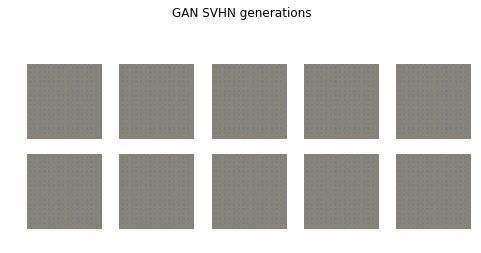

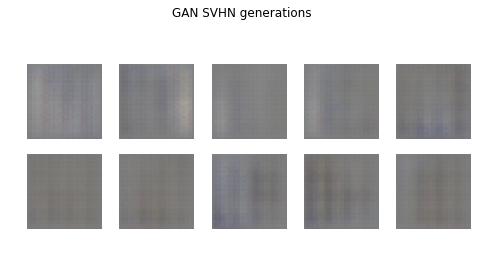

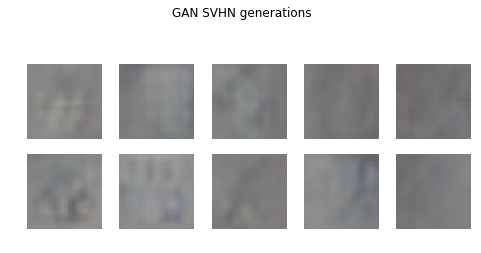

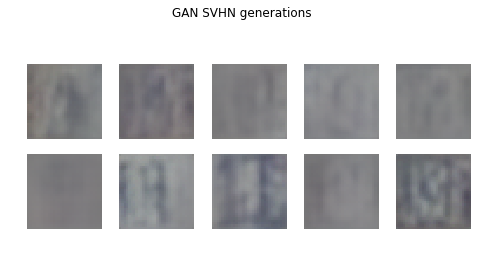

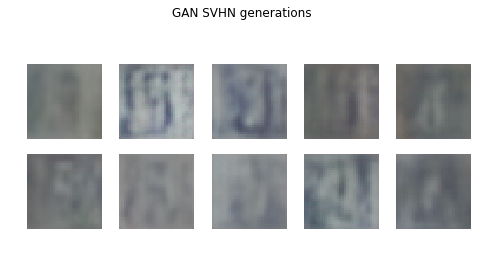

...

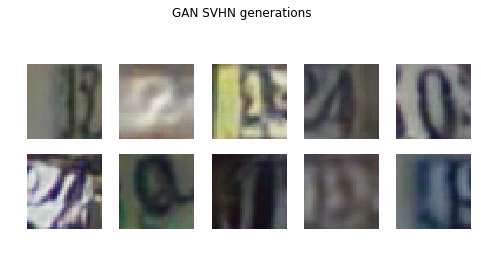

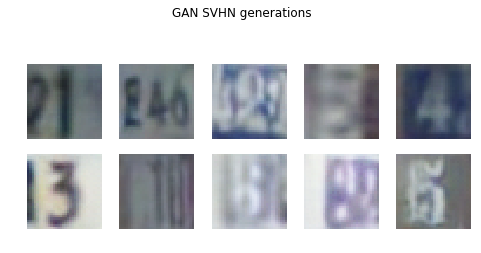

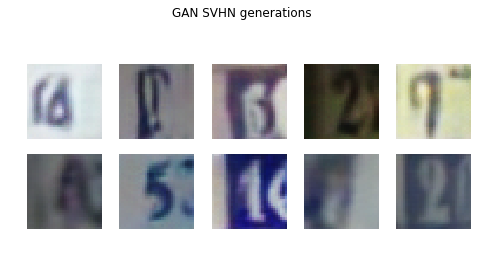

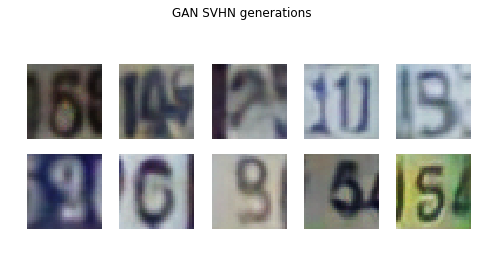

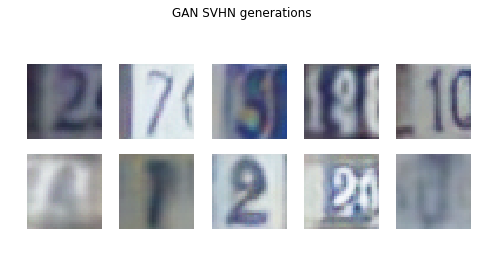

In [14]:
from utils.train_eval_utils_gan import train_model
print('~~~ Training with GPU ~~~') if use_cuda else print('~~~ Training with CPU ~~~\n')
num_params = sum(p.numel() for p in generator.parameters() if p.requires_grad)
print('Generator has %.2fM trainable parameters.' % (num_params/1e6))
num_params = sum(p.numel() for p in discriminator.parameters() if p.requires_grad)
print('Discriminator has %.2fM trainable parameters.\n' % (num_params/1e6))

optimizer_d = torch.optim.Adam(discriminator.parameters(), lr=learning_rate, betas=(b1, b2))
optimizer_g = torch.optim.Adam(generator.parameters(), lr=learning_rate, betas=(b1, b2))
train_model(discriminator, generator, optimizer_d, optimizer_g,
            loader_train, loader_val, num_iterations, d_iterations, device, use_cuda, batch_size, scale)

In [15]:
PATH = 'generator%d.pt' % num_iterations
torch.save(generator, PATH)
PATH = 'discriminator%d.pt' % num_iterations
torch.save(discriminator, PATH)

# C. Qualitative Evaluation

## C.1. Generate Samples

In [16]:
num_generations = 64

### VAE

In [17]:
z = torch.randn(num_generations, num_latent).to(device)
model.eval()
with torch.no_grad():
    vae_generations = model.sample(z).cpu().numpy()
vae_generations = np.transpose(scale(vae_generations), (0, 2, 3, 1)).astype('uint8')

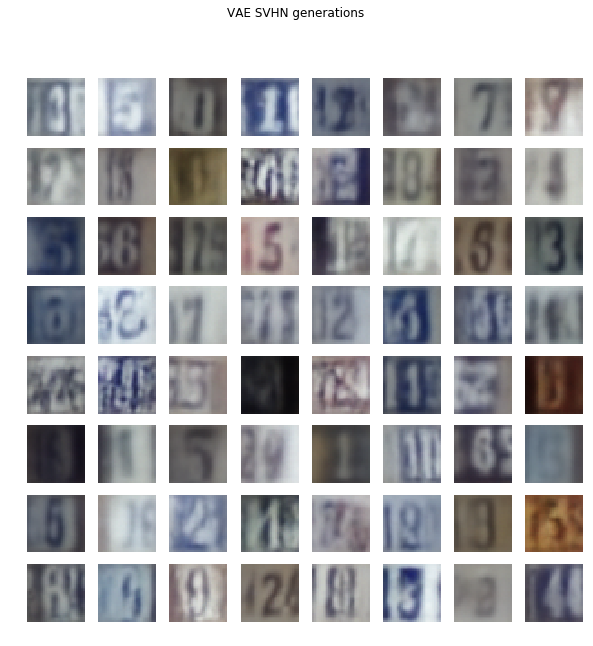

In [18]:
from utils.plotter import plot_and_save_images
plot_and_save_images(vae_generations, 'VAE')

### GAN

In [19]:
z = torch.randn(num_generations, num_latent).to(device)
generator.eval()
with torch.no_grad():
    gan_generations = generator.sample(z).cpu().numpy()
gan_generations = np.transpose(scale(gan_generations), (0, 2, 3, 1)).astype('uint8')

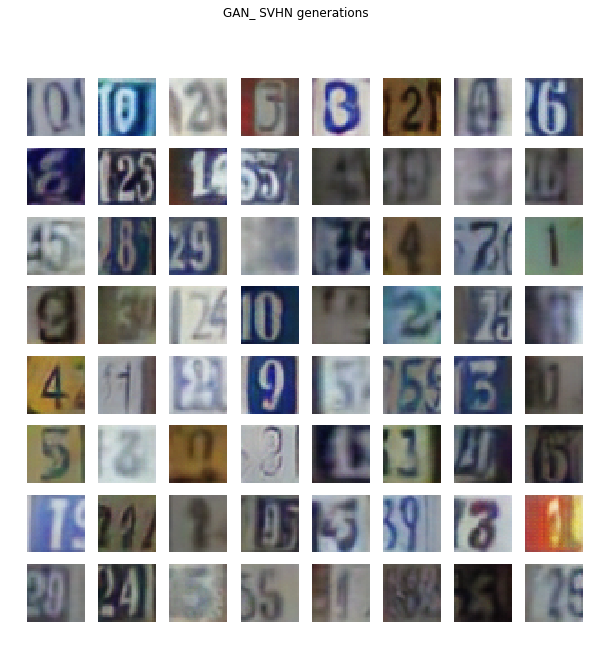

In [20]:
from utils.plotter import plot_and_save_images
plot_and_save_images(gan_generations, 'GAN_')

## C.2. Disentanglement

### VAE

In [188]:
epsilon = 1.5
top_n = 15
num_interp = 9
z = torch.randn((1, num_latent)).to(device)

In [189]:
# Find dimensions that result in the most change:
vae_disentanglement = np.zeros((num_latent, 3, 32, 32))

model.eval()
with torch.no_grad():
    original = model.sample(z).cpu().numpy()
    for i in range(num_latent):
        z_ = z.clone().detach()
        z_[0, i] += epsilon
        vae_disentanglement[i] = model.sample(z_).cpu().numpy()

diff = np.sum((vae_disentanglement - original)**2, axis=(1,2,3))
topn_features = diff.argsort()[-top_n:][::-1]

print('Most effective latent dimensions:')
print(topn_features)

Most effective latent dimensions:
[36 48 78 90 32 12 37 56 59 49 47 82 42 35 10]


In [190]:
# Traverse along those dimensions:
vae_disentanglement = np.zeros((top_n, num_interp, 3, 32, 32))
with torch.no_grad():
    for i, feature in enumerate(topn_features):
        z_ = z.clone().detach()
        z_[0, feature] -= epsilon * np.floor(float(num_interp) / 2)
        for j in range(num_interp):
            if j != 0: z_[0, feature] += epsilon
            vae_disentanglement[i, j] = model.sample(z_).cpu().numpy()

vae_disentanglement = np.transpose(scale(vae_disentanglement), (0, 1, 3, 4, 2)).astype('uint8')

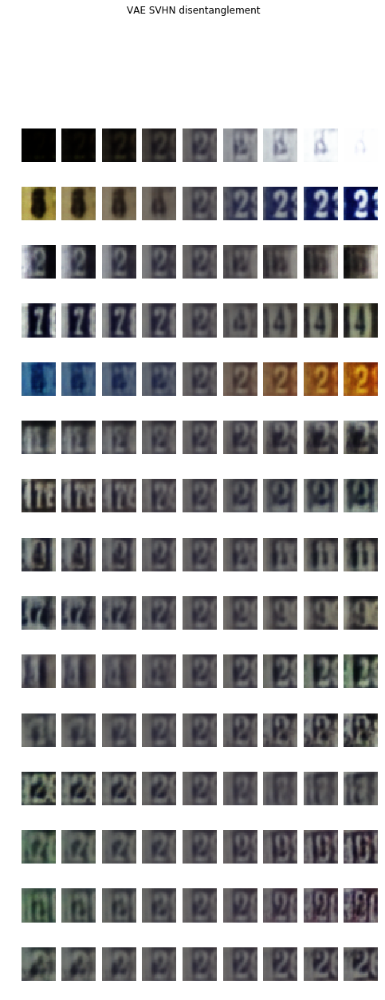

In [191]:
# Plot and save results
from utils.plotter import plot_and_save_disentanglement
plot_and_save_disentanglement(vae_disentanglement, num_rows=top_n, num_cols=num_interp, modelname='VAE')

### GAN

In [220]:
epsilon = 1.5
top_n = 15
num_interp = 9
z = torch.randn((1, num_latent)).to(device)

In [221]:
# Find dimensions that result in the most change:
gan_disentanglement = np.zeros((num_latent, 3, 32, 32))

generator.eval()
with torch.no_grad():
    original = generator.sample(z).cpu().numpy()
    for i in range(num_latent):
        z_ = z.clone().detach()
        z_[0, i] += epsilon
        gan_disentanglement[i] = generator.sample(z_).cpu().numpy()

diff = np.sum((gan_disentanglement - original)**2, axis=(1,2,3))
topn_features = diff.argsort()[-top_n:][::-1]

print('Most effective latent dimensions:')
print(topn_features)

Most effective latent dimensions:
[90  8 82 18 48  4 14 63 98  5  0 70 21 47 50]


In [222]:
# Traverse along those dimensions:
gan_disentanglement = np.zeros((top_n, num_interp, 3, 32, 32))
with torch.no_grad():
    for i, feature in enumerate(topn_features):
        z_ = z.clone().detach()
        z_[0, feature] -= epsilon * np.floor(float(num_interp) / 2)
        for j in range(num_interp):
            if j != 0: z_[0, feature] += epsilon
            gan_disentanglement[i, j] = generator.sample(z_).cpu().numpy()

gan_disentanglement = np.transpose(scale(gan_disentanglement), (0, 1, 3, 4, 2)).astype('uint8')

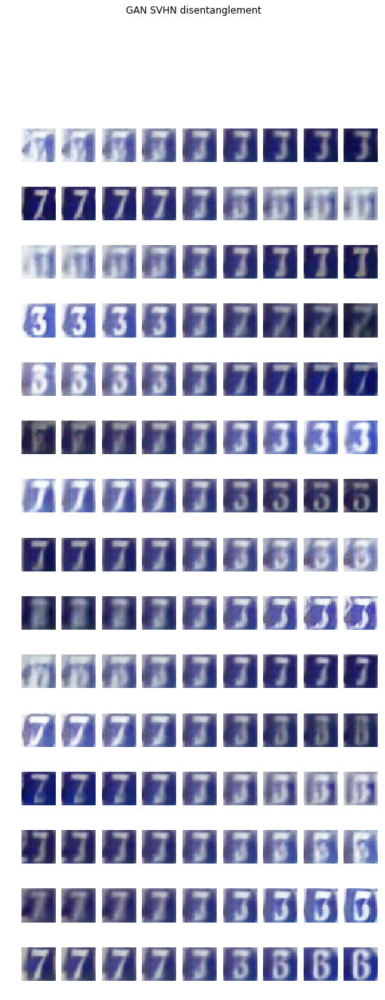

In [223]:
# Plot and save results
from utils.plotter import plot_and_save_disentanglement
plot_and_save_disentanglement(gan_disentanglement, num_rows=top_n, num_cols=num_interp, modelname='GAN')

## C.3. Interpolation

### VAE latent

In [86]:
num_interp = 11

z0 = torch.randn((1, num_latent)).to(device)
z1 = torch.randn((1, num_latent)).to(device)

In [87]:
scales = np.linspace(0, 1, num_interp)
vae_latent = np.zeros((num_interp, 3, 32, 32))
with torch.no_grad():
    for i, s in enumerate(scales):
        z = (s * z0) + ((1 - s) * z1)
        vae_latent[i] = model.sample(z).cpu().numpy()

vae_latent = np.transpose(scale(vae_latent), (0, 2, 3, 1)).astype('uint8')

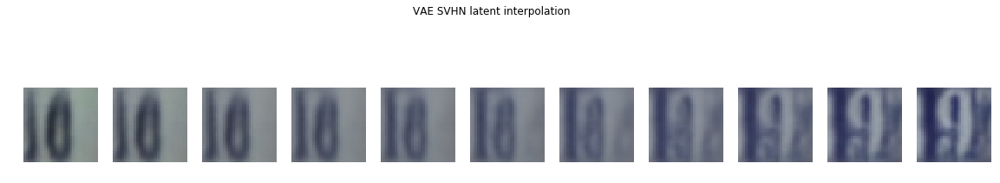

In [88]:
from utils.plotter import plot_and_save_interpolation
plot_and_save_interpolation(vae_latent, num_cols=num_interp, spacename='latent', modelname='VAE')

### VAE data

In [89]:
scales = np.linspace(0, 1, num_interp)
vae_data = np.zeros((num_interp, 3, 32, 32))
with torch.no_grad():
    data0 = model.sample(z0).cpu().numpy()
    data1 = model.sample(z1).cpu().numpy()

for i, s in enumerate(scales):
    data = (s * data0) + ((1 - s) * data1)
    vae_data[i] = data

vae_data = np.transpose(scale(vae_data), (0, 2, 3, 1)).astype('uint8')

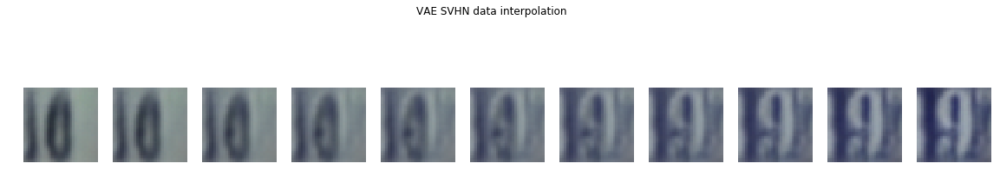

In [90]:
plot_and_save_interpolation(vae_data, num_cols=num_interp, spacename='data', modelname='VAE')

### GAN latent

In [94]:
z0 = torch.randn((1, num_latent)).to(device)
z1 = torch.randn((1, num_latent)).to(device)

In [95]:
scales = np.linspace(0, 1, num_interp)
gan_latent = np.zeros((num_interp, 3, 32, 32))
with torch.no_grad():
    for i, s in enumerate(scales):
        z = (s * z0) + ((1 - s) * z1)
        gan_latent[i] = generator.sample(z).cpu().numpy()

gan_latent = np.transpose(scale(gan_latent), (0, 2, 3, 1)).astype('uint8')

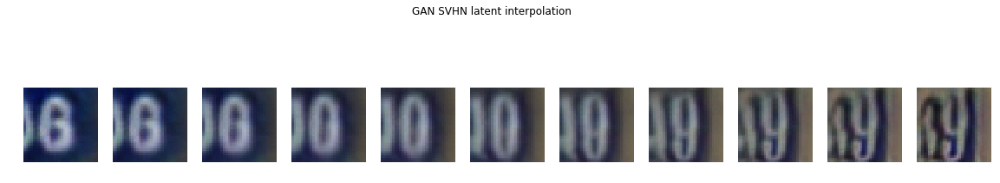

In [96]:
from utils.plotter import plot_and_save_interpolation
plot_and_save_interpolation(gan_latent, num_cols=11, spacename='latent', modelname='GAN')

### GAN data

In [97]:
scales = np.linspace(0, 1, num_interp)
gan_data = np.zeros((num_interp, 3, 32, 32))
with torch.no_grad():
    data0 = generator.sample(z0).cpu().numpy()
    data1 = generator.sample(z1).cpu().numpy()

for i, s in enumerate(scales):
    data = (s * data0) + ((1 - s) * data1)
    gan_data[i] = data

gan_data = np.transpose(scale(gan_data), (0, 2, 3, 1)).astype('uint8')

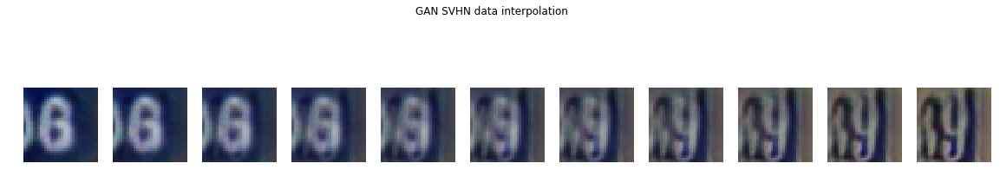

In [98]:
plot_and_save_interpolation(gan_data, num_cols=num_interp, spacename='data', modelname='GAN')

# D. Quantitative Evaluations

In [39]:
num_generations = 1000

### VAE Generate & Store Samples

In [40]:
z = torch.randn(num_generations, num_latent).to(device)
model.eval()
with torch.no_grad():
    vae_generations = model.sample(z).cpu().numpy()
vae_generations = np.transpose(scale(vae_generations), (0, 2, 3, 1)).astype('uint8')

In [41]:
from utils.plotter import sample_saver
sample_saver(vae_generations, path='samples\\VAE\\subfolder')

### VAE FID score

In [138]:
! python score_fid.py --model=svhn_classifier.pt samples\VAE

Test
Using downloaded and verified file: Dataset\SVHN\test_32x32.mat
Used epsilon: 1.0E-09
FID score: 31648.761138723774


### GAN Generate & Store Samples

In [43]:
z = torch.randn(num_generations, num_latent).to(device)
generator.eval()
with torch.no_grad():
    gan_generations = generator.sample(z).cpu().numpy()
gan_generations = np.transpose(scale(gan_generations), (0, 2, 3, 1)).astype('uint8')

In [44]:
from utils.plotter import sample_saver
sample_saver(gan_generations, path='samples\\GAN\\subfolder')

### GAN FID score

In [139]:
! python score_fid.py --model=svhn_classifier.pt samples\GAN

Test
Using downloaded and verified file: Dataset\SVHN\test_32x32.mat
Used epsilon: 1.0E+00
FID score: 8525.787152984225
